# Install the library and download the necessary file

In [ ]:
!pip install pytorch_lightning
!pip install umap
!pip install scanpy
!pip install scvelo
!pip install python-igraph
!pip install tslearn
!pip install sklearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 777.7/777.7 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3543 sha256=cb2534b0cc97dc3b721ed76866dc71c96643c9751e9d66dd23ed74f9436b5704
  Stored in directory: /root/.cache/pip/wheels/15/f1/28/53dcf7a309118ed35d810a5f9cb995217800f3f269ab5771cb
Successfully built umap
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.9/119.9 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 5.7 MB/s eta 0:00:00
  Created wheel for umap-learn: file

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -av "/content/drive/MyDrive/student_majima/Data/20230223Larry_adata.h5ad" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/20230413_total_adata.h5ad" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/processed_iep_hf1_reaggr.h5ad" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/total_z.csv" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/z_series.csv" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/inf_adata_obs.csv" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/inf_adata_var.csv" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/PanglaoDB.csv" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/tf_target.txt"  "/content/"

'/content/drive/MyDrive/student_majima/Data/20230223Larry_adata.h5ad' -> '/content/20230223Larry_adata.h5ad'
'/content/drive/MyDrive/student_majima/Data/20230413_total_adata.h5ad' -> '/content/20230413_total_adata.h5ad'
'/content/drive/MyDrive/student_majima/Data/processed_iep_hf1_reaggr.h5ad' -> '/content/processed_iep_hf1_reaggr.h5ad'
'/content/drive/MyDrive/student_majima/Data/total_z.csv' -> '/content/total_z.csv'
'/content/drive/MyDrive/student_majima/Data/z_series.csv' -> '/content/z_series.csv'
'/content/drive/MyDrive/student_majima/Data/inf_adata_obs.csv' -> '/content/inf_adata_obs.csv'
'/content/drive/MyDrive/student_majima/Data/inf_adata_var.csv' -> '/content/inf_adata_var.csv'
'/content/drive/MyDrive/student_majima/Data/PanglaoDB.csv' -> '/content/PanglaoDB.csv'


In [ ]:
!cp -av "/content/drive/MyDrive/student_majima/Data/20231123_hematopoiesis/202311231230_model_parameters.pth" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/20231123_hematopoiesis/202312161002_select_adata.h5ad" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/20231123_hematopoiesis/202311231230_var_list.csv" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/20231123_hematopoiesis/202312190720_trans.joblib" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/20231123_hematopoiesis/202311231442_inf_adata.h5ad" "/content/"
!cp -av "/content/drive/MyDrive/student_majima/Data/20231123_hematopoiesis/202401121044_check_adata.h5ad" "/content/"

# Define data processing and training functions

In [ ]:
import random
import pandas as pd
import scanpy as sc
import numpy as np
import anndata

def select_anndata(adata, batch_size=20):

    selected_cells = []

    lineage_counts = adata.obs['Lineage'].value_counts()
    lineage_with_30_cells = lineage_counts[lineage_counts >= batch_size].index

    selected_lineages = []
    for lineage in lineage_with_30_cells:
        if any(adata.obs['Day'][adata.obs['Lineage'] == lineage] == 2):
            selected_lineages.append(lineage)

    for lineage in selected_lineages:
        selected_batch_cells = []
        cells_with_day2 = adata.obs.index[(adata.obs['Lineage'] == lineage) & (adata.obs['Day'] == 2)]
        if len(cells_with_day2) > 0:
            selected_day2_cell = random.choice(cells_with_day2)
            selected_batch_cells.append(selected_day2_cell)


        cells_in_lineage = adata.obs.index[(adata.obs['Lineage'] == lineage)]
        cells_in_lineage = cells_in_lineage[cells_in_lineage != selected_day2_cell]
        rest_of_batch_cells = random.sample(cells_in_lineage.tolist(), (int(batch_size) - 1))
        selected_batch_cells.extend(rest_of_batch_cells)

        if len(selected_batch_cells) == batch_size:
            selected_cells.extend(selected_batch_cells)
        else:
            print('lineage number error')
            print(len(selected_batch_cells))

    selected_adata = adata[selected_cells]

    return(selected_adata)


def heldout_anndata(adata, batch_size=20):

    selected_cells = []
    rest_of_cells = []
    selected_lineages = []
    for lineage in adata.obs['Lineage'].unique():
        lineage_cells = adata.obs.index[adata.obs['Lineage'] == lineage]

        if any(adata.obs['Day'][lineage_cells] == 2):
            day2_cells = lineage_cells[adata.obs['Day'][lineage_cells] == 2]
            day6_cells = lineage_cells[adata.obs['Day'][lineage_cells] == 6]

            if len(day2_cells)+len(day6_cells) > batch_size:
                selected_lineages.append(lineage)


    for lineage in selected_lineages:
        selected_batch_cells = []
        cells_with_day2 = adata.obs.index[(adata.obs['Lineage'] == lineage) & (adata.obs['Day'] == 2)]
        if len(cells_with_day2) > 0:
            selected_day2_cell = random.choice(cells_with_day2)
            selected_batch_cells.append(selected_day2_cell)

        cells_in_lineage = adata.obs.index[(adata.obs['Lineage'] == lineage) & ((adata.obs['Day'] == 2) | (adata.obs['Day'] == 6))]
        cells_in_lineage = cells_in_lineage[cells_in_lineage != selected_day2_cell]
        rest_of_batch_cells = random.sample(cells_in_lineage.tolist(), (int(batch_size) - 1))
        selected_batch_cells.extend(rest_of_batch_cells)

        if len(selected_batch_cells) == batch_size:
            selected_cells.extend(selected_batch_cells)

    heldout_adata = adata[selected_cells]

    for lineage in selected_lineages:
        selected_batch_cells = []
        cells_day4 = adata.obs.index[(adata.obs['Lineage'] == lineage) & (adata.obs['Day'] == 4)]
        rest_of_cells.extend(cells_day4)

    rest_of_adata = adata[rest_of_cells]

    return(heldout_adata, rest_of_adata)


def anndata_preprocessing(adata, n_top_genes=None, min_genes=None, target_sum=None):
    """
    Preprocesses AnnData object based on provided parameters.

    Parameters:
        adata (AnnData): Annotated data matrix with cells as rows and features as columns.
        n_top_genes (int or None): Number of highly variable genes to select.
        min_genes (int or None): Minimum number of genes expressed in cells to retain a cell.

    Returns:
        None (Modifies the input AnnData object in place)
    """
    adata = adata[~adata.obs['Day'].isna()] # Drop NaN
    sc.pp.log1p(adata) # logarization
    if n_top_genes is not None:
        sc.pp.highly_variable_genes(adata, n_top_genes=n_top_genes)
    else:
        sc.pp.highly_variable_genes(adata)
    sc.pl.highly_variable_genes(adata)
    if min_genes is not None:
        sc.pp.filter_cells(adata, min_genes=min_genes)
    else:
        sc.pp.filter_cells(adata) # Exclude cells expressing too few genes
    if target_sum is not None:
        sc.pp.normalize_total(adata, target_sum=target_sum)
    else:
        sc.pp.normalize_total(adata) # Normalization

    return(adata)


def extract_highly_variable_genes(adata):
    var_list = []
    for i, is_highly_variable in enumerate(adata.var['highly_variable']):
        if is_highly_variable:
            var_list.append(adata.var.index[i])
    return var_list


def select_dataset(adata, batch_size):

    lineage_counts = adata.obs['Lineage'].value_counts()
    lineage_with_30_cells = lineage_counts[lineage_counts >= batch_size].index
    selected_adata = []
    for lineage in lineage_with_30_cells:
        lineage_cells = adata[adata.obs['Lineage'] == lineage]
        days = np.unique(lineage_cells.obs['Day'])
        selected_cells = []
        selected_days = set()

        for day in days:
            day_cells = lineage_cells[lineage_cells.obs['Day'] == day]
            random_cell_idx = np.random.choice(len(day_cells), size=1, replace=False)[0]
            selected_cells.extend(day_cells[random_cell_idx])
            selected_days.add(day)

            if len(selected_cells) >= batch_size:
                break

            if len(selected_days) == len(days):
                break

        if len(selected_cells) < batch_size:
            additional_cells_needed = batch_size - len(selected_cells)
            selected_cell_identifiers = [cell.obs_names[0] for cell in selected_cells]
            remaining_cells = [cell for cell in lineage_cells if cell.obs_names[0] not in selected_cell_identifiers]
            remaining_cells = anndata.concat(remaining_cells)
            additional_cells_idx = np.random.choice(len(remaining_cells), size=additional_cells_needed, replace=False)[0:additional_cells_needed]
            additional_cells = remaining_cells[additional_cells_idx]
            selected_cells.extend(additional_cells)

        selected_cells = anndata.concat(selected_cells)
        selected_adata.append(selected_cells)

    return(selected_adata)


def select_undifferentiated_anndata(adata, selected_adata, undifferentiated_cell_size, initial=False):
    undifferentiated_sample_list = []
    subgroup_indices = np.where((adata.obs['Day'] == 0) | (adata.obs['Day'] == 6))[0]
    subgroup_adata = adata[subgroup_indices]

    if initial:
        for i in range(len(selected_adata)):
            initial_cell_index = random.choice(adata[adata.obs['Day'] == 0].obs.index)
            additional_cells = adata[initial_cell_index]
            undifferentiated_cell_size_i = undifferentiated_cell_size - len(additional_cells)
            selected_cell_identifiers = [cell.obs_names[0] for cell in undifferentiated_sample_list]
            remaining_cells = [cell for cell in subgroup_adata if cell.obs_names[0] not in selected_cell_identifiers]
            remaining_cells = anndata.concat(remaining_cells)
            additional_cells_idx = np.random.choice(len(remaining_cells), size=undifferentiated_cell_size_i, replace=False)[0:undifferentiated_cell_size_i]
            additional_cells = anndata.concat([additional_cells, remaining_cells[additional_cells_idx]])
            additional_cells = anndata.concat(additional_cells)
            undifferentiated_sample_list.append(additional_cells)

        initial_cells_idx = np.where(subgroup_adata.obs['Day'] == 0)[0]
        initial_cells = subgroup_adata[initial_cells_idx]
        undifferentiated_sample_list.append(initial_cells)


    else:
        for i in range(len(selected_adata)):
            selected_cell_identifiers = [cell.obs_names[0] for cell in undifferentiated_sample_list]
            remaining_cells = [cell for cell in subgroup_adata if cell.obs_names[0] not in selected_cell_identifiers]
            remaining_cells = anndata.concat(remaining_cells)
            additional_cells_idx = np.random.choice(len(remaining_cells), size=undifferentiated_cell_size, replace=False)[0:undifferentiated_cell_size]
            additional_cells = remaining_cells[additional_cells_idx]
            additional_cells = anndata.concat(additional_cells)
            undifferentiated_sample_list.append(additional_cells)

    return(undifferentiated_sample_list)


def anndata_for_dynamics_inference(selected_adata, undifferentiated_sample_list=None):
    adata_list = []

    if undifferentiated_sample_list is not None:
        for i in range(len(selected_adata)):
            adata_i = selected_adata[i]
            adata_i = adata_i.concatenate(undifferentiated_sample_list[i])
            adata_list.append(adata_i)
    else:
        for i in range(len(selected_adata)):
            adata_i = selected_adata[i]
            adata_list.append(adata_i)

    select_adata = anndata.concat(adata_list)

    return (select_adata)

In [ ]:
import torch
import numpy as np

class LineageVAEDataSet(torch.utils.data.Dataset):
    def __init__(self, s, u, day, norm_mat, transform=None, pre_transform=None):
        self.s = s
        self.u = u
        self.day = day
        self.norm_mat = norm_mat

    def __len__(self):
        return(self.s.shape[0])

    def __getitem__(self, idx):
        idx_s = self.s[idx]
        idx_u = self.u[idx]
        idx_day = self.day[idx]
        idx_norm_mat = self.norm_mat[idx]
        return(idx_s, idx_u, idx_day, idx_norm_mat)


class LineageVAEDataManager():
    def __init__(self, s, u, day, test_ratio, batch_size, num_workers, t_num, validation_ratio=(1/12)):
        s = s.float()
        u = u.float()
        day = day.float()
        norm_mat = torch.sum(s, dim=1).view(-1, 1) * torch.sum(s, dim=0).view(1, -1)
        norm_mat = torch.mean(s) * norm_mat / torch.mean(norm_mat)
        self.s = s
        self.u = u
        self.day = day
        self.norm_mat = norm_mat
        total_num = s.shape[0]
        validation_num = int(total_num * validation_ratio)
        test_num = int(total_num * test_ratio)
        np.random.seed(42)
        idx = np.arange(total_num)
        validation_idx, test_idx, train_idx = idx[:validation_num], idx[validation_num:(validation_num +  test_num)], idx[(validation_num +  test_num):]
        self.validation_idx, self.test_idx, self.train_idx = validation_idx, test_idx, train_idx
        self.validation_s = s[validation_idx]
        self.validation_u = u[validation_idx]
        self.validation_day = day[validation_idx]
        self.validation_norm_mat = norm_mat[validation_idx]
        self.test_s = s[test_idx]
        self.test_u = u[test_idx]
        self.test_day = day[test_idx]
        self.test_norm_mat = norm_mat[test_idx]
        self.train_eds = LineageVAEDataSet(s[train_idx], u[train_idx], day[train_idx], norm_mat[train_idx])
        self.train_loader = torch.utils.data.DataLoader(
            self.train_eds, batch_size=batch_size, shuffle=False, num_workers=num_workers, drop_last=True) #false

In [ ]:
import torch.distributions as dist
import random

def calc_kld(qz):
    kld = -0.5 * (1 + qz.scale.pow(2).log() - qz.loc.pow(2) - qz.scale.pow(2))
    return(kld)


def calc_poisson_loss(ld, norm_mat, obs):
    p_z = dist.Poisson(ld * norm_mat)
    l = - p_z.log_prob(obs)
    return(l)


def calc_nb_loss(ld, norm_mat, theta, obs):
    ld = norm_mat * ld
    p =  ld / (ld + theta)
    p_z = dist.NegativeBinomial(theta, p)
    l = - p_z.log_prob(obs)
    return(l)


def calc_normal_loss(z0, mu, sigma):
    p_z0 = dist.Normal(mu, sigma)
    l = - p_z0.log_prob(z0)
    return(l)


def calc_lptr(z_list, sigma, day):
    tr_num = z_list.shape[0] - 2
    lptr_list = []
    for i in range (tr_num):
        lptr = calc_normal_loss(z_list[i], z_list[i+1], sigma)
        lptr_list.append(lptr)
    cell = 0
    lptr = 0
    for cell, t in enumerate(day):
        t = int(t) - 1
        for i in range(t):
            lptr_t = lptr_list[i][cell]
            lptr += torch.sum(lptr_t, dim=-1)
    return(lptr)


def take_t(t_list, day_maxs, t):
    take_list = []
    for i, day_max in enumerate(day_maxs):
        day_max = day_max
        t_idx = int(day_max - t)
        a = t_list[t_idx][i]
        take_list.append(a)
    take_list = torch.stack(take_list)
    return(take_list)


def qz_series(qz_mu_list, qz_logvar_list, day, initial):
    cell = 0
    qz_series_list = []
    for t in day:
        t = int(t) - initial
        for i in range(t):
            qz = dist.Normal(qz_mu_list[i][cell], softplus(qz_logvar_list[i][cell]))
            qz_series_list.append(qz)
        cell += 1
    return(qz_series_list)


def stratified_sampling(day):
    stratified_list = []
    day_list = []
    for a in torch.unique(day).to(torch.int32).tolist():
        a1 = random.choice([i for i, x in enumerate(day) if x == a])
        day_list.append(a1)
    return(day_list)


def upsampling_z(qz_mu_T0, qz_logvar_T0, day, timepoint, upsample_num, z_dim):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    upsampled_day = torch.concat((day, timepoint*torch.ones(upsample_num).to(device)),0).to(device)
    pseudo_cell_num = qz_mu_T0[day == timepoint].shape[0]
    if pseudo_cell_num == 0:
        qz2_mu_T0 = torch.zeros(upsample_num, z_dim).to(device)
        qz2_logvar_T0 = torch.zeros(upsample_num, z_dim).to(device)
        z2_T0 = torch.zeros(upsample_num, z_dim).to(device)
    else:
        param_list = []
        for i in range(upsample_num):
            param_list.append(random.randint(0, pseudo_cell_num-1))
        qz2_mu_T0_list = []
        qz2_logvar_T0_list = []
        for k in param_list:
            qz2_mu_T0_list.append(qz_mu_T0[day == timepoint][k])
            qz2_logvar_T0_list.append(qz_logvar_T0[day == timepoint][k])
        qz2_mu_T0 = torch.stack(qz2_mu_T0_list, dim=0).to(device)
        qz2_logvar_T0 = torch.stack(qz2_logvar_T0_list, dim=0).to(device)
        qz2_T0 = dist.Normal(qz2_mu_T0, qz2_logvar_T0)
        z2_T0 = qz2_T0.rsample()
        z2_T0 = z2_T0.to(device)
    return(qz2_mu_T0, qz2_logvar_T0, z2_T0)

In [ ]:
import pandas as pd
import torch
import torch.distributions as dist
import torch.nn as nn
from torch.nn.parameter import Parameter
from torch import functional as F
from torch.distributions.kl import kl_divergence
from torch.nn import init
import numpy as np
import random

class LinearReLU(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LinearReLU, self).__init__()
        self.f = nn.Sequential(
            nn.Linear(input_dim, output_dim),
            nn.LayerNorm(output_dim, elementwise_affine=False),
            nn.ReLU(True))

    def forward(self, x):
        h = self.f(x)
        return(h)


class SeqNN(nn.Module):
    def __init__(self, num_steps, dim):
        super(SeqNN, self).__init__()
        modules = [
            LinearReLU(dim, dim)
            for _ in range(num_steps)
        ]
        self.f = nn.Sequential(*modules)

    def forward(self, pre_h):
        post_h = self.f(pre_h)
        return(post_h)


class Encoder(nn.Module):
    def __init__(self, num_h_layers, x_dim, h_dim, z_dim):
        super(Encoder, self).__init__()
        self.x2h = LinearReLU(x_dim, h_dim)
        self.seq_nn = SeqNN(num_h_layers - 1, h_dim)
        self.h2mu = nn.Linear(h_dim, z_dim)
        self.h2logvar = nn.Linear(h_dim, z_dim)

    def forward(self, x):
        pre_h = self.x2h(x)
        post_h = self.seq_nn(pre_h)
        mu = self.h2mu(post_h)
        logvar = self.h2logvar(post_h)
        return(mu, logvar)


class Decoder(nn.Module):
    def __init__(self, num_h_layers, z_dim, h_dim, x_dim):
        super(Decoder, self).__init__()
        self.z2h = LinearReLU(z_dim, h_dim)
        self.seq_nn = SeqNN(num_h_layers - 1, h_dim)
        self.h2ld = nn.Linear(h_dim, x_dim)
        self.softplus = nn.Softplus()

    def forward(self, z):
        pre_h = self.z2h(z)
        post_h = self.seq_nn(pre_h)
        ld = self.h2ld(post_h)
        correct_ld = self.softplus(ld)
        return(correct_ld)

#
class VectorField(nn.Module):
    def __init__(self, num_h_layers, z_dim, h_dim):
        super(VectorField, self).__init__()
        self.x2h = LinearReLU(z_dim, h_dim)
        self.seq_nn = SeqNN(num_h_layers - 1, h_dim)
        self.h2v = nn.Linear(h_dim, z_dim)

    def forward(self, x):
        pre_h = self.x2h(x)
        post_h = self.seq_nn(pre_h)
        v = self.h2v(post_h)
        return(v)

#
class StochasticVectorField(nn.Module):
    def __init__(self, num_h_layers, z_dim, h_dim):
        super(StochasticVectorField, self).__init__()
        self.z2sigmu = Encoder(num_h_layers, z_dim, h_dim, z_dim)
        self.softplus = nn.Softplus()

    def forward(self, z):
        qd_mu, qd_logvar  = self.z2sigmu(z)
        qd = dist.Normal(qd_mu, self.softplus(qd_logvar))
        d = qd.rsample()
        return(d, qd.loc, qd.scale)
#
def apply_with_batch(f, x, s):
    xs = torch.cat([x, s], dim=-1)
    out = f(xs)
    return out

class EncoderBatch(nn.Module):
    def __init__(self, num_enc_z_h_layers, x_dim, enc_z_h_dim, z_dim, use_batch_bias=False):
        super(EncoderBatch, self).__init__()
        if use_batch_bias:
            self.encode_z = Encoder(num_enc_z_h_layers, x_dim, enc_z_h_dim, z_dim)
            self.main = self.encode_no_batch_z
        else:
            self.encode_z = Encoder(num_enc_z_h_layers, x_dim, enc_z_h_dim, z_dim)
            self.main = self.encode_batch_z_concat

    def encode_batch_z_concat(self, x, s):
        mu, logvar = apply_with_batch(self.encode_z, x, s)
        return mu, logvar

    def encode_no_batch_z(self, x, s):
        mu, logvar = self.encode_z(x)
        return mu, logvar

    def forward(self, x, s):
        mu, logvar = self.main(x, s)
        return(mu, logvar)

class DecoderBatch(nn.Module):
    def __init__(self, num_h_layers, z_dim, h_dim, x_dim, use_batch_bias=False):
        super(DecoderBatch, self).__init__()
        if use_batch_bias:
            self.decode_z = Decoder(num_h_layers, z_dim, h_dim, x_dim)
            self.main = self.decode_no_batch_z
        else:
            self.decode_z = Decoder(num_h_layers, z_dim, h_dim, x_dim)
            self.main = self.decode_batch_z_concat

    def decode_no_batch_z(self, z, s):
        px_z_ld = self.decode_z(z)
        return px_z_ld

    def decode_batch_z_concat(self, z, s):
        px_z_ld = apply_with_batch(self.decode_z, z, s)
        return px_z_ld

    def forward(self, x, s):
        px_z_ld = self.main(x, s)
        return(px_z_ld)


class LineageVAE(nn.Module):
    def __init__(
            self,
            x_dim, z_dim,
            enc_z_h_dim, dec_z_h_dim, enc_d_h_dim,
            num_enc_z_layers, num_dec_z_layers, num_enc_d_layers,
            t_num, d_mode='stochastic', undifferentiated=None, norm_input=False, kinetics=False):
        super(LineageVAE, self).__init__()
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.enc_z = EncoderBatch(num_enc_z_layers, x_dim, enc_z_h_dim, z_dim, use_batch_bias=True)
        self.enc_d = Encoder(num_enc_d_layers, z_dim, enc_d_h_dim, z_dim)
        self.dec_z = DecoderBatch(num_enc_z_layers, z_dim, dec_z_h_dim, x_dim, use_batch_bias=True)
        self.enc_s = Encoder(num_enc_z_layers, z_dim, enc_z_h_dim, 1)

        self.upsample_num = 20
        self.dt = 1
        self.gamma_mean = 0.05
        self.d_coeff = Parameter(torch.Tensor(1))
        self.loggamma = Parameter(torch.Tensor(x_dim))
        self.logbeta = Parameter(torch.Tensor(x_dim))
        self.tr_scale = Parameter(torch.Tensor(1))
        self.z0_scale = Parameter(torch.Tensor(1))
        self.softplus = nn.Softplus()
        self.reset_parameters()
        self.no_lu = False
        self.no_d_kld = False
        self.no_z_kld = False
        self.norm_input = norm_input
        self.z_dim = z_dim
        self.t_num = t_num
        self.undifferentiated = undifferentiated
        self.kinetics= False

    def reset_parameters(self):
        init.normal_(self.loggamma)
        init.normal_(self.logbeta)
        init.normal_(self.tr_scale)
        init.normal_(self.z0_scale)

    def forward(self, x, day):
        # encode z
        x = x.to(self.device)
        day = day.to(self.device)
        batch = torch.ones(x.shape[0]).to(self.device)
        batch = batch*day.to(self.device)
        qz_mu_T0, qz_logvar_T0 = self.enc_z(x, batch)
        qz_mu_T0 = qz_mu_T0.to(self.device)
        qz_logvar_T0 = qz_logvar_T0.to(self.device)
        qz_logvar_T0 = self.softplus(qz_logvar_T0)
        qz_logvar_T0 += 1e-5
        qz_T0 = dist.Normal(qz_mu_T0, qz_logvar_T0)
        z_T0 = qz_T0.rsample().to(self.device)
        if self.undifferentiated is None:
            qz_mu = qz_mu_T0.to(self.device)
            qz_logvar = qz_logvar_T0.to(self.device)
            z = z_T0.to(self.device)
        else:
            qz_mu = qz_mu_T0.to(self.device)
            qz_logvar = qz_logvar_T0.to(self.device)
            z = z_T0.to(self.device)
            qz2_mu_T0, qz2_logvar_T0, z2_T0 = upsampling_z(qz_mu_T0, qz_logvar_T0, day, self.undifferentiated, self.upsample_num, self.z_dim)
            qz2_mu_T0 = qz2_mu_T0.detach().to(self.device)
            qz2_logvar_T0 = qz2_logvar_T0.detach().to(self.device)
            z2_T0 = z2_T0.detach().to(self.device)
            z = torch.cat((z, z2_T0), 0).to(self.device)
        # decode z
        batch = torch.ones(z_T0.shape[0]).to(self.device)
        batch = batch*day.to(self.device)
        ld = self.dec_z(z_T0, batch)
        if self.undifferentiated is None:
            # generate z series
            qz_mu_list = [qz_mu]
            z_list = [z]
            z2_list = []
            qz_logvar_list = [qz_logvar]
        else:
            #concatenate upsampled z
            qz_mu = torch.cat((qz_mu, qz2_mu_T0))
            qz_logvar = torch.cat((qz_logvar, qz2_logvar_T0))
            z_list = [z]
            qz_mu_list = [qz_mu]
            z2_list = [qz2_mu_T0]
            qz_logvar_list = [qz_logvar]
        qd_loc_list = []
        qd_scale_list = []

        for t in range(self.t_num + 1):
            qd_loc, qd_scale = self.enc_d(z)
            qd_scale = qd_scale.to(self.device)
            qd_scale = self.softplus(qd_scale)
            qd_scale += 1e-5
            qd = dist.Normal(qd_loc, qd_scale)
            d_coeff = self.d_coeff.to(self.device)
            d = d_coeff * qd.rsample()
            qz_mu = qz_mu - qd_loc
            z = z - d
            batch = day.cpu()
            qz_mu_list.append(qz_mu)
            qz_logvar_list.append(qz_logvar) #????
            z_list.append(z)
            qd_loc_list.append(qd_loc)
            qd_scale_list.append(self.softplus(qd_scale))
        qz_mu_list = torch.stack(qz_mu_list, dim=0)
        qz_logvar_list = torch.stack(qz_logvar_list, dim=0)
        z_list = torch.stack(z_list, dim=0)
        if self.undifferentiated is None:
            z2_list = torch.zeros(z_list.shape)
        else:
            z2_list = torch.stack(z2_list, dim=0)
        z0_list = take_t(z_list, day, 0)
        qd_loc_list = torch.stack(qd_loc_list, dim=0)
        qd_scale_list = torch.stack(qd_scale_list, dim=0)
        #velocity
        batch = torch.ones(z_T0.shape[0]).to(self.device)
        batch = batch*day.to(self.device)
        velocity = ld - self.dec_z(z_T0, batch)
        gamma = self.softplus(self.loggamma)
        beta = self.softplus(self.logbeta) * self.dt
        pu_zd_ld = self.softplus(velocity + ld * gamma) / beta
        return(z_T0, qz_T0, ld, pu_zd_ld, qz_mu_list, qz_logvar_list, z_list, z0_list, z2_list, qd_loc_list, qd_scale_list)

    def embed_loss(self, x, u, day, norm_mat, turn_on_d_kld=False, kinetics=False):
        if self.norm_input:
            in_x = x / norm_mat
        else:
            in_x = x
        z_T0, qz_T0, ld, pu_zd_ld, qz_mu_list, qz_logvar_list, z_list, z0_list, z2_list, qd_loc_list, qd_scale_list = self(in_x, day)
        #log p(x|zT)
        lx = calc_poisson_loss(ld, norm_mat, x)
        kld = -0.5 * (1 + qz_T0.scale.pow(2).log() - qz_T0.loc.pow(2) - qz_T0.scale.pow(2))
        embed_loss = torch.sum(lx) + torch.sum(kld)
        return(embed_loss)

    def elbo_loss(self, x, u, day, norm_mat, turn_on_d_kld=False, undifferentiated=None, kinetics=False):
        if self.norm_input:
            in_x = x / norm_mat
        else:
            in_x = x
        z_T0, qz_T0, ld, pu_zd_ld, qz_mu_list, qz_logvar_list, z_list, z0_list, z2_list, qd_loc_list, qd_scale_list = self(in_x, day)
        #log p(x|zT)
        lx = calc_poisson_loss(ld, norm_mat, x)
        #log p(z0)
          #z0 = random.choice(z0_list)
          #loc = torch.zeros(z0.shape).to(device)
          #scale = torch.ones(z0.shape).to(device)
          #lpz0 = calc_normal_loss(z0, loc, scale)
        z0_list.to(self.device)
        stratified_z0_list = []
        lpz0 = 0
        if self.undifferentiated is None:
            upsampled_day = day
        else:
            upsampled_day = torch.concat((day, undifferentiated*torch.ones(self.upsample_num).to(self.device)),0)
        day_list = stratified_sampling(day)
        for i in day_list:
            stratified_z0_list.append(z0_list[i])
        for z0 in stratified_z0_list:
            if self.undifferentiated is None:
                loc = torch.zeros(z0.shape).to(self.device)
            else:
                if z2_list.shape[1] == 0:
                    loc = take_t(z_list, upsampled_day, 2).mean(axis=0)
                else:
                    loc = z2_list[0].mean(axis=0)
            scale = torch.ones(z0.shape).to(self.device)
            z0_scale = self.softplus(self.z0_scale)
            scale = scale * z0_scale
            lpz0 += calc_normal_loss(z0, loc, scale)
        lpz0 = 1/len(stratified_z0_list) * lpz0
        #log p(z1|z0)
        lpz1 = 0
        z1_list = take_t(z_list, upsampled_day, 0)
        tr_scale = self.softplus(self.tr_scale)
        scale = torch.ones(z0.shape).to(self.device)
        scale = scale * tr_scale
        for z0 in stratified_z0_list:
            lpz1 += calc_normal_loss(z1_list, z0, scale)
        lpz1 = 1/len(stratified_z0_list) * lpz1
        #log p(zt|zt-1)
        lptr = calc_lptr(z_list, scale, upsampled_day)
        #log q(z0|z1)
        qd1_loc_list = take_t(qd_loc_list, upsampled_day, 1)
        qd1_scale_list = take_t(qd_scale_list, upsampled_day, 1)
        lqz0 = - calc_normal_loss(z0, z1_list - qd1_loc_list, qd1_scale_list).sum(dim=1)
        lqz0 = - torch.logsumexp(lqz0, dim=0)
        #log q(zt-1|zt)
        qz_series_list = qz_series(qz_mu_list, qz_logvar_list, day, 1)
        qz_series_entropy = 0
        for i in range(len(qz_series_list)):
            qz_series_entropy += torch.sum(qz_series_list[i].entropy(), dim=-1)
        if kinetics:
            #log q(z|x)
            lu = calc_poisson_loss(pu_zd_ld, norm_mat, u)
            elbo_loss = torch.sum(lx) + torch.sum(lu) + torch.sum(lpz0) + torch.sum(lpz1) + torch.sum(lptr) - torch.sum(qz_series_entropy) - torch.sum(lqz0)
        else:
            elbo_loss = torch.sum(lx) + torch.sum(lpz0) + torch.sum(lpz1) + torch.sum(lptr) - torch.sum(qz_series_entropy) - torch.sum(lqz0)
        return(elbo_loss, z_list)

In [ ]:
import torch
from torch.utils.data import DataLoader
import numpy as np
import copy

class LineageVAEExperiment:
    def __init__(self, model_params, lr, s, u, day, test_ratio, batch_size, num_workers, validation_ratio, undifferentiated=None, kinetics=False):
        self.edm = LineageVAEDataManager(s, u, day, test_ratio, batch_size, num_workers, validation_ratio)
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = LineageVAE(**model_params, undifferentiated=undifferentiated, kinetics=kinetics)
        self.model.to(self.device)
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=lr)
        self.train_loss_list = []
        self.test_loss_list = []
        self.train_z_list = []
        self.test_z_list = []
        self.best_loss = None
        self.undifferentiated=undifferentiated

    def train_epoch(self):
        self.model.train()
        total_loss = 0
        entry_num = 0
        for s, u, day, norm_mat in self.edm.train_loader:
            s = s.to(self.device)
            u = u.to(self.device)
            day = day.to(self.device)
            norm_mat = norm_mat.to(self.device)
            self.optimizer.zero_grad()
            loss, z_list = self.model.elbo_loss(
                s, u, day, norm_mat, undifferentiated=self.undifferentiated, kinetics=False)
            loss.backward()
            self.optimizer.step()
            total_loss += loss.item()
            entry_num += s.shape[0]
        loss_val = total_loss / entry_num
        self.train_loss_list.append(loss_val)
        self.train_z_list.append(z_list)
        return(total_loss / entry_num)

    def evaluate(self):
        self.model.eval()
        s = self.edm.validation_s.to(self.device)
        u = self.edm.validation_u.to(self.device)
        day = self.edm.validation_day.to(self.device)
        norm_mat = self.edm.validation_norm_mat.to(self.device)
        loss, z_list = self.model.elbo_loss(
            s, u, day, norm_mat, undifferentiated=self.undifferentiated, kinetics=False)
        entry_num = s.shape[0]
        loss_val = loss / entry_num
        return(loss_val)

    def test(self):
        self.model.eval()
        s = self.edm.test_s.to(self.device)
        u = self.edm.test_u.to(self.device)
        day = self.edm.test_day.to(self.device)
        norm_mat = self.edm.test_norm_mat.to(self.device)
        loss, z_list = self.model.elbo_loss(
            s, u, day, norm_mat, undifferentiated=self.undifferentiated, kinetics=False)
        entry_num = s.shape[0]
        loss_val = loss / entry_num
        self.test_loss_list.append(loss_val)
        self.test_z_list.append(z_list)
        return(loss_val)

    def train_total(self, epoch_num):
        for epoch in range(epoch_num):
            state_dict = copy.deepcopy(self.model.state_dict())
            loss = self.train_epoch()
            if np.isnan(loss):
                self.model.load_state_dict(state_dict)
                break
            if epoch % 10 == 0:
                print(f'loss at epoch {epoch} is {loss}')

    def embed_train_epoch(self):
        self.model.train()
        total_loss = 0
        entry_num = 0
        for s, u, day, norm_mat in self.edm.train_loader:
            s = s.to(self.device)
            u = u.to(self.device)
            day = day.to(self.device)
            norm_mat = norm_mat.to(self.device)
            self.optimizer.zero_grad()
            loss = self.model.embed_loss(
                s, u, day, norm_mat)
            loss.backward()
            self.optimizer.step()
            total_loss += loss.item()
            entry_num += s.shape[0]
        return(total_loss / entry_num)

    def embed_test(self):
        self.model.eval()
        s = self.edm.test_s.to(self.device)
        u = self.edm.test_u.to(self.device)
        day = self.edm.test_day.to(self.device)
        norm_mat = self.edm.test_norm_mat.to(self.device)
        loss = self.model.embed_loss(
            s, u, day, norm_mat)
        entry_num = s.shape[0]
        loss_val = loss / entry_num
        return(loss_val)

    def embed_train_total(self, epoch_num):
        for epoch in range(epoch_num):
            state_dict = copy.deepcopy(self.model.state_dict())
            loss = self.embed_train_epoch()
            if np.isnan(loss):
                self.model.load_state_dict(state_dict)
                break
            if epoch % 10 == 0:
                print(f'loss at epoch {epoch} is {loss}')

    def get_forward(self, s):
        z_T0, qz_T0, ld, pu_zd_ld, qz_mu_list, qz_logvar_list, z_list, z0_list, qd_loc_list, qd_scale_list = self.model(s)
        return(z_T0, qz_T0, ld, pu_zd_ld, qz_mu_list, qz_logvar_list, z_list, z0_list, qd_loc_list, qd_scale_list)

    def init_optimizer(self, lr):
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=lr)


In [ ]:
import os
import sys
import pandas as pd
import numpy as np
import umap
import seaborn as sns
from matplotlib import pyplot as plt
import scipy
import torch.distributions as dist
import torch
softplus = nn.Softplus()


def input_checks(adata, kinetics=True):
    if kinetics:
        if (not 'spliced' in adata.layers.keys()) or (not 'unspliced' in adata.layers.keys()):
            raise ValueError(
                f'Input anndata object need to have layers named `spliced` and `unspliced`.')
        if np.sum((adata.layers['spliced'] - adata.layers['spliced'].astype(int)))**2 != 0:
            raise ValueError('layers `spliced` includes non integer number, while count data is required for `spliced`.')

        if np.sum((adata.layers['unspliced'] - adata.layers['unspliced'].astype(int)))**2 != 0:
            raise ValueError('layers `unspliced` includes non integer number, while count data is required for `unspliced`.')
    else:
        if np.sum((adata.layers['raw_count'] - adata.layers['raw_count'].astype(int)))**2 != 0:
            raise ValueError('layers `raw_count` includes non integer number, while count data is required for `raw_count`.')

    return(adata)


def define_exp(
        adata,
        model_params={
            'x_dim': 100,
            'z_dim': 10,
            'enc_z_h_dim': 50, 'dec_z_h_dim': 50, 'enc_d_h_dim': 50,
            'num_enc_z_layers': 2, 'num_dec_z_layers': 2,
            'num_enc_d_layers': 2, 't_num': 2
        },
        lr=0.0001, val_ratio=(1/12), test_ratio=(1/12),
        batch_size=20, num_workers=1):
    # splice
    select_adata = adata[:, adata.var['LineageVAE_used']]
    if 'spliced' in select_adata.layers:
        if type(select_adata.layers['spliced']) == np.ndarray:
            s = torch.tensor(select_adata.layers['spliced']).astype('float64')
        else:
            s = torch.tensor(select_adata.layers['spliced'].astype('float64').toarray())
    else:
        if type(select_adata.layers['raw_count']) == np.ndarray:
            s = torch.tensor(select_adata.layers['raw_count']).astype('float64')
        else:
            s = torch.tensor(select_adata.layers['raw_count'].astype('float64').toarray())
    # unspliced
    if 'unspliced' in select_adata.layers:
        if type(select_adata.layers['spliced']) == np.ndarray:
            u = torch.tensor(select_adata.layers['unspliced']).astype('float64')
        else:
            u = torch.tensor(select_adata.layers['unspliced'].astype('float64').toarray())
    else:
        # Create tensor filled with zeros of the same shape as s
        u = torch.zeros_like(s)

    # day
    day = torch.tensor(np.array(select_adata.obs['Day']).astype('float64'))

    # meta df
    model_params['x_dim'] = s.shape[1]
    model_params['t_num'] = int(adata.obs['Day'].max())

    validation_ratio = val_ratio

    return (model_params, lr, s, u, day, test_ratio, batch_size, num_workers, validation_ratio)


In [ ]:
import scanpy as sc
import torch


def estimate_embedding(
        adata, use_genes=None, first_epoch=100, param_path='.LineageVAE_opt.pt',
        model_params = {
            'x_dim': 100,
            'z_dim': 10,
            'enc_z_h_dim': 50, 'dec_z_h_dim': 50,  'enc_d_h_dim': 50,
            'num_enc_z_layers': 2, 'num_dec_z_layers': 2,
            'num_enc_d_layers': 2, 't_num': 2
        },
        lr=0.00001, val_ratio=(1/12), test_ratio=(1/12),
        batch_size=20, num_workers=1, sample_num=10, undifferentiated=None, kinetics=False):
    model_params['t_num'] = adata.obs['Day'].max()
    if use_genes is None:
        use_genes = adata.var_names

    if kinetics:
        input_checks(adata, kinetics=True)  # Call input_checks with kinetics=True
    else:
        input_checks(adata, kinetics=False)  # Call input_checks with kinetics=False

    adata.var['LineageVAE_used'] = use_genes
    model_params, lr, s, u, day, test_ratio, batch_size, num_workers, validation_ratio = define_exp(
        adata,
        model_params=model_params,
        lr=lr, val_ratio=val_ratio, test_ratio=test_ratio,
        batch_size=batch_size, num_workers=num_workers)

    embed_exp = LineageVAEExperiment(model_params, lr, s, u, day, test_ratio, batch_size, num_workers, validation_ratio, undifferentiated, kinetics)
    embed_exp.model.no_d_kld = True
    embed_exp.model.no_lu = True
    print(f'Loss:{embed_exp.embed_test()}')
    print('Start first opt')
    for param in embed_exp.model.enc_d.parameters():
        param.requires_grad = False
    embed_exp.init_optimizer(0.0001)
    embed_exp.embed_train_total(first_epoch)
    print('Done first opt')
    print(f'Loss:{embed_exp.embed_test()}')
    return adata, embed_exp

def estimate_dynamics(embed_exp,
        adata, use_genes=None, second_epoch=100, param_path='.LineageVAE_opt.pt',
        model_params = {
            'x_dim': 100,
            'z_dim': 10,
            'enc_z_h_dim': 50, 'dec_z_h_dim': 50,  'enc_d_h_dim': 50,
            'num_enc_z_layers': 2, 'num_dec_z_layers': 2,
            'num_enc_d_layers': 2, 't_num': 2
        },
        lr=0.0001, val_ratio=0.05, test_ratio=0.1,
        batch_size=20, num_workers=1, sample_num=10, undifferentiated=None, kinetics=False):
    model_params['t_num'] = int(adata.obs['Day'].max())
    #
    if use_genes == None:
        use_genes = adata.var_names
    if kinetics:
        input_checks(adata, kinetics=True)
    else:
        input_checks(adata, kinetics=False)
    adata.var['LineageVAE_used'] = use_genes
    model_params, lr, s, u, day, test_ratio, batch_size, num_workers, validation_ratio = define_exp(
        adata,
        model_params= model_params,
        lr=lr, val_ratio=val_ratio, test_ratio=test_ratio,
        batch_size=batch_size, num_workers=num_workers)
    LineageVAE_exp = LineageVAEExperiment(model_params, lr, s, u, day, test_ratio, batch_size, num_workers, validation_ratio, undifferentiated, kinetics)
    LineageVAE_exp.model.enc_z = embed_exp.model.enc_z
    LineageVAE_exp.model.dec_z = embed_exp.model.dec_z

    print('Start second opt')
    for param in LineageVAE_exp.model.enc_z.parameters():
        param.requires_grad = False
    for param in LineageVAE_exp.model.dec_z.parameters():
        param.requires_grad = False
    for param in LineageVAE_exp.model.enc_d.parameters():
        param.requires_grad = True
    LineageVAE_exp.train_total(second_epoch)
    print('Done second opt')
    print(f'Loss:{LineageVAE_exp.test()}')
    torch.save(LineageVAE_exp.model.state_dict(), param_path)
    adata.uns['param_path'] = param_path
    return(adata, LineageVAE_exp)

In [ ]:
import time
import scvelo as scv
import scanpy as sc

def run_analysis_in_two_steps(adata_input, raw_adata_input, select_adata_input=None, var_list_input=None, undifferentiated=None, n_top_genes=1000, first_epoch=100, second_epoch=100, batch_size=20, error_count_limit=3, error_count_ii_limit=1, kinetics=True):

    while True:
        adata = adata_input
        if select_adata_input is not None:
            select_adata = select_adata_input.copy()
            raw_select_adata = select_adata_input.copy()

        else:
            select_adata = select_anndata(adata)
            raw_select_adata = select_adata.copy()
            scv.pp.filter_and_normalize(select_adata, min_shared_counts=20, n_top_genes=n_top_genes)
            scv.pp.moments(select_adata, n_pcs=30, n_neighbors=30)
        if var_list_input is not None:
            var_list = var_list_input
        else:
            var_list = select_adata.var_names.tolist()

        error_count = 0
        while True:

            try:
                adata = adata_input
                raw_adata = raw_adata_input
                adata = adata[:, var_list]
                adata.layers['spliced'] = raw_adata[adata.obs_names, adata.var_names].layers['spliced']
                adata.layers['unspliced'] = raw_adata[adata.obs_names, adata.var_names].layers['unspliced']
                embed_adata, embed_exp = estimate_embedding(adata=adata, first_epoch=first_epoch, batch_size=batch_size, kinetics=True)
                break
            except ValueError as e:
                print(f"An error occurred in #i): {e}")
                error_count += 1
                print(f"error count): {error_count}")
                if error_count >= error_count_limit:
                    break
                import time
                time.sleep(3)

        if error_count >= error_count_limit:
            continue

        else:
            error_count_ii = 0

            while True:
                try:
                    select_adata = raw_select_adata
                    raw_adata = raw_adata_input
                    select_adata = select_adata[:, var_list]
                    select_adata = select_adata[:, var_list].copy()
                    select_adata.layers['spliced'] = raw_adata[select_adata.obs_names, var_list].layers['spliced']
                    select_adata.layers['unspliced'] = raw_adata[select_adata.obs_names, var_list].layers['unspliced']
                    select_adata.X = raw_adata[select_adata.obs_names, var_list].X
                    adata, LineageVAE_exp = estimate_dynamics(embed_exp=embed_exp, adata=select_adata, second_epoch=second_epoch, batch_size=batch_size, undifferentiated=2, kinetics=True)
                    break
                except ValueError as e:
                    error_count_ii += 1
                    if error_count_ii >= error_count_ii_limit:
                        print("Restarting from #i) due to repeated errors in #ii)")
                        break

                    print(f"An error occurred in #ii): {e}")
                    import time
                    time.sleep(3)

            if error_count_ii < error_count_ii_limit:
                break
            else:
                continue
    return adata, select_adata, LineageVAE_exp, var_list

# Execute learning and check for abnormalities

In [ ]:
adata = sc.read("20230413_total_adata.h5ad", cache=True)
adata_input = adata.copy()
raw_adata_input = adata.copy()
adata, select_adata, LineageVAE_exp, var_list = run_analysis_in_two_steps(adata_input, raw_adata_input, select_adata_input=None, var_list_input=None, undifferentiated=2, n_top_genes=500, first_epoch=100, second_epoch=100, batch_size=30, error_count_limit=3, error_count_ii_limit=2, kinetics=True)

Filtered out 20323 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 500 highly variable genes.
Logarithmized X.


/usr/local/lib/python3.10/dist-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Loss:599.5971069335938
Start first opt
loss at epoch 0 is 621.9640174367956
loss at epoch 10 is 420.2453574473606
loss at epoch 20 is 397.09567659678976
loss at epoch 30 is 387.09788770573846
loss at epoch 40 is 381.1320368104982
loss at epoch 50 is 376.6747200057458
loss at epoch 60 is 372.90715068486804
loss at epoch 70 is 369.9699029345529
loss at epoch 80 is 367.63646522603426
loss at epoch 90 is 365.88402596289296
Done first opt
Loss:358.7627258300781
Start second opt
loss at epoch 0 is 399.3301747639974
loss at epoch 10 is 398.1689412434896
loss at epoch 20 is 396.2558349609375
loss at epoch 30 is 393.8620076497396
loss at epoch 40 is 391.9650472005208
loss at epoch 50 is 390.7300059000651
loss at epoch 60 is

In [ ]:
import numpy as np

def check_results(LineageVAE_exp, loss_threshold=1.0e+7):
    if float(LineageVAE_exp.test_loss_list[-1]) > loss_threshold:
        print(f'loss is greater than the threshold value {loss_threshold}')
        return True
    else:
        print(f'loss is less than the threshold value {loss_threshold}')
        variance_obs = np.var(LineageVAE_exp.test_z_list[0][0].detach().cpu().numpy(), axis=0)
        variance_prog = np.var(LineageVAE_exp.test_z_list[0][LineageVAE_exp.test_z_list[0].shape[0] - 1].detach().cpu().numpy(), axis=0)
        is_smaller = np.all(variance_prog < variance_obs)
        if is_smaller:
            print("variance_prog is smaller than variance_obs in all dimensions.")
            return False
        else:
            print("variance_prog is not smaller than variance_obs in all dimensions.")
            return True

while check_results(LineageVAE_exp):
    adata, select_adata, LineageVAE_exp, var_list = run_analysis_in_two_steps(
        adata_input, raw_adata_input, select_adata_input=None, var_list_input=None,
        undifferentiated=2, n_top_genes=1000, first_epoch=100, second_epoch=100,
        batch_size=20, error_count_limit=3, error_count_ii_limit=1, kinetics=True
    )


loss is less than the threshold value 10000000.0
variance_prog is smaller than variance_obs in all dimensions.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import torch
import pandas as pd
from google.colab import files
import datetime

## Save the parameters
dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
torch.save(LineageVAE_exp.model.state_dict(), dt_now + '_model_parameters.pth')
files.download(dt_now + '_model_parameters.pth')
var_list_df = pd.DataFrame({'var_names': var_list})
var_list_df.to_csv(dt_now + '_var_list.csv', index=False)
var_list_df = pd.read_csv(dt_now + '_var_list.csv')
var_list = var_list_df['var_names'].tolist()
files.download(dt_now + '_var_list.csv')
select_adata.write(dt_now + '_select_adata.h5ad')
files.download(dt_now + '_select_adata.h5ad')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
## Load the parameters
#import scanpy as sc
#import pandas as pd

#var_list_df = pd.read_csv('202311231230_var_list.csv')
#var_list = var_list_df['var_names'].tolist()
#adata = sc.read("20230413_total_adata.h5ad", cache=True)
#adata = adata[:,var_list]
#select_adata = select_anndata(adata) # select_adata = sc.read("202311231230_select_adata.h5ad", cache=True)
#adata_input = adata.copy()
#raw_adata_input = adata.copy()
#adata, select_adata, LineageVAE_exp, var_list = run_analysis_in_two_steps(adata_input, raw_adata_input, select_adata_input=select_adata, var_list_input=var_list, undifferentiated=2, n_top_genes=1000, first_epoch=0, second_epoch=0, batch_size=30, error_count_limit=3, error_count_ii_limit=2, kinetics=True)
#LineageVAE_exp.model.load_state_dict(torch.load('202311231230_model_parameters.pth'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
## Load the parameters
import scanpy as sc
import pandas as pd

var_list_df = pd.read_csv('202311231230_var_list.csv')
var_list = var_list_df['var_names'].tolist()
adata = sc.read("20230413_total_adata.h5ad", cache=True)
adata = adata[:,var_list]
select_adata = select_anndata(adata) # select_adata = sc.read("202311231230_select_adata.h5ad", cache=True)
adata_input = adata.copy()
raw_adata_input = adata.copy()
adata, select_adata, LineageVAE_exp, var_list = run_analysis_in_two_steps(adata_input, raw_adata_input, select_adata_input=select_adata, var_list_input=var_list, undifferentiated=2, n_top_genes=1000, first_epoch=0, second_epoch=0, batch_size=30, error_count_limit=3, error_count_ii_limit=2, kinetics=True)
LineageVAE_exp.model.load_state_dict(torch.load('202311231230_model_parameters.pth'))

Loss:1125.5504150390625
Start first opt
Done first opt
Loss:1127.02294921875
Start second opt
Done second opt
Loss:1354.9287109375


<All keys matched successfully>

# Inference with trained models

In [ ]:
import umap
import torch
import numpy as np
import torch.distributions as dist
softplus = nn.Softplus()


def latent_visualization(adata, LineageVAE_exp, LineageVAE_used, sigma=0.05, n_neighbors=30, min_dist=0.1, dz_var_prop=0.05, sample_num=10, dynamics=False, trans=None):

    LineageVAE_exp.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    LineageVAE_exp.model = LineageVAE_exp.model.to(LineageVAE_exp.device)

    select_adata = adata[:, LineageVAE_used]
    if 'spliced' in select_adata.layers:
        if type(select_adata.layers['spliced']) == np.ndarray:
            s = torch.tensor(select_adata.layers['spliced']).astype('float64').to(LineageVAE_exp.device)
        else:
            s = torch.tensor(select_adata.layers['spliced'].astype('float64').toarray()).to(LineageVAE_exp.device)
    else:
        if type(select_adata.layers['raw_count']) == np.ndarray:
            s = torch.tensor(select_adata.layers['raw_count']).astype('float64').to(LineageVAE_exp.device)
        else:
            s = torch.tensor(select_adata.layers['raw_count'].astype('float64').toarray()).to(LineageVAE_exp.device)
    # unspliced
    if 'unspliced' in select_adata.layers:
        if type(select_adata.layers['spliced']) == np.ndarray:
            u = torch.tensor(select_adata.layers['unspliced']).astype('float64').to(LineageVAE_exp.device)
        else:
            u = torch.tensor(select_adata.layers['unspliced'].astype('float64').toarray()).to(LineageVAE_exp.device)
    else:
        u = torch.zeros_like(s)

    # day
    day = torch.tensor(np.array(select_adata.obs['Day']).astype('float64')).to(LineageVAE_exp.device)
    batch = torch.ones(s.shape[0]).to(LineageVAE_exp.device)
    batch = batch*day.float()
    s = s.float()
    norm_mat = torch.sum(s, dim=1).view(-1, 1) * torch.sum(s, dim=0).view(1, -1)
    norm_mat = torch.mean(s) * norm_mat / torch.mean(norm_mat)
    qz_mu_T0, qz_logvar_T0 = LineageVAE_exp.model.enc_z(s, batch)
    qz_T0 = dist.Normal(qz_mu_T0, LineageVAE_exp.model.softplus(qz_logvar_T0))
    z_T0 = qz_T0.rsample()
    qz_mu = qz_mu_T0
    qz_logvar = qz_logvar_T0
    z = z_T0
    zl = qz_mu_T0
    inf_adata = select_adata.copy()
    inf_adata.obs['initial'] = select_adata.obs['Day']
    inf_adata.obs['Celltype'] = select_adata.obs['Celltype']
    inf_adata.obs['differentiation_destination'] = select_adata.obs['Celltype']
    inf_adata.obs['reconst'] = 0
    inf_adata.obsm['z'] = z.to('cpu').detach().numpy().copy()
    inf_adata.obsm['zl'] = zl.to('cpu').detach().numpy().copy()
    n_obs, n_vars = adata.shape
    inf_adata.obsm['d'] = np.empty((n_obs, n_vars))
    inf_adata.obsm['dl'] = np.empty((n_obs, n_vars))
    inf_adata.obsm['ds'] = np.empty((n_obs, n_vars))
    if trans is None:
        trans = umap.UMAP(n_neighbors=5, random_state=42).fit(inf_adata.obsm['z'])
    test_embedding = trans.transform(inf_adata.obsm['z'])
    inf_adata.obsm['umap'] = test_embedding

    #reconst
    zs = torch.ones(z.shape[0]).to(LineageVAE_exp.device)
    zs = zs * day.to(LineageVAE_exp.device)
    ld = LineageVAE_exp.model.dec_z(z, zs)
    ld = dist.Poisson(ld.to(LineageVAE_exp.device) * norm_mat.to(LineageVAE_exp.device)).sample()
    ld = ld.to('cpu').detach().numpy().copy()
    inf_adata_t = sc.AnnData(ld, select_adata.obs, select_adata.var)
    #inf_adata_t.obs['Day'] = adata.obs['Day']
    inf_adata_t.obs = select_adata.obs.copy()
    inf_adata_t.var = select_adata.var.copy()
    inf_adata_t.uns = select_adata.uns.copy()
    inf_adata_t.obsm = select_adata.obsm.copy()
    inf_adata_t.varm = select_adata.varm.copy()
    inf_adata_t.layers = select_adata.layers.copy()
    inf_adata_t.obsp = select_adata.obsp.copy()
    inf_adata_t.obs['initial'] = select_adata.obs['Day']
    inf_adata_t.obs['differentiation_destination'] = select_adata.obs['Celltype']
    inf_adata_t.obs['reconst'] = 1
    inf_adata_t.obsm['z'] = z.to('cpu').detach().numpy().copy()
    inf_adata_t.obsm['zl'] = zl.to('cpu').detach().numpy().copy()
    inf_adata_t.obsm['d'] = np.empty((n_obs, n_vars))
    inf_adata_t.obsm['dl'] = np.empty((n_obs, n_vars))
    inf_adata_t.obsm['ds'] = np.empty((n_obs, n_vars))
    test_embedding = trans.transform(inf_adata_t.obsm['z'])
    inf_adata_t.obsm['umap'] = test_embedding
    del inf_adata_t.obs['Celltype']
    inf_adata = inf_adata.concatenate(inf_adata_t)

    if dynamics:
        t_num = int(adata.obs['Day'].max())
        xs = torch.ones(s.shape[0]).to(LineageVAE_exp.device)
        for t in range(t_num + 1):
            qd_loc, qd_scale = LineageVAE_exp.model.enc_d(z)

            qd_scale = qd_scale.to(LineageVAE_exp.device)
            qd_scale = softplus(qd_scale)
            qd_scale += 1e-5
            qd = dist.Normal(qd_loc, qd_scale)

            d_coeff = LineageVAE_exp.model.d_coeff.to(LineageVAE_exp.device)
            d = d_coeff * qd.rsample()
            dl = d_coeff * qd_loc
            ds = d_coeff * qd_scale

            z = z - d
            zl = zl - qd_loc

            zs = torch.ones(z.shape[0]).to(LineageVAE_exp.device)
            zs = (zs - t)*day.to(LineageVAE_exp.device)
            ld = LineageVAE_exp.model.dec_z(z, zs)
            ld = dist.Poisson(ld.to(LineageVAE_exp.device) * norm_mat.to(LineageVAE_exp.device)).sample()
            ld = ld.to('cpu').detach().numpy().copy()
            inf_adata_t = sc.AnnData(ld, select_adata.obs, select_adata.var)
            inf_adata_t.obs = select_adata.obs.copy()
            inf_adata_t.var = select_adata.var.copy()
            inf_adata_t.uns = select_adata.uns.copy()
            inf_adata_t.obsm = select_adata.obsm.copy()
            inf_adata_t.varm = select_adata.varm.copy()
            inf_adata_t.layers = select_adata.layers.copy()
            inf_adata_t.obsp = select_adata.obsp.copy()
            inf_adata_t.obs['Day'] = select_adata.obs['Day'] - (t+1)
            inf_adata_t.obs['initial'] = select_adata.obs['Day']
            inf_adata_t.obs['differentiation_destination'] = select_adata.obs['Celltype']
            inf_adata_t.obs['reconst'] = 1
            inf_adata_t.obsm['z'] = z.to('cpu').detach().numpy().copy()
            inf_adata_t.obsm['zl'] = zl.to('cpu').detach().numpy().copy()
            inf_adata_t.obsm['d'] = d.to('cpu').detach().numpy().copy()
            inf_adata_t.obsm['dl'] = dl.to('cpu').detach().numpy().copy()
            inf_adata_t.obsm['ds'] = ds.to('cpu').detach().numpy().copy()
            test_embedding = trans.transform(inf_adata_t.obsm['z'])
            inf_adata_t.obsm['umap'] = test_embedding
            del inf_adata_t.obs['Celltype']
            inf_adata = inf_adata.concatenate(inf_adata_t)

    return(inf_adata, trans)

In [ ]:
import numpy as np
import scanpy as sc
import pickle
from google.colab import files
import datetime


dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
adata = sc.read("20230413_total_adata.h5ad", cache=True)
adata = adata[:,var_list]
check_adata, trans = latent_visualization(adata, LineageVAE_exp, adata.var_names) # , trans=trans) #) #total as input
check_adata.write(dt_now + '_check_adata.h5ad')
files.download(dt_now + '_check_adata.h5ad')
select_adata.write(dt_now + '_select_adata.h5ad')
files.download(dt_now + '_select_adata.h5ad')
#with open(dt_now + '_umap_model.pkl', 'wb') as file:
#    pickle.dump(trans, file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import joblib
import umap
import datetime


# Save the UMAP model and its parameters
#dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
#joblib.dump(trans, dt_now + '_trans.joblib')

# Load the UMAP model in another session
trans = joblib.load('202312190720_trans.joblib')

In [ ]:
# load embedding and inferred data
#import pickle
inf_adata = sc.read("202311231442_inf_adata.h5ad", cache=True)
check_adata = sc.read("202401121044_check_adata.h5ad", cache=True)
#with open('202311231425_umap_model.pkl', 'rb') as file:
#    trans = pickle.load(file)

# UMAP visualization

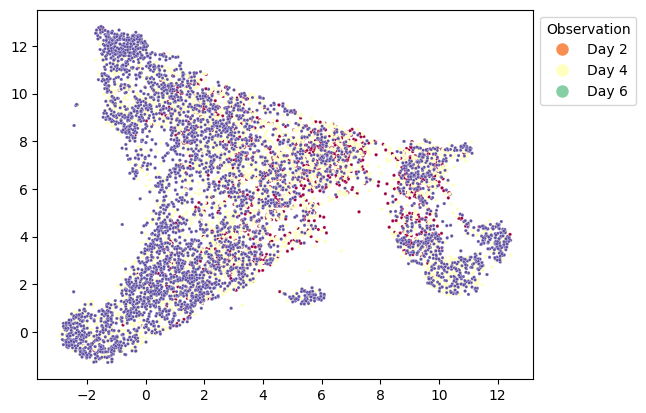

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

c_map = "Spectral" #"RdYlBu"
y = check_adata.obs['Day']
embedding_x = check_adata.obsm['umap'][:, 0]
embedding_y = check_adata.obsm['umap'][:, 1]
obs_df = pd.DataFrame(check_adata.obs)
filtered_indices = np.where(obs_df['Day'] == obs_df['initial'])[0]
filtered_embedding_x = embedding_x[filtered_indices]
filtered_embedding_y = embedding_y[filtered_indices]
filtered_y = y[filtered_indices]
cmap = plt.cm.get_cmap(c_map, len(filtered_y))
ax = sns.scatterplot(x=filtered_embedding_x, y=filtered_embedding_y, hue=filtered_y, palette=cmap, s=5)
unique_values = sorted(filtered_y.unique())
color_palette = sns.color_palette(c_map, len(unique_values))
ax.legend_.remove()


handles = [
    plt.Line2D(
        [0],
        [0],
        marker='o',
        color='w',
        markerfacecolor=color_palette[i],
        markersize=10,
        label=f'Day {unique_values[i]:.0f}'
    )
    for i in range(len(unique_values))
]

plt.legend(handles=handles, title='Observation', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


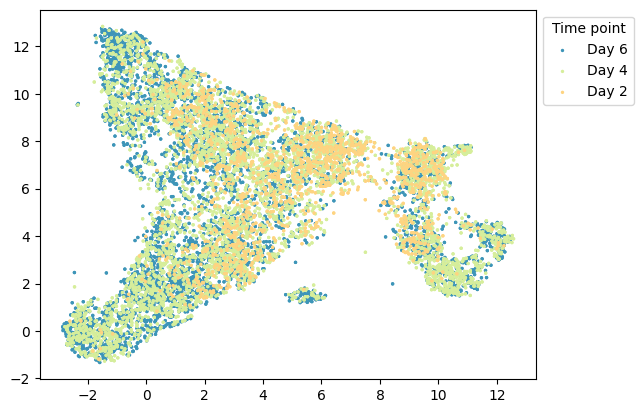

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

dot_size = 2
y = check_adata.obs['Day']
embedding_x = check_adata.obsm['umap'][:, 0]
embedding_y = check_adata.obsm['umap'][:, 1]
obs_df = pd.DataFrame(check_adata.obs)
color_mapping = {2: '#fed481', 4: '#d6ee9b', 6: '#3d95b8'}
color_mapping_face = ['#fed481', '#d6ee9b', '#3d95b8']

point_colors = [color_mapping[val] for val in y]

filtered_indices_6 = np.where(obs_df['Day'] == 6)[0]
filtered_embedding_x_6 = embedding_x[filtered_indices_6]
filtered_embedding_y_6 = embedding_y[filtered_indices_6]
filtered_y_6 = y[filtered_indices_6]

filtered_indices_4 = np.where(obs_df['Day'] == 4)[0]
filtered_embedding_x_4 = embedding_x[filtered_indices_4]
filtered_embedding_y_4 = embedding_y[filtered_indices_4]
filtered_y_4 = y[filtered_indices_4]

filtered_indices_2 = np.where(obs_df['Day'] == 2)[0]
filtered_embedding_x_2 = embedding_x[filtered_indices_2]
filtered_embedding_y_2 = embedding_y[filtered_indices_2]
filtered_y_2 = y[filtered_indices_2]

plt.scatter(filtered_embedding_x_6, filtered_embedding_y_6, c=[color_mapping[val] for val in filtered_y_6], s=dot_size, label='Day 6')
plt.scatter(filtered_embedding_x_4, filtered_embedding_y_4, c=[color_mapping[val] for val in filtered_y_4], s=dot_size, label='Day 4') #, alpha=0.5
plt.scatter(filtered_embedding_x_2, filtered_embedding_y_2, c=[color_mapping[val] for val in filtered_y_2], s=dot_size, label='Day 2') #, alpha=0.5

plt.grid(False)
plt.gca().set_facecolor('white')

legend = plt.legend(title='Time point', loc='upper left', bbox_to_anchor=(1, 1))
legend.set_frame_on(True)
legend.get_frame().set_facecolor('white')

plt.show()

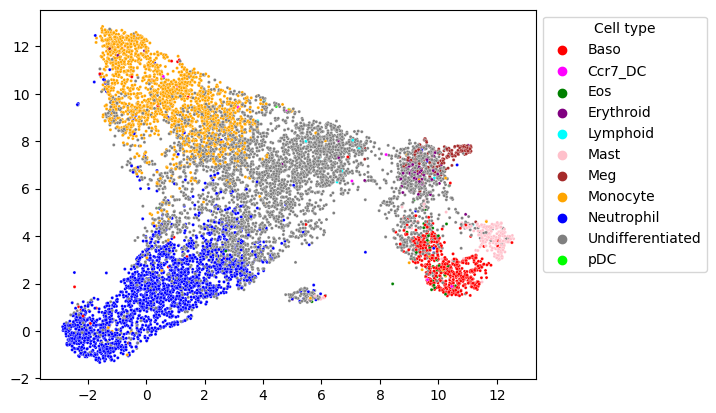

In [ ]:
import seaborn

y = check_adata.obs['Celltype']
embedding_x = check_adata.obsm['umap'][:, 0]
embedding_y = check_adata.obsm['umap'][:, 1]

custom_palette = {
    'Baso': 'red',
    'Ccr7_DC': 'magenta',
    'Eos': 'green',
    'Erythroid': 'purple',
    'Lymphoid': 'cyan',
    'Mast': 'pink',
    'Meg': 'brown',
    'Monocyte': 'orange',
    'Neutrophil': 'blue',
    'Undifferentiated': 'gray',
    'pDC': 'lime'
}


ax = seaborn.scatterplot(x=embedding_x, y=embedding_y, hue=y, palette=custom_palette, s=5)
plt.grid(False)
plt.gca().set_facecolor('white')

legend = plt.legend(title='Cell type', loc='upper left', bbox_to_anchor=(1, 1))
legend.set_frame_on(True)
legend.get_frame().set_facecolor('white')

plt.show()

In [ ]:
select_check_adata.write(dt_now + '_select_check_adata.h5ad')
files.download(dt_now + '_select_check_adata.h5ad')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
select_check_adata, trans = latent_visualization(select_adata, LineageVAE_exp, adata.var_names, trans=trans)
select_check_adata.write(dt_now + '_select_check_adata.h5ad')
files.download(dt_now + '_select_check_adata.h5ad')

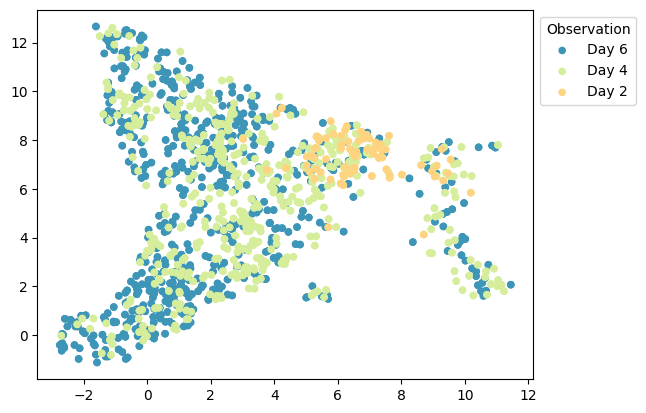

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

c_map = "Spectral"
y = select_check_adata.obs['Day']
embedding_x = select_check_adata.obsm['umap'][:, 0]
embedding_y = select_check_adata.obsm['umap'][:, 1]
obs_df = pd.DataFrame(select_check_adata.obs)

color_mapping = {2: '#fed481', 4: '#d6ee9b', 6: '#3d95b8'}
color_mapping_face = ['#fed481', '#d6ee9b', '#3d95b8']

point_colors = [color_mapping[val] for val in y]

filtered_indices_6 = np.where(obs_df['Day'] == 6)[0]
filtered_embedding_x_6 = embedding_x[filtered_indices_6]
filtered_embedding_y_6 = embedding_y[filtered_indices_6]
filtered_y_6 = y[filtered_indices_6]

filtered_indices_4 = np.where(obs_df['Day'] == 4)[0]
filtered_embedding_x_4 = embedding_x[filtered_indices_4]
filtered_embedding_y_4 = embedding_y[filtered_indices_4]
filtered_y_4 = y[filtered_indices_4]

filtered_indices_2 = np.where(obs_df['Day'] == 2)[0]
filtered_embedding_x_2 = embedding_x[filtered_indices_2]
filtered_embedding_y_2 = embedding_y[filtered_indices_2]
filtered_y_2 = y[filtered_indices_2]

plt.scatter(filtered_embedding_x_6, filtered_embedding_y_6, c=[color_mapping[val] for val in filtered_y_6], s=20, label='Day 6')


plt.scatter(filtered_embedding_x_4, filtered_embedding_y_4, c=[color_mapping[val] for val in filtered_y_4], s=20, label='Day 4') #, alpha=0.5
plt.scatter(filtered_embedding_x_2, filtered_embedding_y_2, c=[color_mapping[val] for val in filtered_y_2], s=20, label='Day 2') #, alpha=0.5

plt.legend(title='Observation', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


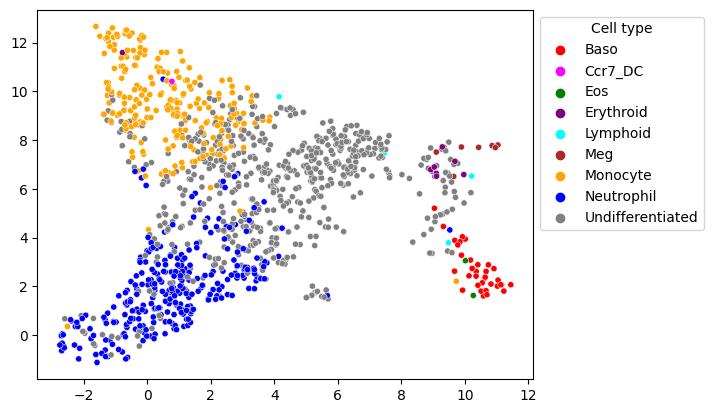

In [ ]:
import seaborn

y = select_check_adata.obs['Celltype']
embedding_x = select_check_adata.obsm['umap'][:, 0]
embedding_y = select_check_adata.obsm['umap'][:, 1]

custom_palette = {
    'Baso': 'red',
    'Ccr7_DC': 'magenta',
    'Eos': 'green',
    'Erythroid': 'purple',
    'Lymphoid': 'cyan',
    'Mast': 'pink',
    'Meg': 'brown',
    'Monocyte': 'orange',
    'Neutrophil': 'blue',
    'Undifferentiated': 'gray',
    'pDC': 'lime'
}

ax = seaborn.scatterplot(x=embedding_x, y=embedding_y, hue=y, palette=custom_palette, s=20, legend="full")
plt.grid(False)
plt.gca().set_facecolor('white')

legend = plt.legend(title='Cell type', loc='upper left', bbox_to_anchor=(1, 1))
legend.set_frame_on(True)
legend.get_frame().set_facecolor('white')

plt.show()

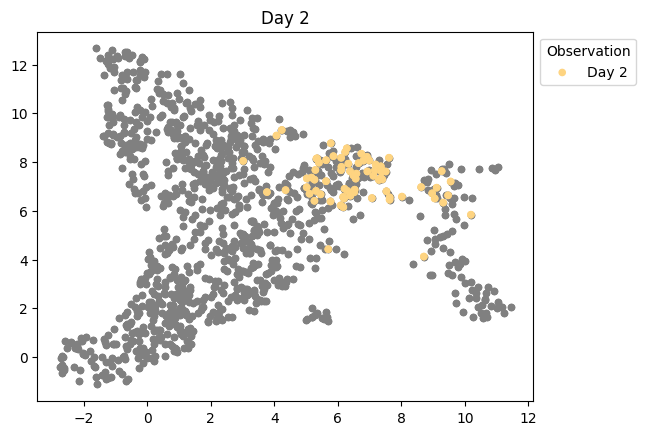

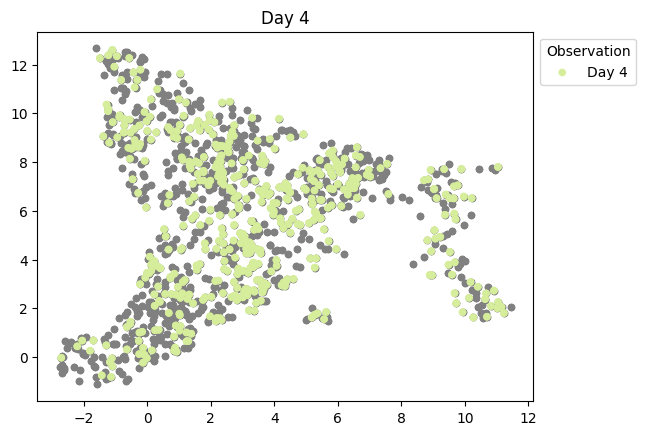

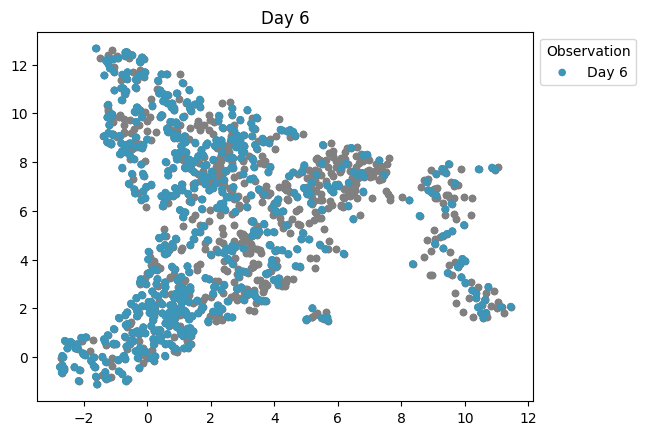

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

c_map = "Spectral"
y = select_check_adata.obs['Day']
embedding_x = select_check_adata.obsm['umap'][:, 0]
embedding_y = select_check_adata.obsm['umap'][:, 1]

obs_df = pd.DataFrame(select_check_adata.obs)

color_mapping = {2: '#fed481', 4: '#d6ee9b', 6: '#3d95b8'}
color_mapping_face = ['#fed481', '#d6ee9b', '#3d95b8']

days_to_plot = [2, 4, 6]

for day in days_to_plot:

    filtered_indices = np.where(obs_df['Day'] == day)[0]
    filtered_embedding_x = embedding_x[filtered_indices]
    filtered_embedding_y = embedding_y[filtered_indices]
    filtered_y = y[filtered_indices]

    plt.scatter(embedding_x, embedding_y, color='grey', s=20)
    plt.scatter(filtered_embedding_x, filtered_embedding_y, c=[color_mapping[val] for val in filtered_y], s=20, label=f'Day {day}')

    plt.legend(title='Observation', loc='upper left', bbox_to_anchor=(1, 1))

    plt.gca().set_facecolor('white')

    plt.title(f"Day {day}")
    plt.grid(False)
    plt.show()


## Infer latent variables using learned parameters and sample the occurrence at each time

Each time you run latent_visualization(adata_6, LineageVAE_exp, adata.var_names, dynamics=True, trans=trans), a new normal distribution of latent variables is inferred using the learned parameters. From there, the Poisson distribution is decoded based on the sampled latent variables, and the expression at each time point is sampled from the distribution.

In [ ]:
def latent_transition_inferens(adata_6, LineageVAE_exp, LineageVAE_used, sigma=0.05, n_neighbors=30, min_dist=0.1, dz_var_prop=0.05, sample_num=10, dynamics=False, trans=None):

    inf_adata, trans = latent_visualization(adata_6, LineageVAE_exp, adata.var_names, dynamics=True, trans=trans) #input

    a = len(inf_adata[inf_adata.obs['Day'] == -1])
    b = int(len(inf_adata.obs) / a)
    inf_adata.obs['CellID'] = None
    for i in range(b):
        start_idx = i * a
        end_idx = (i + 1) * a
        inf_adata.obs['CellID'][start_idx:end_idx] = inf_adata[inf_adata.obs['Day'] == -1].obs.index

    return inf_adata, trans

In [ ]:
import anndata
from google.colab import files
import datetime

#total
#adata_6 = sc.read("20230413_total_adata.h5ad", cache=True) # if you want to use all cells
adata_6 = select_adata # when you use only select data
adata_6 = adata_6[adata_6.obs['Day']==6]
adata_6 = adata_6[:,var_list]

dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
#inf_adata, trans = latent_visualization(select_adata[select_adata.obs['Day']==28], LineageVAE_exp, adata.var_names, dynamics=True, trans=trans) #input
inf_adata, trans = latent_transition_inferens(adata_6, LineageVAE_exp, adata.var_names, dynamics=True, trans=trans) #input


inf_adata.write(dt_now + '_inf_adata.h5ad')
files.download(dt_now + '_inf_adata.h5ad')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
from scipy.sparse import csc_matrix

def sparse_matrix_to_csv(sparse_matrix, filename):
    # Convert the sparse matrix to a dense array
    dense_array = csc_matrix(sparse_matrix).toarray()

    # Create a DataFrame from the dense array
    df = pd.DataFrame(dense_array)

    # Save the DataFrame to a CSV file
    df.to_csv(filename, index=False)

    return df


dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
input_sparse_matrix = inf_adata.X
csv_filename = dt_now + '_dense_matrix.csv'
dense_df = sparse_matrix_to_csv(input_sparse_matrix, csv_filename)
dense_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,2.0,0.0,6.0,0.0,0.0,2.0,0.0,2.0,0.0,1.0,...,2.0,0.0,1.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0
1,2.0,1.0,4.0,1.0,0.0,3.0,2.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
2,0.0,0.0,3.0,0.0,0.0,1.0,3.0,0.0,1.0,0.0,...,1.0,0.0,1.0,0.0,2.0,2.0,2.0,1.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5611,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
5612,1.0,0.0,2.0,0.0,0.0,3.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0
5613,1.0,0.0,3.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0
5614,0.0,1.0,7.0,0.0,0.0,1.0,1.0,0.0,3.0,2.0,...,2.0,1.0,1.0,0.0,2.0,2.0,0.0,1.0,0.0,0.0


In [ ]:
import pandas as pd

duplicates = dense_df.duplicated(keep=False)
duplicates_with_same_sequence = dense_df[duplicates]

if not duplicates_with_same_sequence.empty:
    print("Rows with the same number sequence:")
    print(duplicates_with_same_sequence)
else:
    print("No rows with the same number sequence found.")


No rows with the same number sequence found.


In [ ]:
columns_with_same_order = []

for col1 in dense_df.columns:
    for col2 in dense_df.columns:
        if col1 != col2:
            if (dense_df[col1] == dense_df[col2]).all():
                columns_with_same_order.append((col1, col2))

if columns_with_same_order:
    print("Columns with the same vertical number order:")
    for cols in columns_with_same_order:
        print(f"{cols[0]} and {cols[1]}")
else:
    print("No columns with the same vertical number order.")

No columns with the same vertical number order.


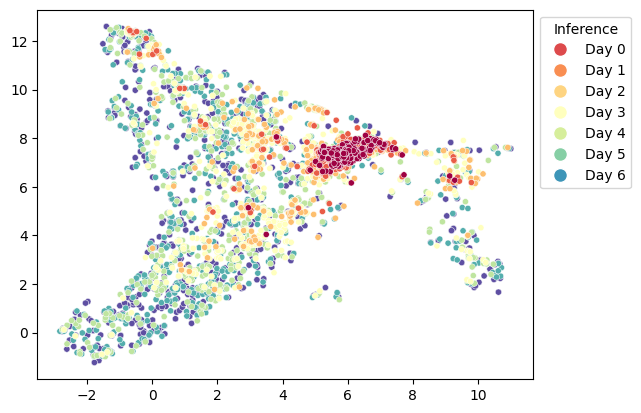

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

c_map = "Spectral" #"RdYlBu"
filtered_indices = inf_adata.obs['Day'] > -1
filtered_embedding_x = inf_adata.obsm['umap'][filtered_indices, 0]
filtered_embedding_y = inf_adata.obsm['umap'][filtered_indices, 1]
filtered_y = inf_adata.obs['Day'][filtered_indices]

ax = sns.scatterplot(x=filtered_embedding_x, y=filtered_embedding_y, hue=filtered_y, palette=c_map, s=20)
ax.legend_.remove()

unique_values = sorted(filtered_y.unique())
color_palette = sns.color_palette(c_map, len(unique_values))
color_list = [sns.color_palette(c_map, len(unique_values)).as_hex()[i] for i in range(len(unique_values))] #for embed check

handles = [
    plt.Line2D(
        [0],
        [0],
        marker='o',
        color='w',
        markerfacecolor=color_palette[i],
        markersize=10,
        label=f'Day {unique_values[i]:.0f}'
    )
    for i in range(len(unique_values))
]

plt.legend(handles=handles, title='Inference', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


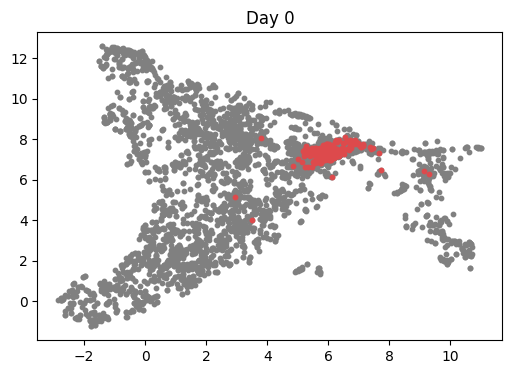

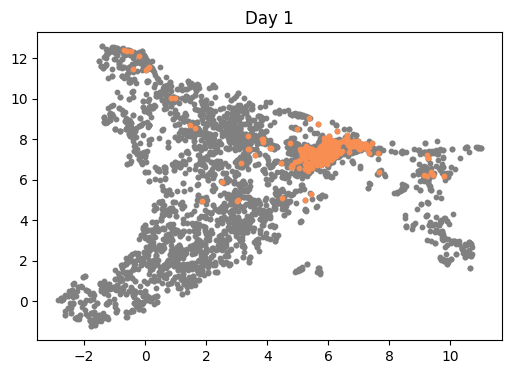

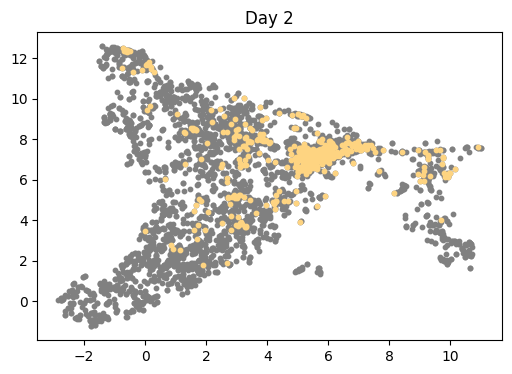

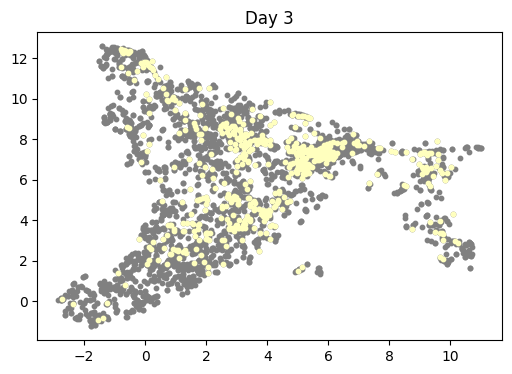

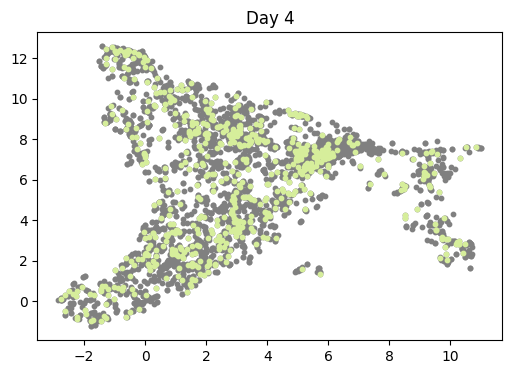

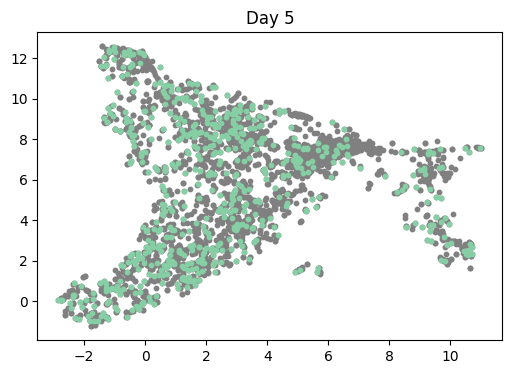

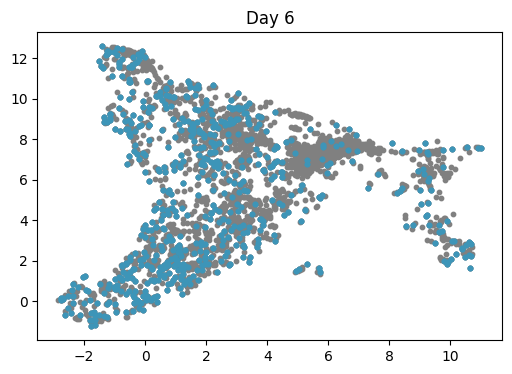

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

unique_days = np.unique(inf_adata.obs['Day'])
unique_days = unique_days[unique_days != -1]

c_map = "Spectral"
color_palette = sns.color_palette(c_map, len(unique_days))

for i in unique_days:
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.set_facecolor('white')
    umap_coords = inf_adata.obsm['umap']
    ax.scatter(umap_coords[:, 0], umap_coords[:, 1], color='grey', s=10)

    adata_subset = inf_adata[inf_adata.obs['Day'] == i]
    umap_coords_subset = adata_subset.obsm['umap']

    ax.scatter(umap_coords_subset[:, 0], umap_coords_subset[:, 1], s=10, cmap='viridis', color=color_palette[i])
    ax.set_title(f"Day {i}")
    ax.grid(False)
    plt.show()


In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

max_day = max(inf_adata.obs['Day'])
z_ranges = []

for i in range(max_day + 1):
    subset_data = inf_adata[inf_adata.obs['Day'] == i].obsm['z']
    mean = np.mean(subset_data, axis=0)  # Calculate the mean for each of the 10 dimensions
    variance = np.var(subset_data, axis=0)  # Calculate the variance for each of the 10 dimensions
    z_ranges.append((mean, variance))

confidence_intervals = []

for i in range(max_day + 1):
    mean, variance = z_ranges[i]
    n = len(inf_adata[inf_adata.obs['Day'] == i])
    alpha = 0.05  # 95% confidence level

    # Calculate the standard error of the mean
    sem = np.sqrt(variance / n)

    # Calculate the margin of error
    margin_error = stats.t.ppf(1 - alpha / 2, n - 1) * sem

    # Calculate the confidence interval
    lower_bound = mean - margin_error
    upper_bound = mean + margin_error

    confidence_intervals.append((lower_bound, upper_bound))


In [ ]:
import csv

# Define the file path where you want to save the CSV file
dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
csv_file_path = dt_now + "_z_ranges_data.csv"

# Open the CSV file for writing
with open(csv_file_path, mode='w', newline='') as csv_file:
    writer = csv.writer(csv_file)

    # Write the header row with column names
    writer.writerow(["Dimension", "Means", "Variances"])

    # Iterate through the z_ranges and write the data for each dimension
    for i, (means, variances) in enumerate(z_ranges):
        writer.writerow([i, means.tolist(), variances.tolist()])

print(f"Data saved as {csv_file_path}")


Data saved as 202401130707_z_ranges_data.csv


# Evaluate accuracy by distance

## Euclidean distance

In [ ]:
import numpy as np

# Assuming select_check_adata is your AnnData object

# Filter the data based on 'reconst' column
filtered_data = select_check_adata[select_check_adata.obs['reconst'] == 0]

# Get unique cell types
unique_cell_types = np.unique(filtered_data.obs['Celltype'])

# Initialize lists to store results
centroids = []
std_devs = []

# Loop through unique cell types
for cell_type in unique_cell_types:
    # Filter data for the current cell type
    cell_type_data = filtered_data[filtered_data.obs['Celltype'] == cell_type]

    # Calculate centroid and standard deviation
    centroid = np.mean(cell_type_data.obsm['z'], axis=0)
    std_dev = np.std(cell_type_data.obsm['z'], axis=0)

    # Append results to lists
    centroids.append(centroid)
    std_devs.append(std_dev)

# Convert lists to NumPy arrays for further analysis or storage
centroids = np.array(centroids)
std_devs = np.array(std_devs)


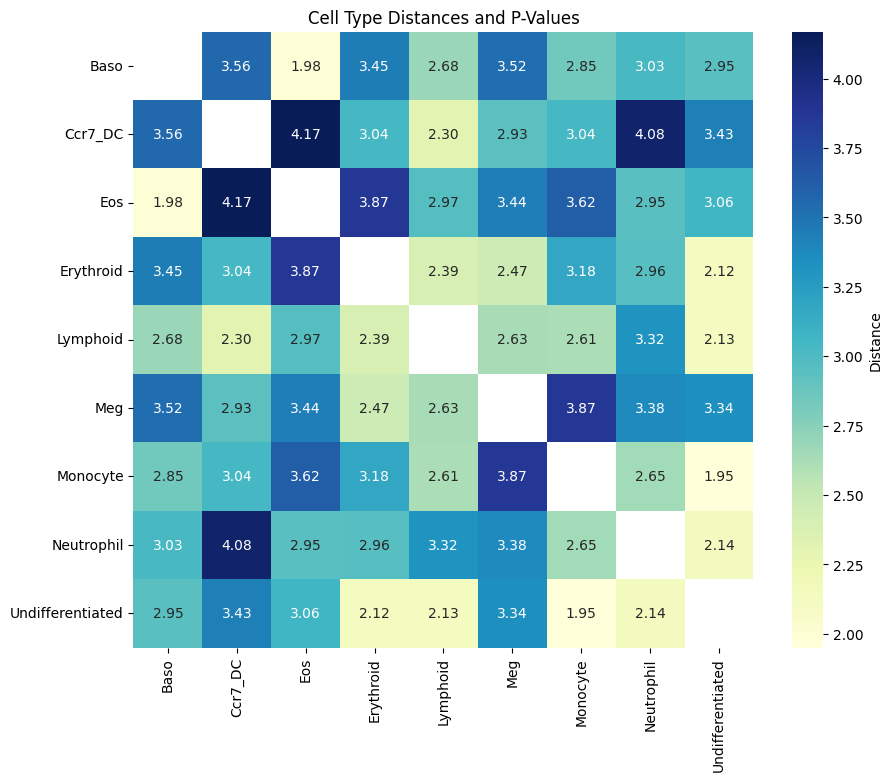

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
from scipy.spatial.distance import euclidean
from itertools import combinations

# Assuming you have already calculated unique_cell_types, filtered_data, and obm['z']

# Initialize a DataFrame to store distances and p-values
table_df = pd.DataFrame(index=unique_cell_types, columns=unique_cell_types)
distance_df = pd.DataFrame(index=unique_cell_types, columns=unique_cell_types)
p_value_df = pd.DataFrame(index=unique_cell_types, columns=unique_cell_types)

# Loop through all unique pairs of cell types
for pair in combinations(unique_cell_types, 2):
    group1 = pair[0]
    group2 = pair[1]

    # Filter data for each group
    group1_data = filtered_data[filtered_data.obs['Celltype'] == group1].obsm['z']
    group2_data = filtered_data[filtered_data.obs['Celltype'] == group2].obsm['z']

    # Calculate Euclidean distance between centroids
    distance = euclidean(np.mean(group1_data, axis=0), np.mean(group2_data, axis=0))

    # Perform statistical test (Mann-Whitney U test for non-normally distributed data)
    _, p_value = mannwhitneyu(group1_data.flatten(), group2_data.flatten())

    # Store values in the DataFrame
    table_df.loc[group1, group2] = f'{distance:.2f}\u0020(p={p_value:.3f})'
    table_df.loc[group2, group1] = f'{distance:.2f}\u0020(p={p_value:.3f})'

    distance_df.loc[group1, group2] = f'{distance:.2f}'
    distance_df.loc[group2, group1] = f'{distance:.2f}'
    p_value_df.loc[group1, group2] = f'{p_value:.3f}'
    p_value_df.loc[group2, group1] = f'{p_value:.3f}'

# Set diagonal elements to NaN or customize as needed
np.fill_diagonal(table_df.values, np.nan)

# Convert values to float by extracting numerical values
table_df_ = table_df.applymap(lambda x: float(x.split('\u0020')[0]) if pd.notnull(x) else np.nan)

# Create a heatmap using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(table_df_, annot=True, cmap="YlGnBu", fmt=".2f", cbar_kws={'label': 'Distance'})
plt.title('Cell Type Distances and P-Values')
plt.show()


In [ ]:
table_df
table_df.to_csv('table_df.csv')

## silhouette score

In [ ]:
import numpy as np
from sklearn.metrics import silhouette_score
import pandas as pd

inf_adata_0 = inf_adata[inf_adata.obs['Day'] > -1]

subset_1_data = select_check_adata[select_check_adata.obs['reconst'] == 0].obsm['z']
subset_1_labels = select_check_adata[select_check_adata.obs['reconst'] == 0].obs['Day']

subset_2_data = inf_adata_0[inf_adata_0.obs['reconst'] == 1].obsm['z']
subset_2_labels = inf_adata_0[inf_adata_0.obs['reconst'] == 1].obs['Day']

unique_labels_1 = np.unique(subset_1_labels)
unique_labels_2 = np.unique(subset_2_labels)
unique_labels_2 = unique_labels_2[~np.isin(unique_labels_2, 6)]

silhouette_df = pd.DataFrame(columns=unique_labels_2)

for j in unique_labels_2:
    subset_1_data_selected = subset_1_data
    subset_2_data_selected = subset_2_data[subset_2_labels == j]

    combined_data = np.concatenate([subset_1_data_selected, subset_2_data_selected])
    combined_labels = np.concatenate([np.zeros(len(subset_1_data_selected)), np.ones(len(subset_2_data_selected))])

    score = silhouette_score(combined_data, combined_labels)
    silhouette_df.loc[0, j] = score

silhouette_df

,0,1,2,3,4,5
0,0.146805,0.118686,0.067573,0.018113,-0.013538,-0.019004


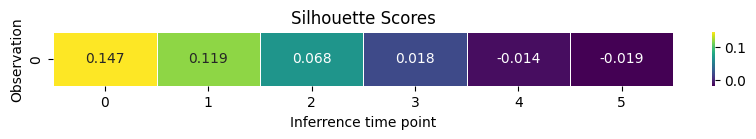

In [ ]:
silhouette_df.fillna(0, inplace=True)
silhouette_df = silhouette_df.apply(pd.to_numeric, errors='coerce')

plt.figure(figsize=(10, 0.7))
sns.heatmap(silhouette_df, annot=True, cmap="viridis", fmt=".3f", linewidths=.5)

plt.xlabel('Inferrence time point')
plt.ylabel('Observation')
plt.title('Silhouette Scores')

plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import silhouette_score
import pandas as pd

inf_adata_0 = inf_adata[inf_adata.obs['Day'] > -1]

subset_1_data = select_check_adata[select_check_adata.obs['reconst'] == 0].obsm['z']
subset_1_labels = select_check_adata[select_check_adata.obs['reconst'] == 0].obs['Day']

subset_2_data = inf_adata_0[inf_adata_0.obs['reconst'] == 1].obsm['z']
subset_2_labels = inf_adata_0[inf_adata_0.obs['reconst'] == 1].obs['Day']

unique_labels_1 = np.unique(subset_1_labels)
unique_labels_2 = np.unique(subset_2_labels)
unique_labels_2 = unique_labels_2[~np.isin(unique_labels_2, 6)]

silhouette_df = pd.DataFrame(index=unique_labels_1, columns=unique_labels_2)

for i in unique_labels_1:
    for j in unique_labels_2:
        subset_1_data_selected = subset_1_data[subset_1_labels == i]
        subset_2_data_selected = subset_2_data[subset_2_labels == j]

        combined_data = np.concatenate([subset_1_data_selected, subset_2_data_selected])
        combined_labels = np.concatenate([np.zeros(len(subset_1_data_selected)), np.ones(len(subset_2_data_selected))])

        score = silhouette_score(combined_data, combined_labels)

        silhouette_df.loc[i, j] = score

silhouette_df

,0,1,2,3,4,5
2,0.674583,0.60306,0.466568,0.324305,0.20838,0.124813
4,0.376306,0.333712,0.250697,0.159435,0.082745,0.032807
6,0.330926,0.291489,0.215044,0.130223,0.058803,0.013789


## Computation of K-Neighbors for Inference Cells in Observation space

In [ ]:
import numpy as np
from scipy.spatial import cKDTree
import pandas as pd

observed_coordinates = select_check_adata[select_check_adata.obs['reconst'] == 0].obsm['z']
observed_labels = select_check_adata[select_check_adata.obs['reconst'] == 0].obs['Day']
inferenced_coordinates = inf_adata_0[inf_adata_0.obs['reconst'] == 1].obsm['z']
inferenced_labels = inf_adata_0[inf_adata_0.obs['reconst'] == 1].obs['Day']

observed_coordinates = np.array(observed_coordinates)
inferenced_coordinates = np.array(inferenced_coordinates)

k_neighbors = 30

observed_tree = cKDTree(observed_coordinates)

results_dict = {'Inferenced_Label': [], 'Nearest_Labels': [], 'Label_Counts': []}

for i in range(len(inferenced_coordinates)):
    inferenced_cell = inferenced_coordinates[i]
    distances, indices = observed_tree.query(inferenced_cell, k=k_neighbors)
    nearest_labels = observed_labels.iloc[indices]
    label_counts = nearest_labels.value_counts()

    results_dict['Inferenced_Label'].append(inferenced_labels.iloc[i])
    results_dict['Nearest_Labels'].append(nearest_labels.tolist())
    results_dict['Label_Counts'].append(label_counts.to_dict())

results_df = pd.DataFrame(results_dict)

def sum_dicts(list_of_dicts):
    result_dict = {}
    for d in list_of_dicts:
        for key, value in d.items():
            result_dict[key] = result_dict.get(key, 0) + value
    return result_dict

aggregated_df = results_df.groupby('Inferenced_Label')['Label_Counts'].agg(sum_dicts).reset_index()

matrix_df = pd.DataFrame(index=np.unique(observed_labels).tolist(), columns=aggregated_df['Inferenced_Label'])

for i, row in aggregated_df.iterrows():
    inferenced_label = row['Inferenced_Label']
    label_counts = row['Label_Counts']
    for nearest_label in matrix_df.index:
        matrix_df.at[nearest_label, inferenced_label] = label_counts.get(nearest_label, 0)


matrix_df = matrix_df.fillna(0)
print(matrix_df)
normalized_matrix_df = matrix_df.div(matrix_df.sum(axis=0), axis=1)
print(normalized_matrix_df)

Inferenced_Label     0     1     2     3      4      5      6
2                 5805  5082  3856  2190   1193    761    574
4                 9033  9141  8653  7898   6985   6529   6403
6                 3762  4377  6091  8512  10422  11310  11623
Inferenced_Label         0         1         2         3         4         5  \
2                 0.312097  0.273226  0.207312  0.117742  0.064140  0.040914   
4                 0.485645  0.491452  0.465215  0.424624  0.375538  0.351022   
6                 0.202258  0.235323  0.327473  0.457634  0.560323  0.608065   

Inferenced_Label         6  
2                 0.030860  
4                 0.344247  
6                 0.624892  


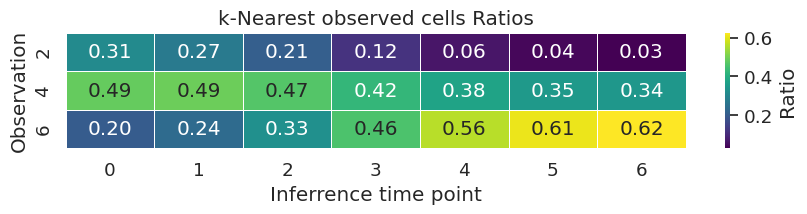

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(font_scale=1.2)

plt.figure(figsize=(10, 1.5))
sns.heatmap(normalized_matrix_df, annot=True, fmt=".2f", cmap="viridis", linewidths=.5, cbar_kws={'label': 'Ratio'})

plt.xlabel('Inferrence time point')
plt.ylabel('Observation')
plt.title('k-Nearest observed cells Ratios')

plt.show()


# Reconstruction of historical expression

## Confirm inference results based on marker gene expression

In [ ]:
inf_adata, trans = latent_transition_inferens(adata_6, LineageVAE_exp, adata.var_names, dynamics=True, trans=trans) #input

In [ ]:
import anndata as ad

def main_differentiation_destination(adata, dif_ratio, timepoint=None):
    lineage_list = adata.obs['Lineage'].unique()
    for lineage in lineage_list:
        main_differentiation_destination = 'Undifferentiated'
        a_subset = adata[(adata.obs['Lineage'] == lineage)]
        a_day6 = a_subset[a_subset.obs['Day'] == 6]

        # Count the number of cells that are not 'Undifferentiated' at Day 6
        a_day6_not_undiff = a_day6[a_day6.obs['Celltype'] != 'Undifferentiated']
        a = a_day6_not_undiff.shape[0]

        if a != 0:
            celltype_list = adata.obs['Celltype'].unique()
            celltype_list = [x for x in celltype_list if x != 'Undifferentiated']
            for celltype in celltype_list:
                b = a_day6[a_day6.obs['Celltype'] == celltype].shape[0]
                if b/a > dif_ratio:
                    main_differentiation_destination = celltype

            if timepoint is not None:
                adata.obs.loc[(adata.obs['Lineage'] == lineage) & (adata.obs['inference'] == timepoint), 'main_differentiation_destination'] = main_differentiation_destination
            else:
                adata.obs.loc[adata.obs['Lineage'] == lineage, 'main_differentiation_destination'] = main_differentiation_destination

    return adata

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import scanpy as sc
import pandas as pd
#markers = ['Aff3', 'Rnf149', 'Slc40a1']
PanglaoDB = pd.read_csv('PanglaoDB.csv')
PanglaoDB = PanglaoDB.dropna(how='all').dropna(how='all', axis=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


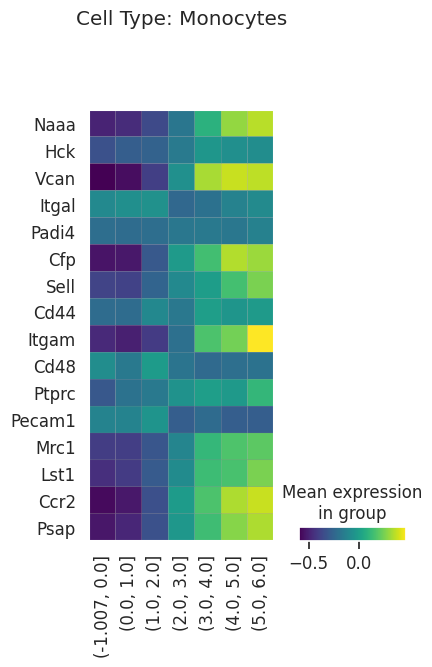

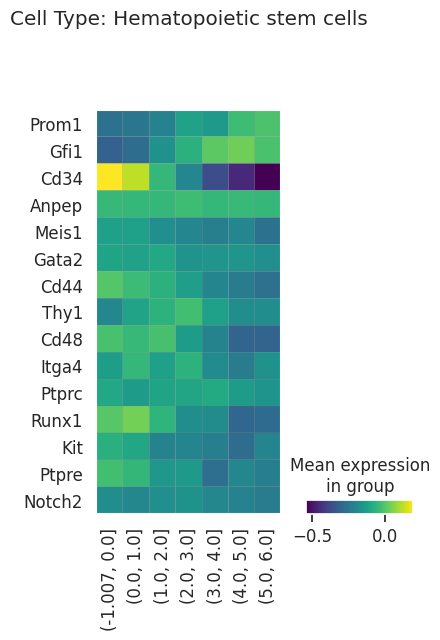

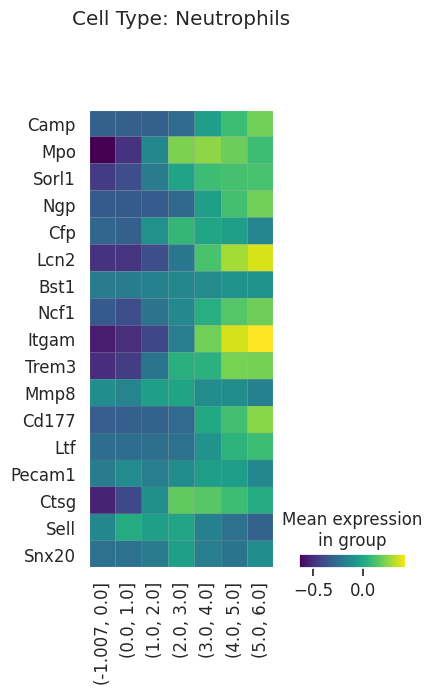

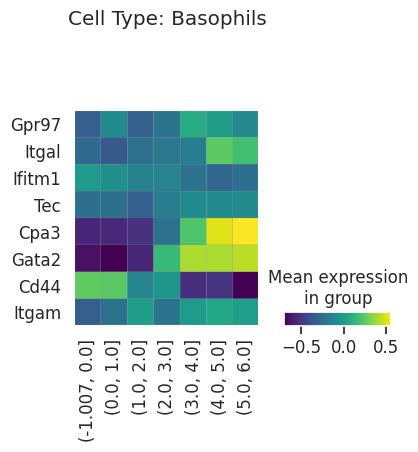

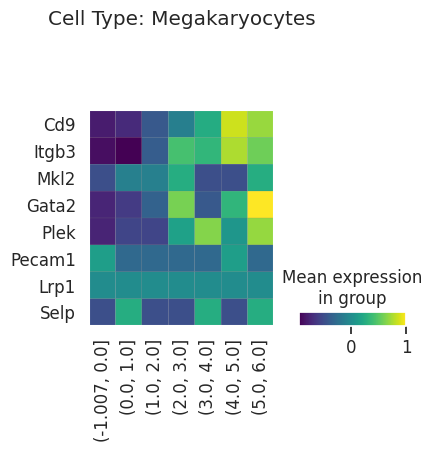

...

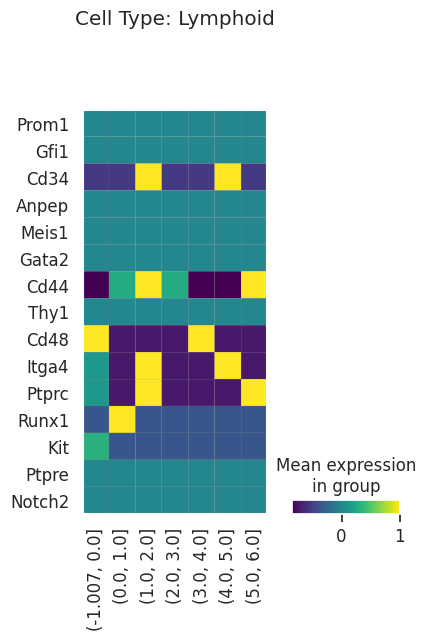

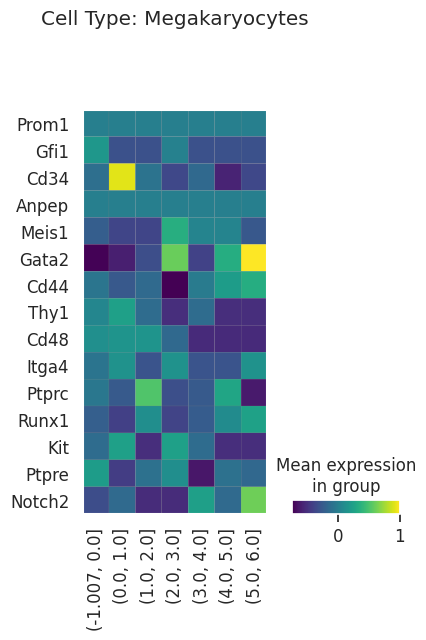

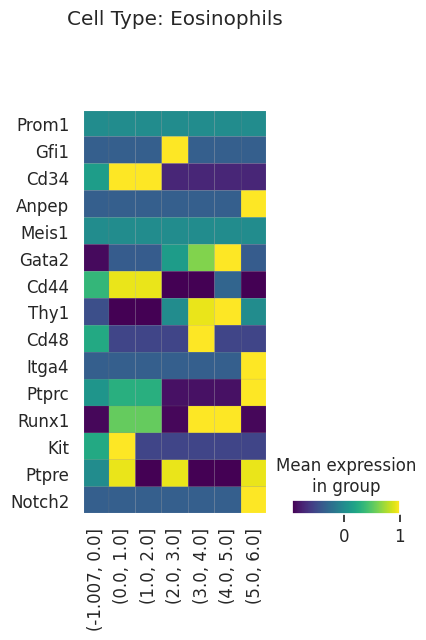

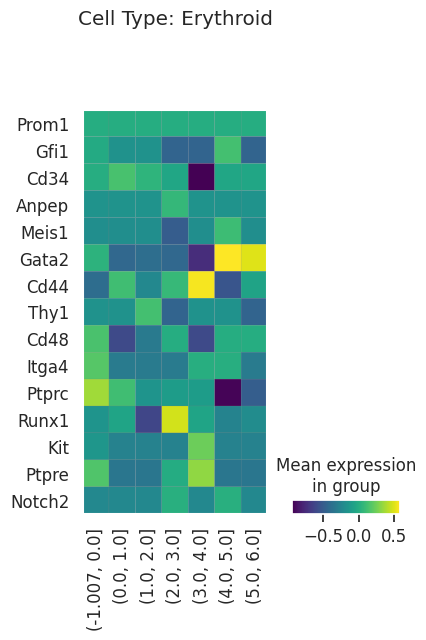

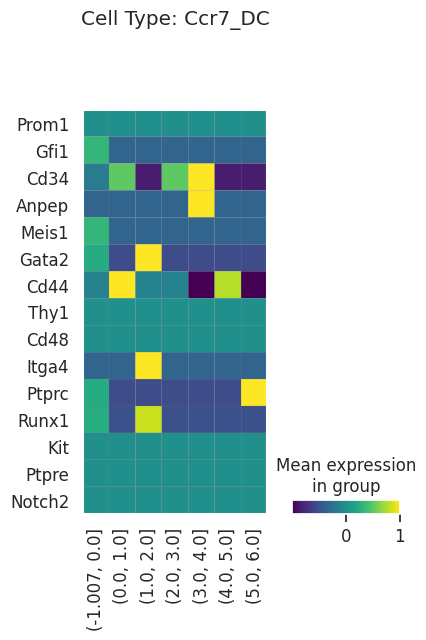

In [ ]:
import scanpy as sc
import pandas as pd

cell_type_mapping = {
    'Baso': 'Basophils',
    'Eos': 'Eosinophils',
    'Mast': 'Mast cells',
    'Meg': 'Megakaryocytes',
    'Monocyte': 'Monocytes',
    'Neutrophil': 'Neutrophils',
    'Undifferentiated': 'Hematopoietic stem cells'
}

cell_types = inf_adata.obs['differentiation_destination'].unique()

all_plots = []

for cell_type in cell_types:
    full_cell_type_name = cell_type_mapping.get(cell_type, cell_type)

    cell_type_markers = PanglaoDB['gene_names'][(PanglaoDB['cell type'] == full_cell_type_name)].tolist()
    cell_type_markers = list(set(inf_adata.var_names).intersection(set(cell_type_markers)))

    if not cell_type_markers:
        continue

    inf_adata_subset = inf_adata[inf_adata.obs['differentiation_destination'] == cell_type][:, cell_type_markers]
    inf_adata_subset = inf_adata_subset[inf_adata_subset.obs['reconst']==1] #reconst
    sc.pp.scale(inf_adata_subset, zero_center=True, max_value=1)
    plot = sc.pl.matrixplot(inf_adata_subset, cell_type_markers, groupby='Day', show=False, cmap='viridis', swap_axes=True, title='Cell Type: {}'.format(full_cell_type_name))

    all_plots.append(plot)

for cell_type in cell_types:

    full_cell_type_name = cell_type_mapping.get(cell_type, cell_type)

    undifferentiated_markers = PanglaoDB['gene_names'][(PanglaoDB['cell type'] == 'Hematopoietic stem cells')].tolist()
    undifferentiated_markers = list(set(inf_adata.var_names).intersection(set(undifferentiated_markers)))

    if not undifferentiated_markers:
        continue

    inf_adata_subset = inf_adata[inf_adata.obs['differentiation_destination'] == cell_type][:, undifferentiated_markers]
    inf_adata_subset = inf_adata_subset[inf_adata_subset.obs['reconst']==1] #reconst
    sc.pp.scale(inf_adata_subset, zero_center=True, max_value=1)

    plot = sc.pl.matrixplot(inf_adata_subset, undifferentiated_markers, groupby='Day', show=False, cmap='viridis', swap_axes=True, title='Cell Type: {}'.format(full_cell_type_name))

    all_plots.append(plot)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


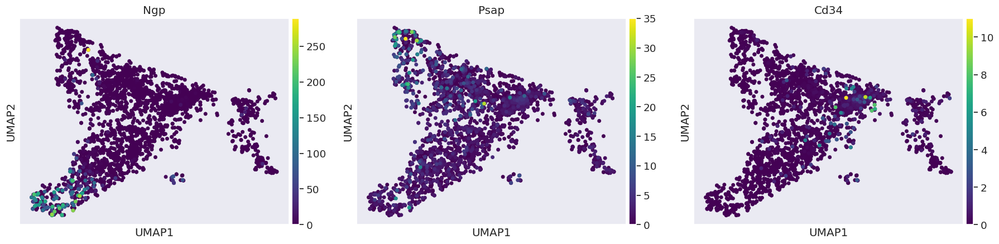

In [ ]:
import scanpy as sc
sc.pl.umap(inf_adata, color=['Ngp', 'Psap', 'Cd34'], size=100, cmap='viridis')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


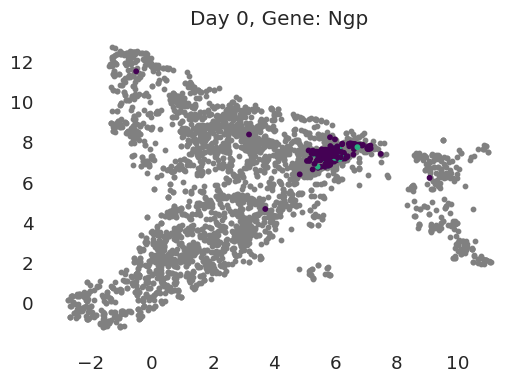

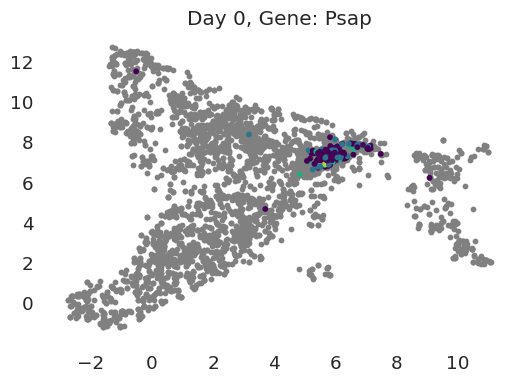

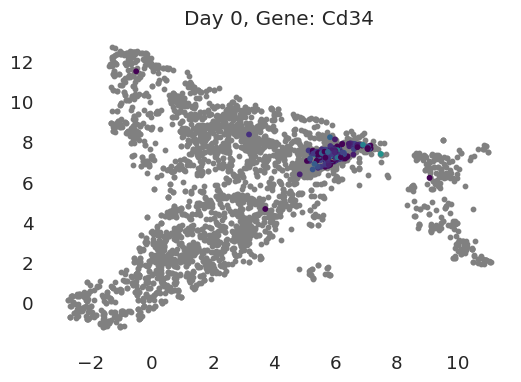

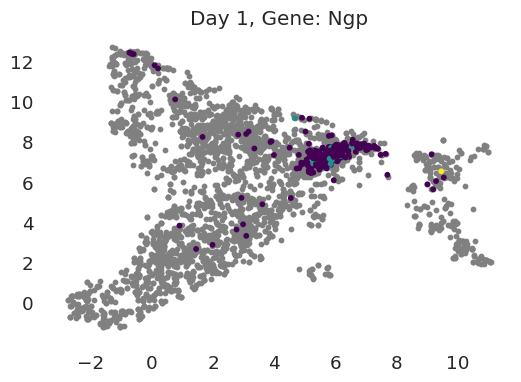

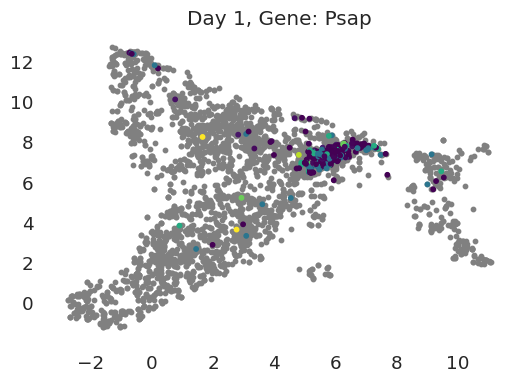

...

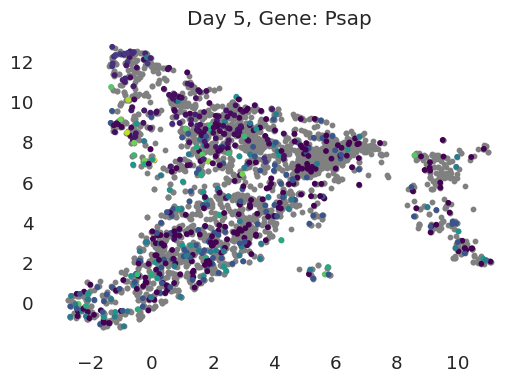

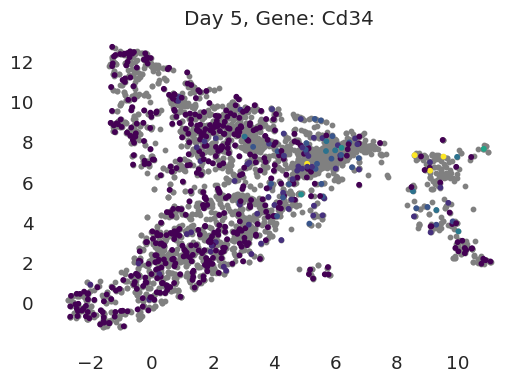

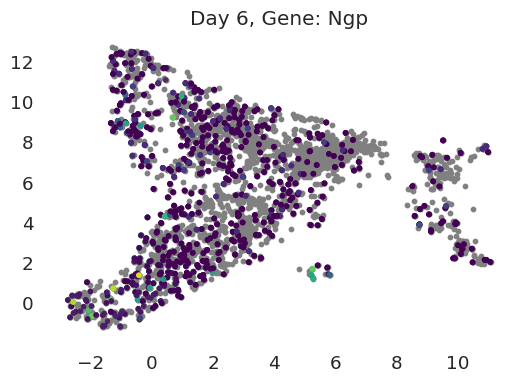

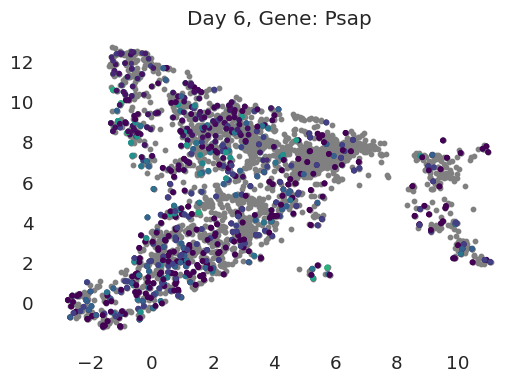

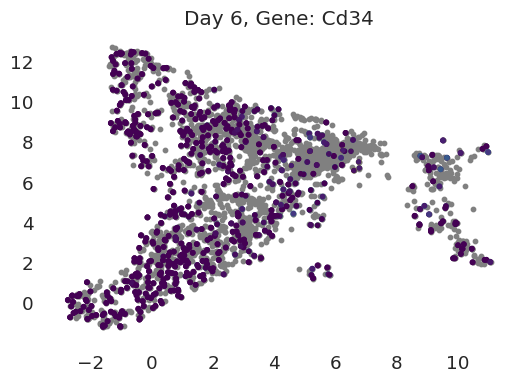

In [ ]:
import matplotlib.pyplot as plt

days = np.unique(inf_adata.obs['Day'])
days = days[days >= 0]

genes_of_interest = ['Ngp', 'Psap', 'Cd34']

for i in days:
    adata_subset = inf_adata[inf_adata.obs['Day'] == i, :]

    for gene_of_interest in genes_of_interest:
        fig = plt.figure(figsize=(6, 4))
        umap_coords = inf_adata.obsm['umap']
        plt.scatter(umap_coords[:, 0], umap_coords[:, 1], color='grey', s=10)

        umap_coords_subset = adata_subset.obsm['umap']
        c_values = adata_subset[:, gene_of_interest].X.A  # Convert to NumPy array
        c_values = np.log1p(c_values)

        plt.scatter(umap_coords_subset[:, 0], umap_coords_subset[:, 1], c=c_values, s=10, cmap='viridis')

        plt.title(f"Day {i}, Gene: {gene_of_interest}")
        plt.grid(False)
        plt.gca().set_facecolor('white')

        plt.show()


# Examine the causes of variance

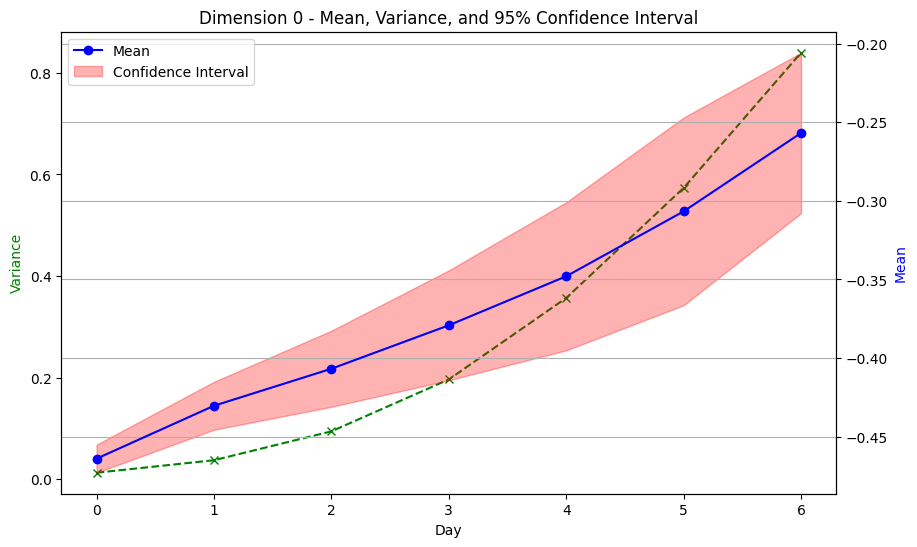

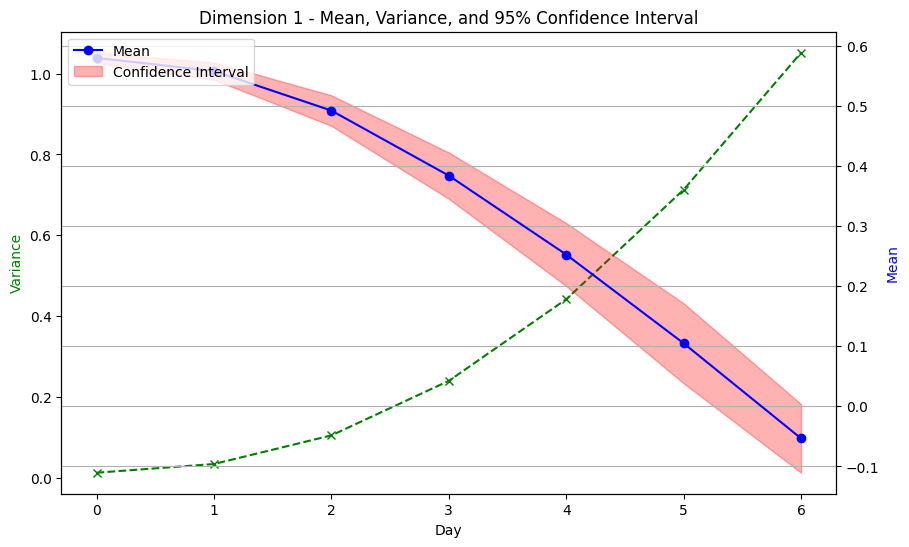

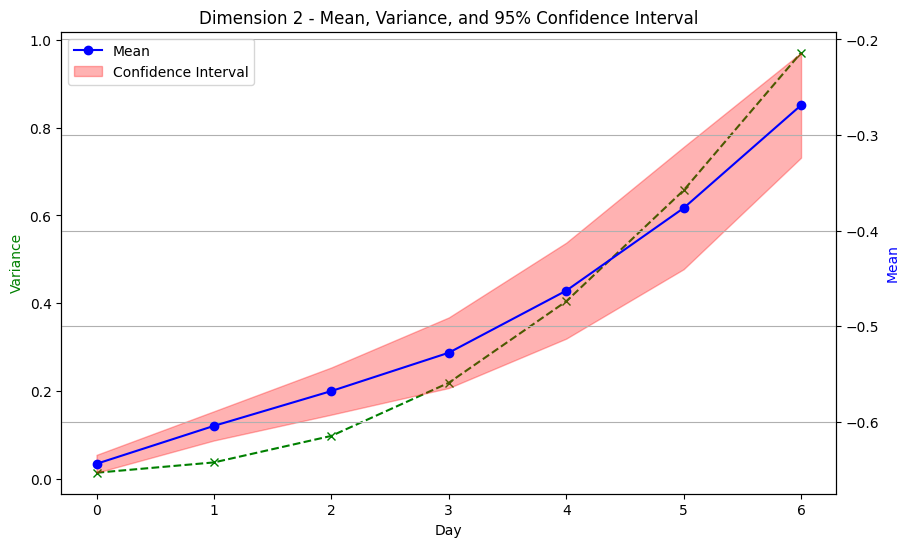

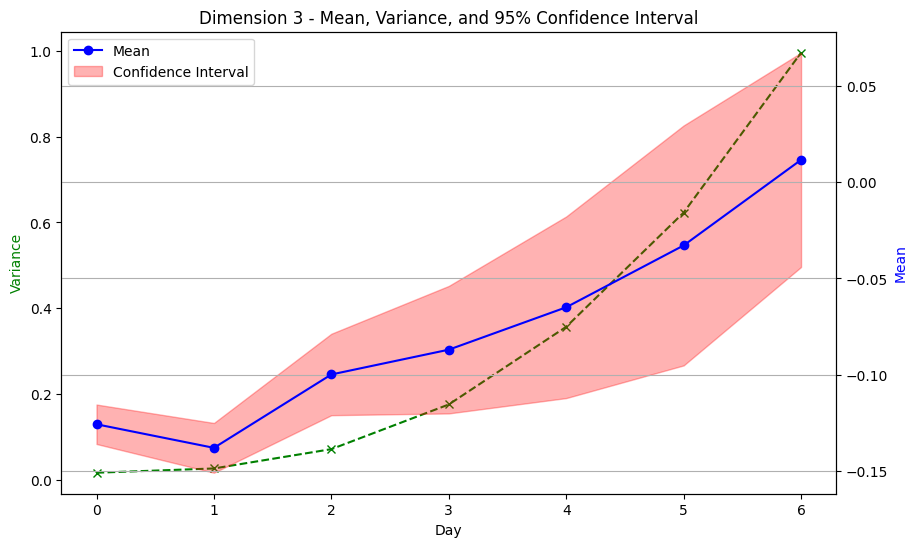

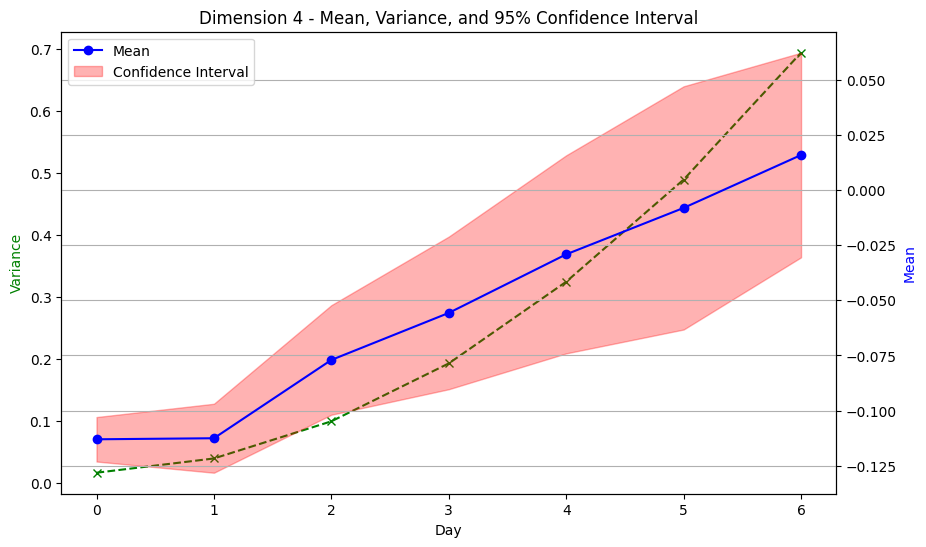

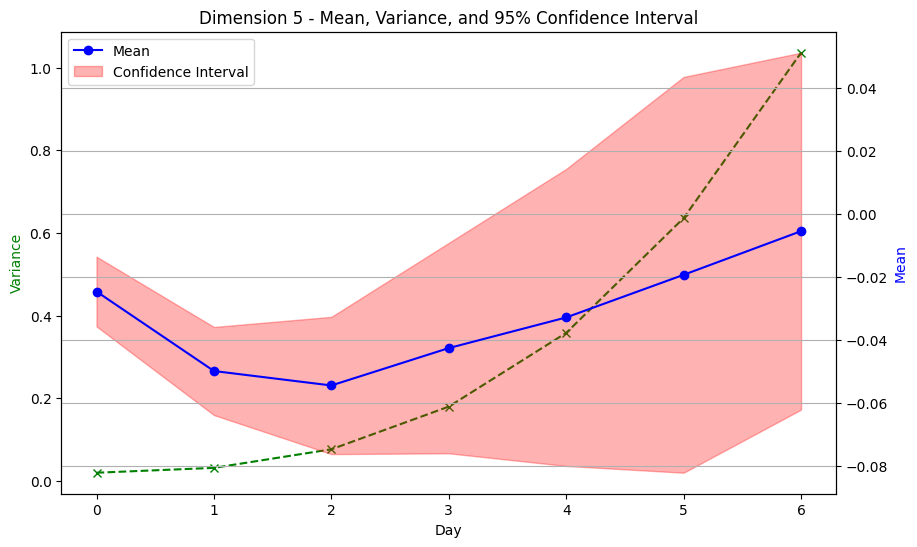

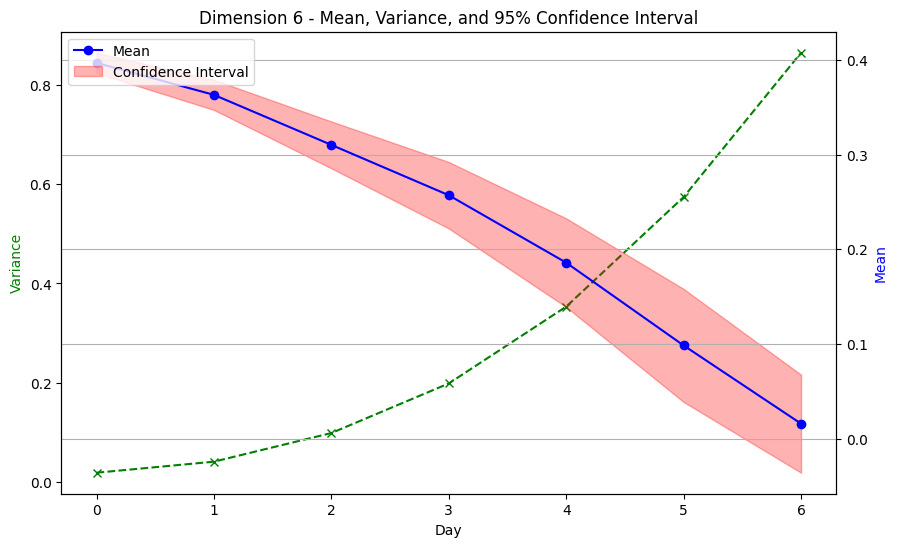

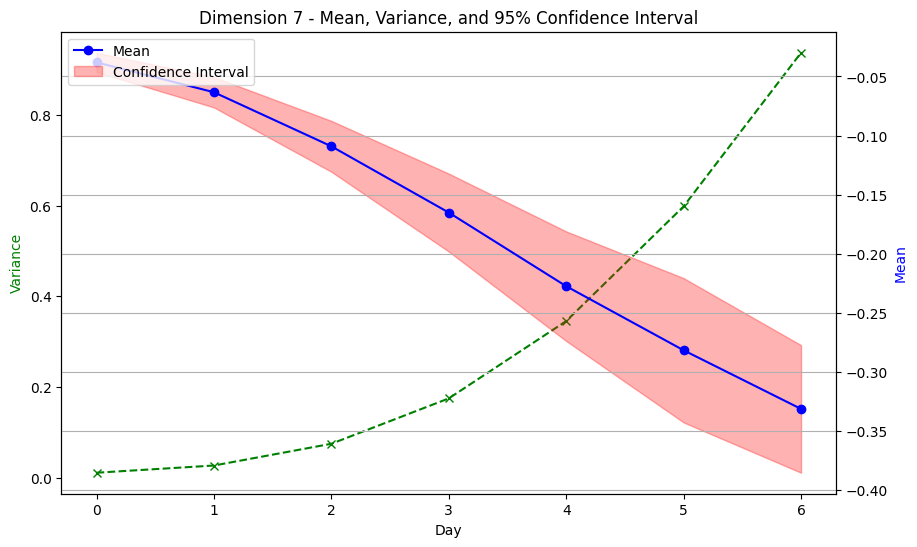

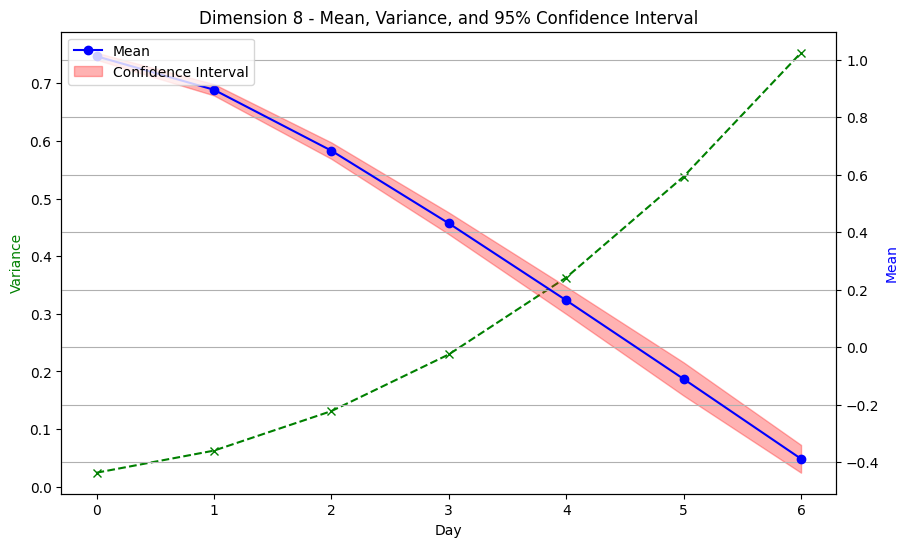

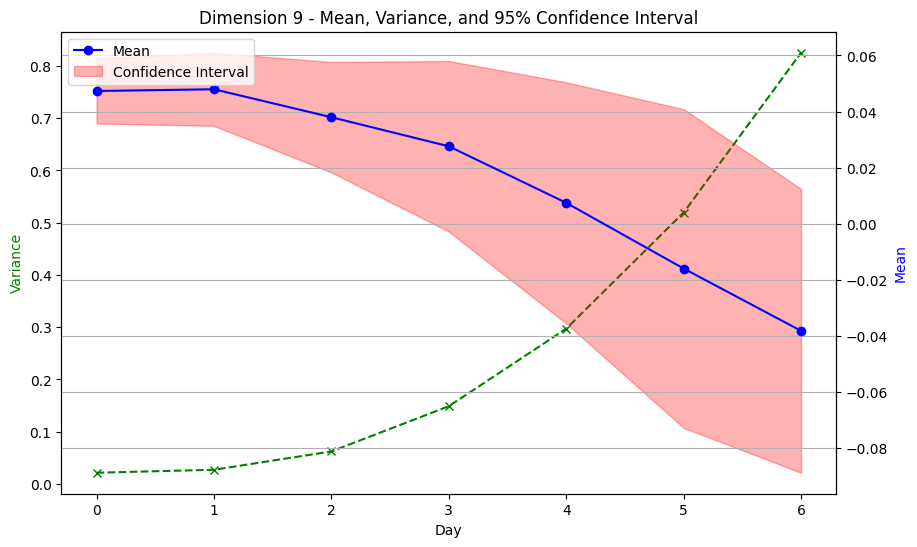

In [ ]:
import matplotlib.pyplot as plt

def plot_dimension_data(dimension_index, z_ranges, confidence_intervals, max_day, save_path=None):
    # Extract data
    means = [z_range[0][dimension_index] for z_range in z_ranges]
    variances = [z_range[1][dimension_index] for z_range in z_ranges]
    lower_bounds = [ci[0][dimension_index] for ci in confidence_intervals]
    upper_bounds = [ci[1][dimension_index] for ci in confidence_intervals]
    days = list(range(max_day + 1))

    # Create a new figure
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot the variance values on the left y-axis (ax1)
    ax1.plot(days, variances, label='Variance', marker='x', linestyle='--', color='g')
    ax1.set_xlabel('Day')
    ax1.set_ylabel('Variance', color='g')

    # Create a secondary y-axis on the right
    ax2 = ax1.twinx()

    # Plot the mean values on the right y-axis (ax2)
    ax2.plot(days, means, label='Mean', marker='o', linestyle='-', color='b')
    ax2.set_ylabel('Mean', color='b')

    # Fill between for the confidence interval (you may need to adjust the color and alpha)
    plt.fill_between(days, lower_bounds, upper_bounds, alpha=0.3, label='Confidence Interval', color='r')

    # Add title and legends
    plt.title(f'Dimension {dimension_index} - Mean, Variance, and 95% Confidence Interval')
    plt.legend(loc='upper left')  # You can adjust the legend position if needed
    plt.grid(True)
    if save_path is not None:
        plt.savefig(save_path, format='png')
        plt.show()
    else:
        plt.show()

# Iterate through dimensions and save plots as PNG files
for i in range(10):
    dimension_index = i
    output_folder = 'z_ranges_plots'
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    file_name = f'z_dimension_{dimension_index}_plot.png'
    save_path = os.path.join(output_folder, file_name)
    plot_dimension_data(dimension_index, z_ranges, confidence_intervals, max_day, save_path)



In [ ]:
import zipfile
import os
from google.colab import files as colab_files
import datetime

# Set the locale
os.environ['LANG'] = 'en_US.UTF-8'
os.environ['LC_ALL'] = 'en_US.UTF-8'

# Directory to be zipped
directory_to_zip = '/content/z_ranges_plots'

# Output ZIP file name
dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
zip_file_name = f"{dt_now}_z_ranges_plots.zip"

# Create a Zip file
with zipfile.ZipFile(zip_file_name, 'w') as zipf:
    for root, dirs, files in os.walk(directory_to_zip):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, directory_to_zip)
            zipf.write(file_path, arcname=arcname)

# Download the ZIP file
colab_files.download(zip_file_name)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import numpy as np

z_matrix = inf_adata[(inf_adata.obs['Day'] == 2) & (inf_adata.obs['differentiation_destination'] == 'Monocyte')].obsm['z']
z_variances = np.var(z_matrix, axis=0)
sorted_z_indices = np.argsort(z_variances)[::-1]
sorted_z_indices

array([8, 6, 4, 3, 5, 1, 2, 0, 9, 7])

In [ ]:
import numpy as np

reconst_exp_matrix = inf_adata[(inf_adata.obs['Day'] == 2) & (inf_adata.obs['differentiation_destination'] == 'Monocyte')].X
reconst_exp_matrix = reconst_exp_matrix.toarray()
reconst_exp_variances = np.var(reconst_exp_matrix, axis=1)
top_10_indices = np.argsort(reconst_exp_variances)[::-1][:10]
top_10_gene_names = inf_adata.var.index[top_10_indices]
bottom_10_indices = np.argsort(reconst_exp_variances)[:10]
bottom_10_gene_names = inf_adata.var.index[bottom_10_indices]

top_10_gene_names


Index(['Tmco1', 'Lpgat1', 'Lrp1', 'Rabgap1l', 'Rufy1', 'Pitpnc1', 'Clk1',
       'Ccng1', 'Micu1', 'Kansl1'],
      dtype='object', name='Gene')

In [ ]:
bottom_10_gene_names

Index(['Atp2b1', 'F11r', 'Prkca', 'Map3k5', 'Ctns', 'Nop58', 'Cd34', 'Usp32',
       'Dram1', 'Xpr1'],
      dtype='object', name='Gene')

In [ ]:
import numpy as np
from scipy.stats import zscore

reconst_exp_matrix = inf_adata[(inf_adata.obs['Day'] == 2) & (inf_adata.obs['differentiation_destination'] == 'Monocyte')].X
reconst_exp_matrix = reconst_exp_matrix.toarray()
reconst_exp_matrix_normalized = zscore(reconst_exp_matrix, axis=1)
reconst_exp_variances_normalized = np.var(reconst_exp_matrix_normalized, axis=1)
top_10_indices = np.argsort(reconst_exp_variances_normalized)[::-1][:10]
top_10_gene_names = inf_adata.var.index[top_10_indices]
bottom_10_indices = np.argsort(reconst_exp_variances_normalized)[:10]
bottom_10_gene_names = inf_adata.var.index[bottom_10_indices]


In [ ]:
top_10_gene_names

Index(['Il1r2', 'Prrc2c', 'Cnot6', 'Cyfip2', 'Sft2d2', 'Micu1', 'Casp8',
       'Itgb2', 'Ndel1', 'Pbx1'],
      dtype='object', name='Gene')

In [ ]:
bottom_10_gene_names

Index(['Cdk4', 'Tmco1', 'Cspp1', 'Smap1', 'Prkca', 'Orc2', 'Dtl', 'Cpd',
       'Clasp1', '2310035C23Rik'],
      dtype='object', name='Gene')

# Compare with other methods

In [ ]:
inf_adata_5 = inf_adata[(inf_adata.obs['Day'] != 6) | (inf_adata.obs['reconst'] != 1)]
check_adata = check_adata[(check_adata.obs['Day'] != 6) | (check_adata.obs['reconst'] != 1)]

In [ ]:
import scvelo as scv

#direction_adata = check_adata[select_adata.obs_names,:]
direction_adata = select_adata.copy()
direction_adata.obsm['umap'] = select_check_adata[select_check_adata.obs['reconst']==0].obsm['umap']
sc.tl.pca(direction_adata)
sc.pp.neighbors(direction_adata, n_pcs=30, n_neighbors=30, random_state=0)
sc.tl.diffmap(direction_adata)
root_idx = np.random.choice(np.where(direction_adata[direction_adata.obs["Celltype"] == "Undifferentiated"].obs["Day"] == 2)[0])
direction_adata.uns["iroot"] = root_idx
sc.tl.dpt(direction_adata)

Normalized count data: X, spliced, unspliced.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 2/2 cores)


  0%|          | 0/492 [00:00<?, ?gene/s]

    finished (0:01:17) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/2 cores)


  0%|          | 0/1180 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
Renamed 'umap' to convention 'X_umap' (adata.obsm).
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


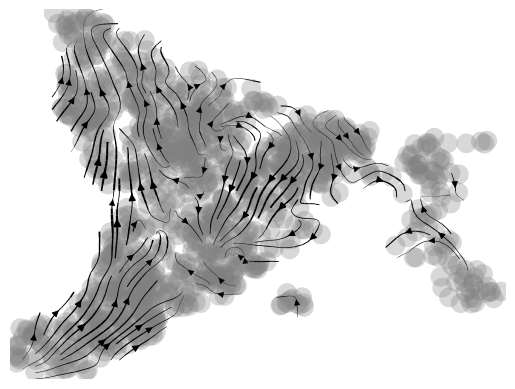

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


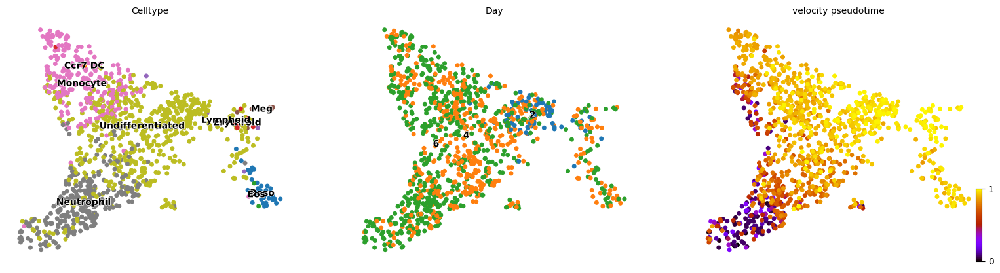

In [ ]:
scv.pp.moments(direction_adata, n_pcs=None, n_neighbors=None)
scv.tl.recover_dynamics(direction_adata, n_jobs=8)
scv.tl.velocity(direction_adata, mode="dynamical")
scv.tl.velocity_graph(direction_adata)
scv.pl.velocity_embedding_stream(direction_adata, basis="umap", legend_fontsize=12, title="", smooth=0.8, min_mass=4)
scv.tl.velocity_pseudotime(direction_adata)
scv.tl.latent_time(direction_adata)
scv.pl.scatter(direction_adata, color=['Celltype', 'Day', 'velocity_pseudotime'], cmap='gnuplot', legend_loc='on data')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


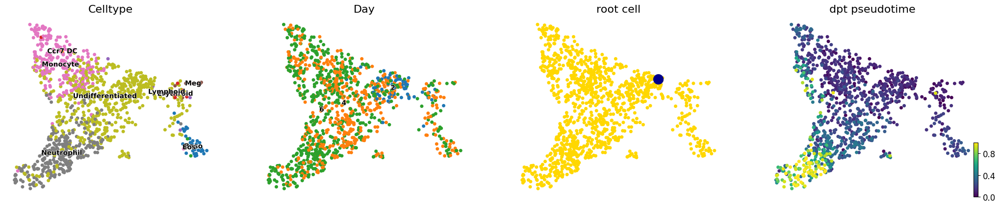

In [ ]:


scv.pl.scatter(
    direction_adata,
    color=["Celltype", 'Day', root_idx, "dpt_pseudotime"],
    fontsize=16,
    cmap="viridis",
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=["Celltype", 'Day', "root cell", "dpt pseudotime"],
    legend_loc='on data',
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-93-34ca98ea0f33>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_reversed = plt.cm.get_cmap("Spectral")


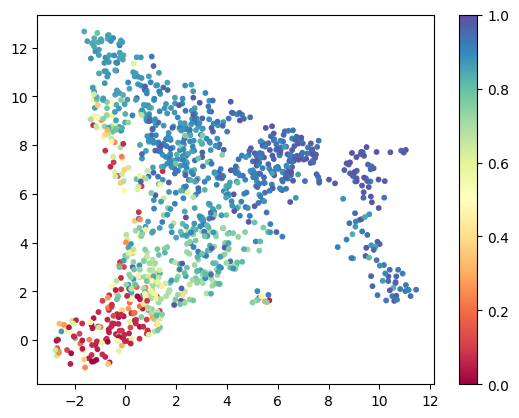

In [ ]:
import matplotlib.pyplot as plt

x = direction_adata.obsm['umap'][:,0]
y = direction_adata.obsm['umap'][:,1]
colors = direction_adata.obs['velocity_pseudotime']
cmap_reversed = plt.cm.get_cmap("Spectral")


plt.scatter(x, y, c=colors, cmap=cmap_reversed, s=10)
plt.grid(False)
plt.gca().set_facecolor('white')
plt.colorbar()
plt.show()

<ipython-input-98-94c1617cc659>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_reversed = plt.cm.get_cmap("Spectral") #.reversed()


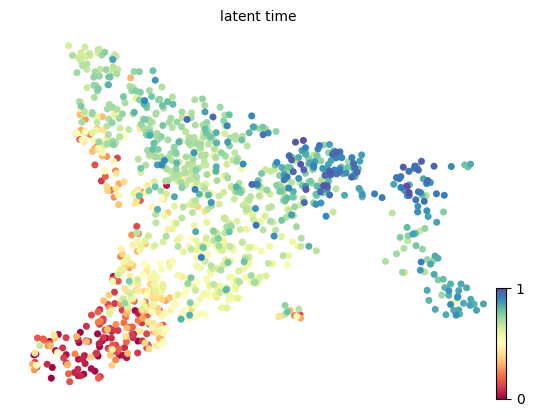

In [ ]:
import matplotlib.pyplot as plt

# Get the 'bwr' colormap and reverse it
cmap_reversed = plt.cm.get_cmap("Spectral") #.reversed()
# Use the reversed colormap in the scv.pl.scatter function
scv.pl.scatter(direction_adata, color=['latent_time'], cmap=cmap_reversed, legend_loc='on data')

<ipython-input-94-fb6b7d4c39ae>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_reversed = plt.cm.get_cmap("Spectral") #.reversed()


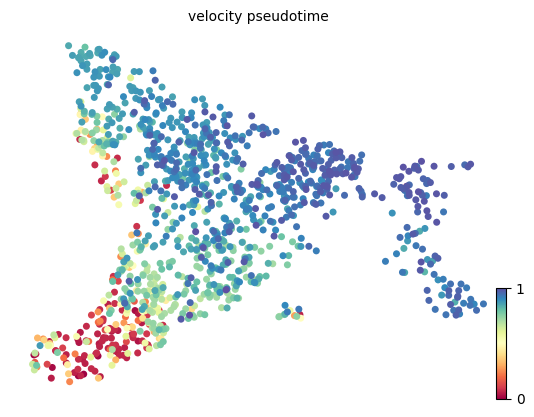

In [ ]:
import matplotlib.pyplot as plt

# Get the 'bwr' colormap and reverse it
cmap_reversed = plt.cm.get_cmap("Spectral") #.reversed()
# Use the reversed colormap in the scv.pl.scatter function
scv.pl.scatter(direction_adata, color=['velocity_pseudotime'], cmap=cmap_reversed, legend_loc='on data')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-95-52937e4213e2>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_reversed = plt.cm.get_cmap("Spectral")


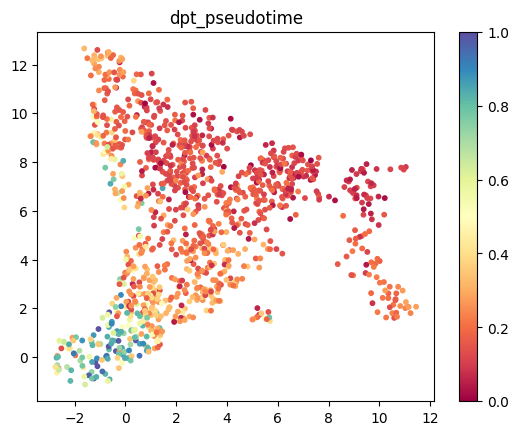

In [ ]:
import matplotlib.pyplot as plt

x = direction_adata.obsm['umap'][:,0]
y = direction_adata.obsm['umap'][:,1]
colors = direction_adata.obs['dpt_pseudotime']
cmap_reversed = plt.cm.get_cmap("Spectral")

plt.title('dpt_pseudotime')
plt.scatter(x, y, c=colors, cmap=cmap_reversed, s=10)
plt.grid(False)
plt.gca().set_facecolor('white')
plt.colorbar()
plt.show()

<ipython-input-96-16ba48ccddf6>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_reversed = plt.cm.get_cmap('Spectral') #.reversed()


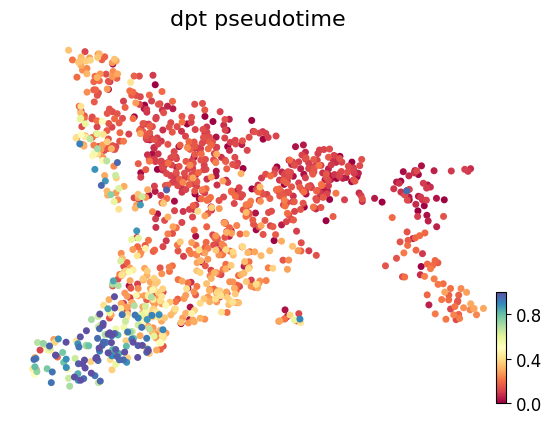

In [ ]:
import matplotlib.pyplot as plt

# Get the 'bwr' colormap and reverse it
cmap_reversed = plt.cm.get_cmap('Spectral') #.reversed()

scv.pl.scatter(
    direction_adata,
    color=['dpt_pseudotime'],
    fontsize=16,
    cmap=cmap_reversed,
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=['dpt_pseudotime'],
    legend_loc='on data',
)

In [ ]:
import pandas as pd


def find_rootcell(inf_adata, direction_adata, order):

    sorted_df = direction_adata.obs.sort_values(by=order)
    for cell_id, dpt_pseudotime in sorted_df.iterrows():
        cell_id = cell_id + "-1"
        if cell_id in inf_adata.obs['CellID'].values:
            return cell_id
            break

rootcell_name = find_rootcell(inf_adata, direction_adata, 'dpt_pseudotime')

In [ ]:
#pseudo0z = inf_adata.obsm['z'][inf_adata.obs['CellID'] == direction_adata.obs.index[direction_adata.obs['dpt_pseudotime'] == 0][0]][0]
#velocity0z = inf_adata.obsm['z'][inf_adata.obs['CellID'] == direction_adata.obs.index[direction_adata.obs['velocity_pseudotime'] == 0][0]][0]
rootcell_name = find_rootcell(inf_adata, direction_adata, 'dpt_pseudotime')
pseudo0z = inf_adata.obsm['z'][inf_adata.obs['CellID'] == rootcell_name][0]
rootcell_name = find_rootcell(inf_adata, direction_adata, 'latent_time')
velocity0z = inf_adata.obsm['z'][inf_adata.obs['CellID'] == rootcell_name][0]
inf0z = inf_adata.obsm['z'][(inf_adata.obs['Day'] == 0) & (inf_adata.obs['initial'] == 6)]
inf0z = np.mean(inf0z, axis=0)
obs2z = check_adata.obsm['z'][(check_adata.obs['initial'] == 2)]
obs2z = np.mean(inf0z, axis=0)
euclidean_distance_pseudo = np.linalg.norm(obs2z - pseudo0z)
euclidean_distance_velocity = np.linalg.norm(obs2z - velocity0z)
euclidean_distance_lineage = np.linalg.norm(obs2z - inf0z)


import pandas as pd

data = {
    'Method': ['Pseudotime', 'scVelo', 'LineageVI'],
    'Euclidean Distance': [euclidean_distance_pseudo, euclidean_distance_velocity, euclidean_distance_lineage]
}
df = pd.DataFrame(data)
print('Euclidean distance between the rootcell and day2 (the most undifferentiated observed cell) for each method')
print(df)


Euclidean distance between the rootcell and day2 (the most undifferentiated observed cell) for each method
       Method  Euclidean Distance
0  Pseudotime            3.843943
1      scVelo            3.661035
2   LineageVI            1.463629


# Analyze progenitor expression bias

In [ ]:
def main_differentiation_destination(inf_adata, dif_ratio, timepoint=None):
    lineage_list = inf_adata.obs['Lineage'].unique().tolist()
    for lineage in lineage_list:
        main_differentiation_destination = 'Undifferentiated'
        inf_adata.obs.loc[(inf_adata.obs['Lineage'] == lineage), 'main_differentiation_destination'] = main_differentiation_destination
        a = inf_adata.obs[(inf_adata.obs['Lineage'] == lineage) & (inf_adata.obs['Day'] == 6) & ~(inf_adata.obs['Celltype'] == 'Undifferentiated')].shape[0]
        if a != 0:
            celltype_list = inf_adata.obs['Celltype'].unique().tolist()
            celltype_list = [str(x) for x in celltype_list]
            celltype_list = [x for x in celltype_list if x != 'nan']
            for celltype in celltype_list:
                b = inf_adata.obs[(inf_adata.obs['Lineage'] == lineage) & (inf_adata.obs['Day'] == 6) & (inf_adata.obs['Celltype'] == celltype)].shape[0]
                if b/a > dif_ratio:
                    main_differentiation_destination = celltype
            if timepoint is not None:
                inf_adata.obs.loc[(inf_adata.obs['Lineage'] == lineage) & (inf_adata.obs['inference'] == timepoint), 'main_differentiation_destination'] = main_differentiation_destination
            else:
                inf_adata.obs.loc[inf_adata.obs['Lineage'] == lineage, 'main_differentiation_destination'] = main_differentiation_destination
    return(inf_adata)

In [ ]:
inf_adata = main_differentiation_destination(inf_adata, 0.4)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


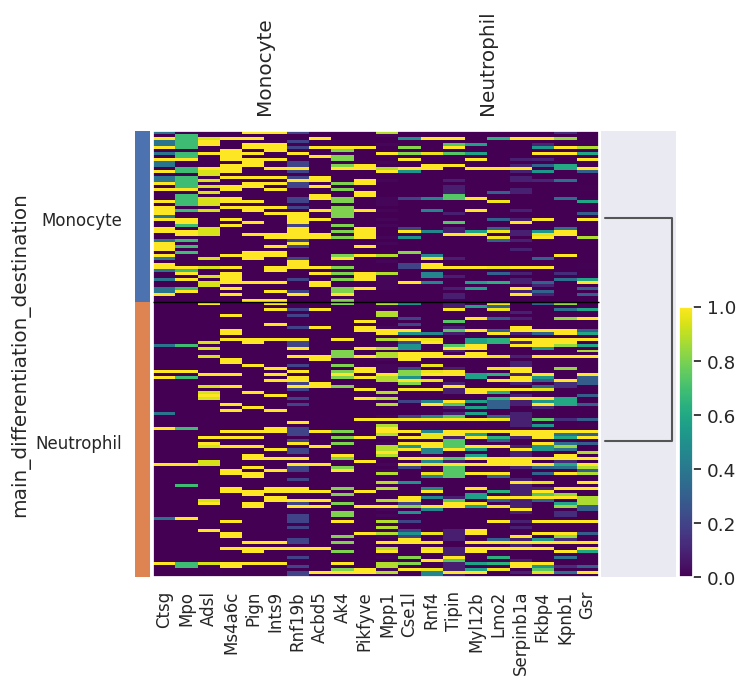

In [ ]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt


inf_adata_day1 = inf_adata[(inf_adata.obs['Day'] == 0) & (inf_adata.obs['reconst'] == 1)].copy()
inf_adata_day1 = inf_adata_day1[
    (inf_adata_day1.obs['main_differentiation_destination'] == 'Monocyte') |
    (inf_adata_day1.obs['main_differentiation_destination'] == 'Neutrophil')
]


valid_groups = [group for group in inf_adata_day1.obs['main_differentiation_destination'].unique() if (inf_adata_day1.obs['main_differentiation_destination'] == group).sum() > 1]
inf_adata_day1 = inf_adata_day1[inf_adata_day1.obs['main_differentiation_destination'].isin(valid_groups)]

sc.pp.scale(inf_adata_day1, zero_center=True, max_value=1)


sc.tl.rank_genes_groups(inf_adata_day1, groupby='main_differentiation_destination', method='wilcoxon', key_added='wilcoxon')


sc.pl.rank_genes_groups_heatmap(
    inf_adata_day1,
    n_genes=10,
    key='wilcoxon',
    groupby='main_differentiation_destination',
    show_gene_labels=True,
    vmin=0,
    vmax=1,
    cmap='viridis'
)


plt.show()


In [ ]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def differential_expression(adata, day_value, reconst_value, cell_types=None, n_genes=10, cmap='viridis'):

    inf_adata_day = adata[(adata.obs['Day'] == day_value) & (adata.obs['reconst'] == reconst_value)].copy()

    if cell_types:
        inf_adata_day = inf_adata_day[inf_adata_day.obs['main_differentiation_destination'].isin(cell_types)]

    valid_groups = [group for group in inf_adata_day.obs['main_differentiation_destination'].unique() if (inf_adata_day.obs['main_differentiation_destination'] == group).sum() > 1]
    inf_adata_day = inf_adata_day[inf_adata_day.obs['main_differentiation_destination'].isin(valid_groups)]

    sc.pp.scale(inf_adata_day, zero_center=True, max_value=1)

    key = 'wilcoxon'
    if key not in inf_adata_day.uns:
        sc.tl.rank_genes_groups(inf_adata_day, groupby='main_differentiation_destination', method='wilcoxon', key_added=key)

    ranked_genes_df = sc.get.rank_genes_groups_df(inf_adata_day, key=key, group=None)

    top_genes = ranked_genes_df.groupby('group').head(n_genes)

    top_gene_names = top_genes['names'].unique()

    top_genes_matrix = inf_adata_day[:, top_gene_names].X

    cd34_expression = inf_adata_day[:, 'Cd34'].X

    if isinstance(top_genes_matrix, np.ndarray):
        cd34_expression = cd34_expression.toarray().flatten()

    cd34_expression_scaled = (cd34_expression - np.min(cd34_expression)) / (np.max(cd34_expression) - np.min(cd34_expression))

    final_matrix = np.hstack((top_genes_matrix, cd34_expression_scaled[:, np.newaxis]))

    genes_list = list(top_gene_names) + ['Cd34']
    final_df = pd.DataFrame(final_matrix, columns=genes_list)
    final_df['destination'] = inf_adata_day.obs['main_differentiation_destination'].tolist()
    sorted_df = final_df.sort_values(by='destination')
    sorted_final_df = sorted_df.drop(columns='destination')

    plt.figure(figsize=(10, 8))
    sns.heatmap(sorted_final_df, cmap=cmap, vmin=0, vmax=1, yticklabels=False)
    plt.yticks([])
    cell_types_str = ' and '.join(cell_types)
    plt.title(f'Comparison of {cell_types_str} at Day {day_value}', fontsize=16)
    plt.show()


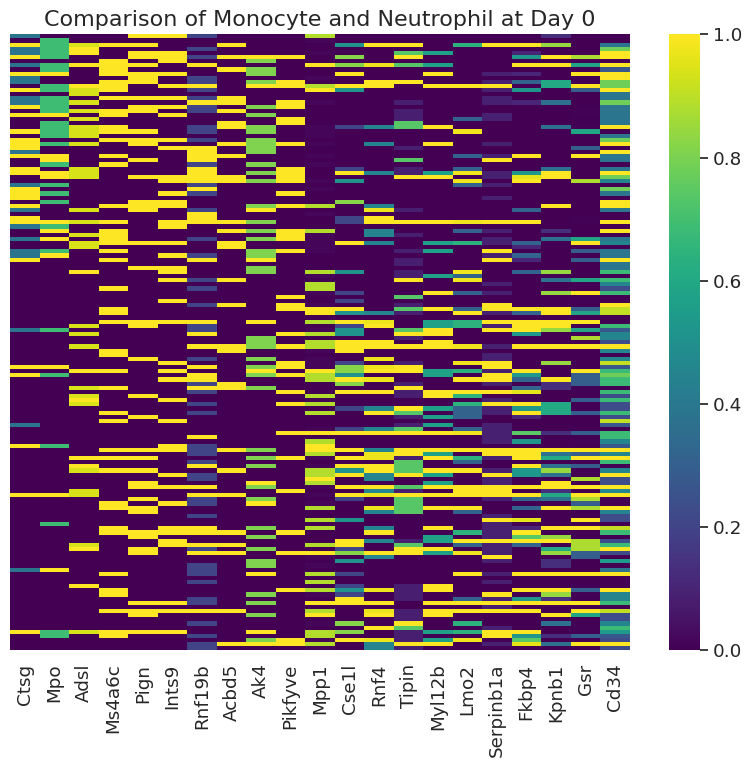

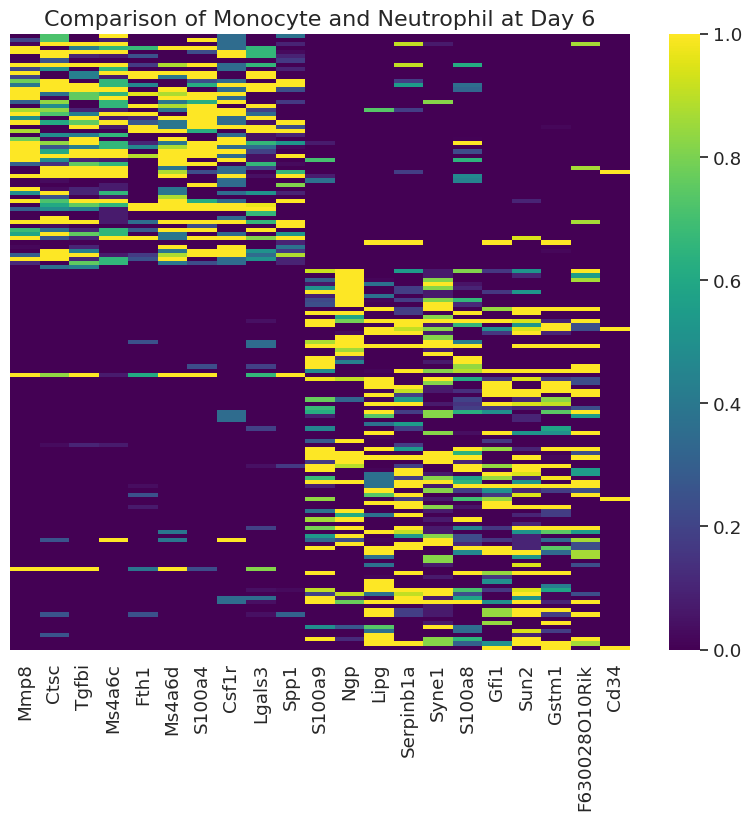

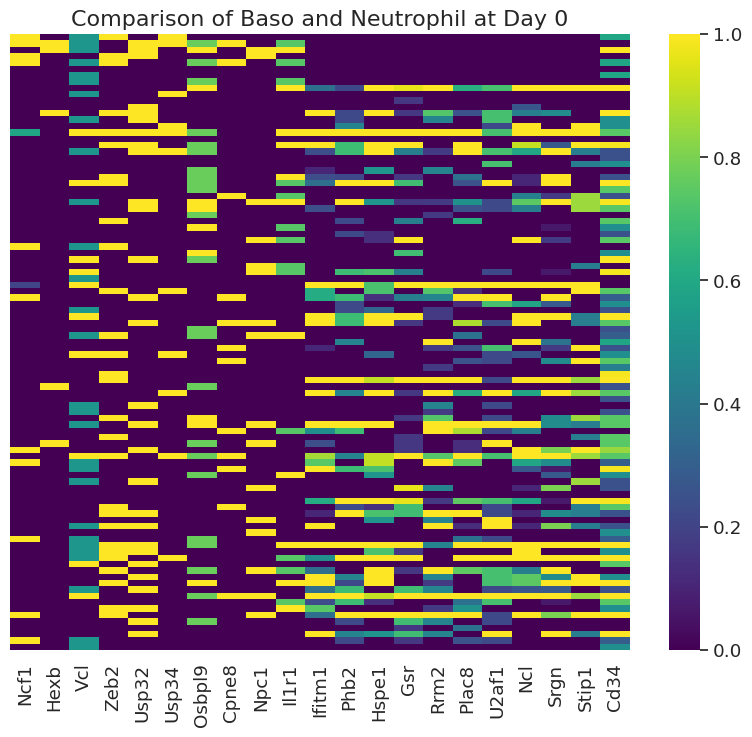

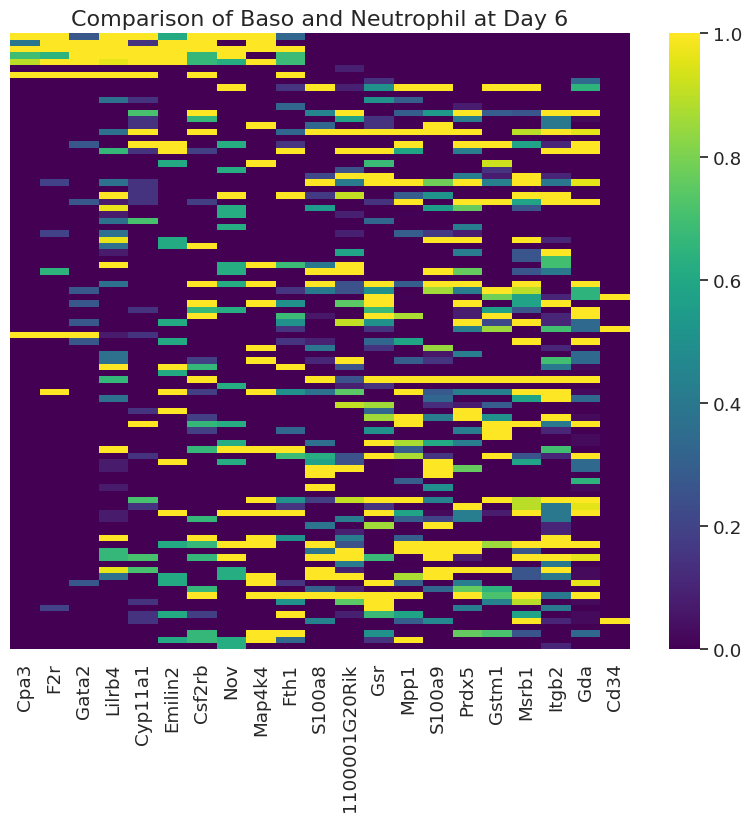

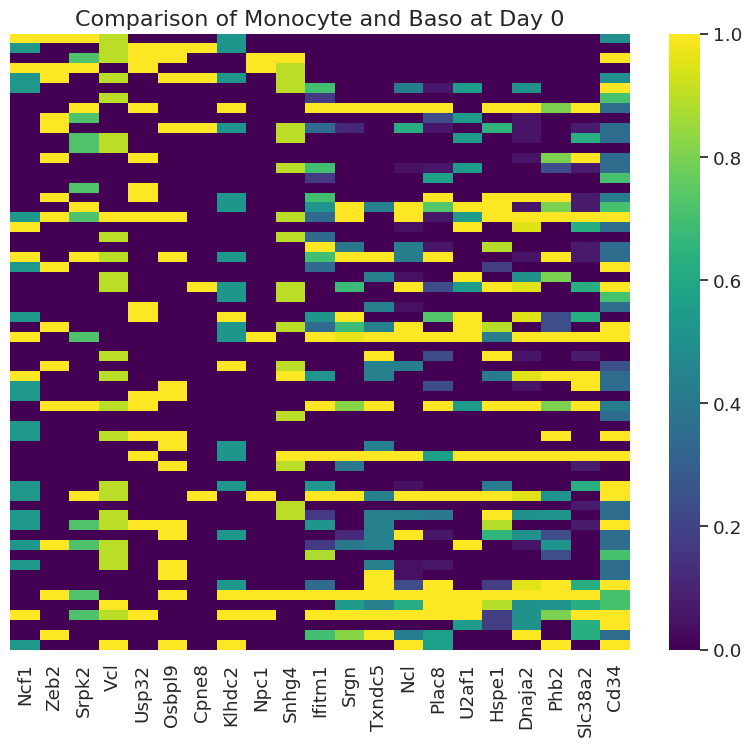

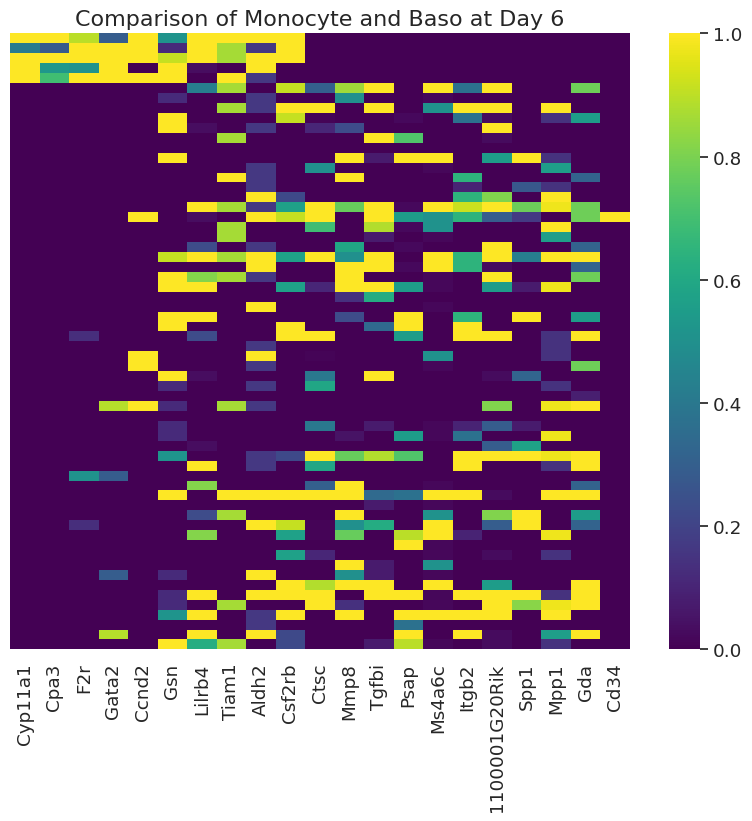

In [ ]:
combinations = [
    (0, 1, ['Monocyte', 'Neutrophil']),
    (6, 0, ['Monocyte', 'Neutrophil']),
    (0, 1, ['Baso', 'Neutrophil']),
    (6, 0, ['Baso', 'Neutrophil']),
    (0, 1, ['Monocyte', 'Baso']),
    (6, 0, ['Monocyte', 'Baso'])
]

for day_value, reconst_value, cell_types in combinations:
    differential_expression(inf_adata, day_value, reconst_value, cell_types)


# Analyze time series transcription factor activity

## Create TF expression, TG expression, regulation matrix

In [ ]:
inf_adata, trans = latent_transition_inferens(adata_6, LineageVAE_exp, adata.var_names, dynamics=True, trans=trans)

In [ ]:
import pandas as pd
import numpy as np
import anndata as ad



def process_tf_data(tf_target, inf_adata):
    tf_target['TF_Symbol'] = tf_target['TF_Symbol'].apply(lambda x: x[0] + x[1:].lower())
    tf_target['Target_Symbol'] = tf_target['Target_Symbol'].apply(lambda x: x[0] + x[1:].lower())

    TFs = list(set(inf_adata.var_names.tolist()) & set(tf_target['TF_Symbol'].tolist()))
    TGs = list(set(inf_adata.var_names.tolist()) & set(tf_target['Target_Symbol'].tolist()))

    tf_adata = inf_adata[:, list(set(TGs) | set(TFs))]
    day_six_cell_ids = tf_adata[tf_adata.obs['Day'] == 6].obs['CellID']
    tf_adata = tf_adata[tf_adata.obs['CellID'].isin(day_six_cell_ids)]
    days = np.unique(tf_adata.obs['Day'])
    days = days[days >= 0]
    tf_adata = tf_adata[tf_adata.obs['Day'].isin(days)]
    tf_adata = tf_adata[tf_adata.obs['reconst'] == 1]

    tf_mask = np.isin(tf_target['TF_Symbol'], TFs)
    filtered_tf_target = tf_target[tf_mask]
    targets_mask = np.isin(filtered_tf_target['Target_Symbol'], TGs)
    tf_target = filtered_tf_target[targets_mask]

    tg_indices = [idx for idx, gene in enumerate(tf_adata.var_names) if gene in TGs]
    tg_matrix = tf_adata.X[:, tg_indices].toarray()
    tg_matrix = pd.DataFrame(tg_matrix, index=tf_adata.obs_names, columns=TGs)

    matrix = np.zeros((len(TFs), len(TGs)))
    for i, tf in enumerate(TFs):
        for j, target in enumerate(TGs):
            if target in tf_target.loc[tf_target['TF_Symbol'] == tf]['Target_Symbol'].tolist():
                matrix[i, j] = 1
    regulation_matrix = pd.DataFrame(matrix, index=TFs, columns=TGs)

    tf_indices = [idx for idx, gene in enumerate(tf_adata.var_names) if gene in TFs]
    tf_expression = tf_adata.X[:, tf_indices].toarray()
    tf_expression_df = pd.DataFrame(tf_expression, index=tf_adata.obs_names, columns=TFs)

    return regulation_matrix, tf_expression_df, tg_matrix


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import anndata as ad
from scipy.sparse import csr_matrix, issparse, vstack

def average_ann_data(anndata_list):

    if not anndata_list:
        return None

    sum_X = None
    num_matrices = 0

    for adata in anndata_list:
        if adata.X is not None and issparse(adata.X):
            if sum_X is None:
                sum_X = adata.X.copy()
            else:
                sum_X += adata.X
            num_matrices += 1

    average_X = sum_X / num_matrices
    average_adata = ad.AnnData(X=average_X)

    if anndata_list[0].obs is not None:
        average_adata.obs = anndata_list[0].obs.copy()
    if anndata_list[0].var is not None:
        average_adata.var = anndata_list[0].var.copy()
    if anndata_list[0].uns is not None:
        average_adata.uns = anndata_list[0].uns.copy()

    if any(adata.obsm is not None for adata in anndata_list):
        average_adata.obsm = {}
        for key in anndata_list[0].obsm.keys():
            obsm_values = [adata.obsm[key] for adata in anndata_list if key in adata.obsm]
            average_adata.obsm[key] = sum(obsm_values) / num_matrices

    if any(adata.layers is not None for adata in anndata_list):
        average_adata.layers = {}
        for key in anndata_list[0].layers.keys():
            layers_values = [adata.layers[key] for adata in anndata_list if key in adata.layers]
            average_adata.layers[key] = sum(layers_values) / num_matrices

    return average_adata


In [ ]:
import datetime
from google.colab import files
import anndata

sampling_method = 'average'

if sampling_method=='single':
    tf_target = pd.read_csv("tf_target.txt" , sep='\t')
    regulation_matrix, tf_expression_df, tg_matrix = process_tf_data(tf_target, inf_adata)
    average_inf_adata = inf_adata

elif sampling_method=='average':

    tf_target = pd.read_csv("tf_target.txt" , sep='\t')
    tf_expression_df_list = []
    tg_matrix_list = []
    inf_adata_list = []

    for i in range(100):
        inf_adata_sample, _ = latent_transition_inferens(adata_6, LineageVAE_exp, adata.var_names, dynamics=True, trans=trans) #input
        regulation_matrix, tf_expression_df, tg_matrix = process_tf_data(tf_target, inf_adata_sample)
        tf_expression_df_list.append(tf_expression_df)
        tg_matrix_list.append(tg_matrix)
        inf_adata_list.append(inf_adata_sample)


    average_tf_expression_df = tf_expression_df_list[0]
    for matrix in tf_expression_df_list[1:]:
        average_tf_expression_df = average_tf_expression_df.add(matrix, fill_value=0)
    average_tf_expression_df /= len(tf_expression_df_list)

    average_tg_matrix = tg_matrix_list[0]
    for matrix in tg_matrix_list[1:]:
        average_tg_matrix = average_tg_matrix.add(matrix, fill_value=0)
    average_tg_matrix /= len(tg_matrix_list)

    average_inf_adata = average_ann_data(inf_adata_list)
    dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
    average_inf_adata.write_h5ad(dt_now + "_average_inf_adata.h5ad")
    files.download(dt_now + "_average_inf_adata.h5ad")
    # Load AnnData object
    #loaded_adata = anndata.read_h5ad("average_inf_adata.h5ad")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
import numpy as np


tf_target = pd.read_csv("tf_target.txt" , sep='\t')
tf_target['TF_Symbol'] = tf_target['TF_Symbol'].apply(lambda x: x[0] + x[1:].lower())
tf_target['Target_Symbol'] = tf_target['Target_Symbol'].apply(lambda x: x[0] + x[1:].lower())
TFs = list(set(inf_adata.var_names.tolist()) & set(tf_target['TF_Symbol'].tolist()))
TGs = list(set(inf_adata.var_names.tolist()) & set(tf_target['Target_Symbol'].tolist()))
tf_adata = inf_adata[:,list(set(TGs)|set(TFs))]
day_six_cell_ids = tf_adata[tf_adata.obs['Day'] == 6].obs['CellID']
tf_adata = tf_adata[tf_adata.obs['CellID'].isin(day_six_cell_ids)]
days = np.unique(tf_adata.obs['Day'])
days = days[days >= 0]
tf_adata = tf_adata[tf_adata.obs['Day'].isin(days)]
tf_adata = tf_adata[tf_adata.obs['reconst'] == 1]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import numpy as np

delta_adata = inf_adata[:,list(set(TGs)|set(TFs))]
delta_adata = delta_adata[delta_adata.obs['initial'] == 6]
delta_adata = delta_adata[delta_adata.obs['reconst'] == 1]
days = np.unique(delta_adata.obs['Day'])
tg_delta = np.empty((0, len(np.unique(delta_adata.var_names))))
for i in range(np.max(days)):
    delta_i = delta_adata[delta_adata.obs['Day'] == i].X.toarray() - delta_adata[delta_adata.obs['Day'] == i+1].X.toarray()
    tg_delta = np.vstack((tg_delta, delta_i))
np.savetxt(dt_now + '_tg_delta.csv', tg_delta, delimiter=',')
files.download(dt_now + '_tg_delta.csv')
tg_delta

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

array([[ 0.,  0.,  0., ...,  3.,  0., -1.],
       [ 1.,  1.,  6., ..., -4.,  0.,  0.],
       [ 0.,  0., -4., ..., -3., -1.,  0.],
       ...,
       [ 1.,  0.,  1., ...,  2.,  0.,  0.],
       [ 0., -1.,  4., ...,  0.,  1.,  0.],
       [ 0.,  3.,  0., ...,  0.,  0.,  1.]])

## Calculate time-series changes in dynamics norm

Average Norm

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


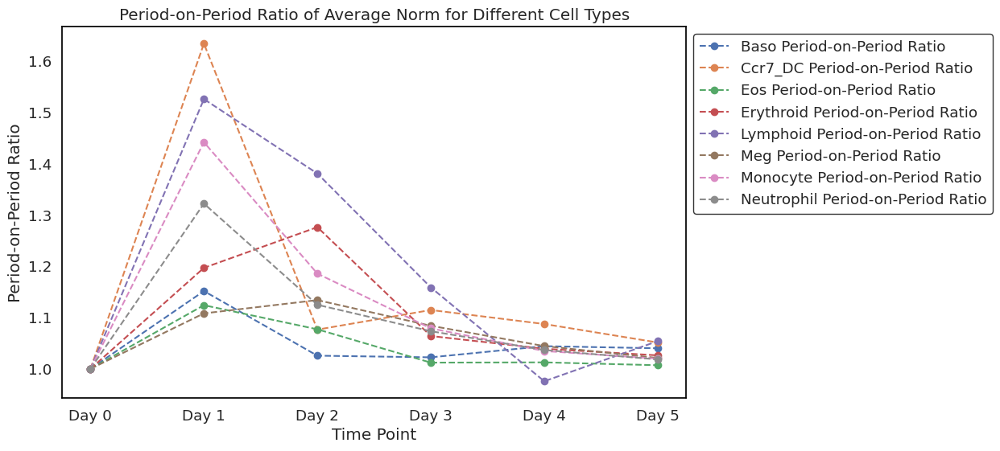

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

velocity_data = average_inf_adata.obsm['dl']
unique_cell_types = np.unique(average_inf_adata.obs['differentiation_destination'])
unique_cell_types = unique_cell_types[unique_cell_types != 'Undifferentiated']

cell_type_data_dict = {}
fig, ax = plt.subplots(figsize=(10, 6), facecolor='white', edgecolor='black')

for cell_type in unique_cell_types:

    cell_type_mask = average_inf_adata.obs['differentiation_destination'] == cell_type
    cell_type_data = velocity_data[cell_type_mask]
    unique_time_points = np.unique(average_inf_adata.obs['Day'])
    unique_time_points = unique_time_points[unique_time_points >= 0]
    unique_time_points = unique_time_points[unique_time_points != np.max(unique_time_points)]

    time_points_list = []
    period_ratios_list = []

    sorted_time_points = np.sort(unique_time_points)

    for i in range(len(sorted_time_points)):
        current_time_point = sorted_time_points[i]

        if i == 0:
            period_ratio = 1.0
        else:
            previous_time_point = sorted_time_points[i - 1]

            current_time_mask = (average_inf_adata.obs['Day'] == current_time_point) & cell_type_mask
            previous_time_mask = (average_inf_adata.obs['Day'] == previous_time_point) & cell_type_mask

            current_time_data = velocity_data[current_time_mask]
            previous_time_data = velocity_data[previous_time_mask]

            current_norms = np.linalg.norm(current_time_data, axis=1)
            previous_norms = np.linalg.norm(previous_time_data, axis=1)

            current_average_norm = np.mean(current_norms)
            previous_average_norm = np.mean(previous_norms)
            period_ratio = current_average_norm / previous_average_norm

        time_points_list.append(int(current_time_point))
        period_ratios_list.append(period_ratio)

    cell_type_data_dict[cell_type] = (time_points_list, period_ratios_list)

    ax.plot(time_points_list, period_ratios_list, label=f'{cell_type} Period-on-Period Ratio', marker='o', linestyle='--')

ax.set_xlabel('Time Point')
ax.set_ylabel('Period-on-Period Ratio')
ax.set_title('Period-on-Period Ratio of Average Norm for Different Cell Types')
ax.grid(True)

ax.set_xticks(sorted_time_points)
ax.set_xticklabels([f'Day {int(day)}' for day in sorted_time_points])
ax.set_facecolor('white')

legend = ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=True, facecolor='white')
frame = legend.get_frame()
frame.set_edgecolor('black')

for spine in ax.spines.values():
    spine.set_edgecolor('black')

plt.show()


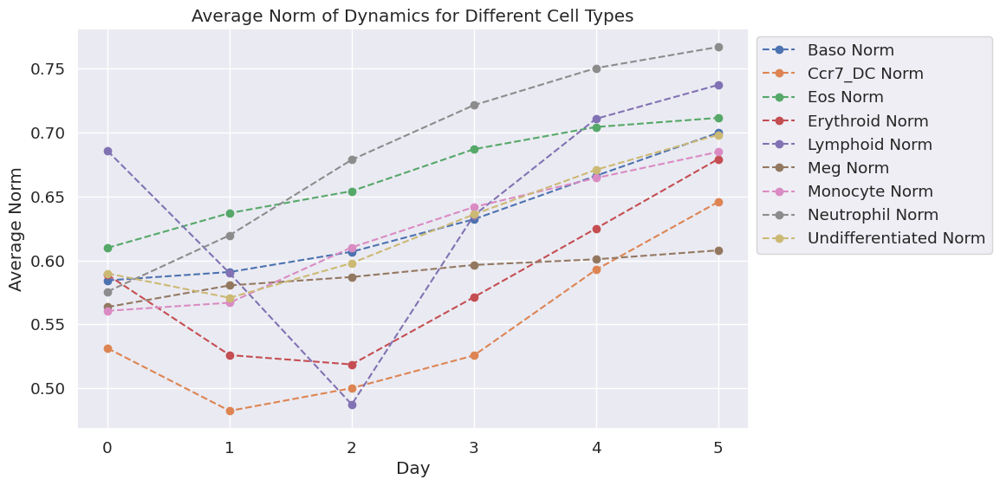

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

velocity_data = inf_adata.obsm['dl']
unique_cell_types = np.unique(inf_adata.obs['differentiation_destination'])
cell_type_data_dict = {}

for cell_type in unique_cell_types:
    cell_type_mask = inf_adata.obs['differentiation_destination'] == cell_type
    cell_type_data = velocity_data[cell_type_mask]

    unique_time_points = np.unique(inf_adata.obs['Day'])
    unique_time_points = unique_time_points[unique_time_points >= 0]
    unique_time_points = unique_time_points[unique_time_points != np.max(unique_time_points)]

    time_points_list = []
    average_norms_list = []

    for time_point in unique_time_points:
        time_mask = (inf_adata.obs['Day'] == time_point) & cell_type_mask
        time_data = velocity_data[time_mask]
        norms = np.linalg.norm(time_data, axis=1)
        average_norm = np.mean(norms)
        time_points_list.append(time_point)
        average_norms_list.append(average_norm)

    cell_type_data_dict[cell_type] = (time_points_list, average_norms_list)

plt.figure(figsize=(10, 6))

for cell_type, (time_points, average_norms) in cell_type_data_dict.items():
    plt.plot(time_points, average_norms, label=f'{cell_type} Norm', marker='o', linestyle='--')

plt.xlabel('Day')
plt.ylabel('Average Norm')
plt.title('Average Norm of Dynamics for Different Cell Types')
plt.grid(True)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


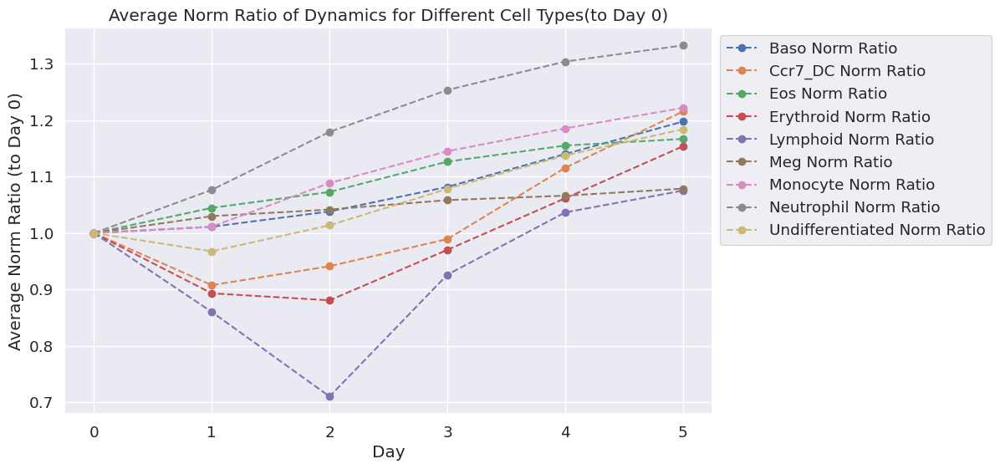

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

velocity_data = inf_adata.obsm['dl']
unique_cell_types = np.unique(inf_adata.obs['differentiation_destination'])

cell_type_data_dict = {}

for cell_type in unique_cell_types:
    cell_type_mask = inf_adata.obs['differentiation_destination'] == cell_type
    cell_type_data = velocity_data[cell_type_mask]
    unique_time_points = np.unique(inf_adata.obs['Day'])
    unique_time_points = unique_time_points[unique_time_points >= 0]
    unique_time_points = unique_time_points[unique_time_points != np.max(unique_time_points)]
    time_mask_0 = (inf_adata.obs['Day'] == 0) & cell_type_mask
    time_data_0 = velocity_data[time_mask_0]
    norm_0 = np.mean(np.linalg.norm(time_data_0, axis=1))
    time_points_list = []
    ratio_norms_list = []

    for time_point in unique_time_points:
        time_mask = (inf_adata.obs['Day'] == time_point) & cell_type_mask
        time_data = velocity_data[time_mask]
        norms = np.linalg.norm(time_data, axis=1)
        average_norm = np.mean(norms)
        ratio_norm = average_norm / norm_0
        time_points_list.append(time_point)
        ratio_norms_list.append(ratio_norm)

    cell_type_data_dict[cell_type] = (time_points_list, ratio_norms_list)

plt.figure(figsize=(10, 6))

for cell_type, (time_points, ratio_norms) in cell_type_data_dict.items():
    plt.plot(time_points, ratio_norms, label=f'{cell_type} Norm Ratio', marker='o', linestyle='--')

plt.xlabel('Day')
plt.ylabel('Average Norm Ratio (to Day 0)')
plt.title('Average Norm Ratio of Dynamics for Different Cell Types(to Day 0)')
plt.grid(True)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


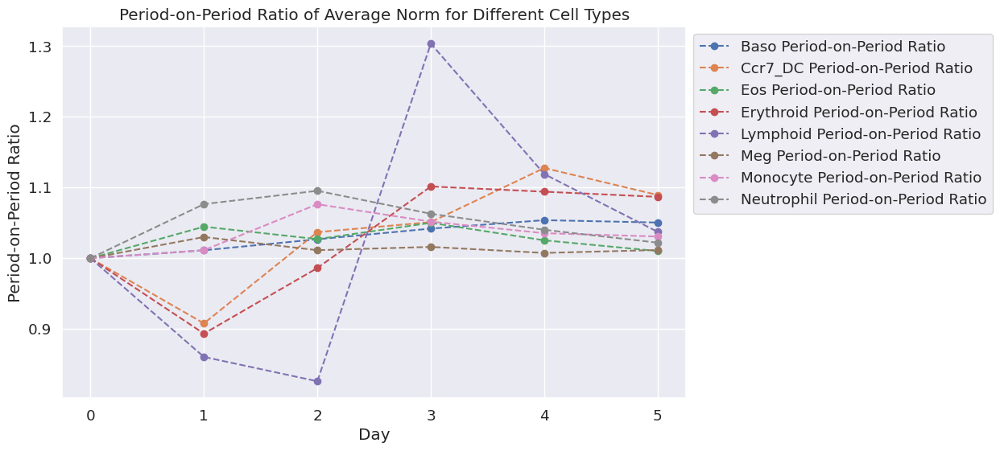

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

velocity_data = inf_adata.obsm['dl']
unique_cell_types = np.unique(inf_adata.obs['differentiation_destination'])
unique_cell_types = unique_cell_types[unique_cell_types != 'Undifferentiated']

cell_type_data_dict = {}

for cell_type in unique_cell_types:
    cell_type_mask = inf_adata.obs['differentiation_destination'] == cell_type
    cell_type_data = velocity_data[cell_type_mask]
    unique_time_points = np.unique(inf_adata.obs['Day'])
    unique_time_points = unique_time_points[unique_time_points >= 0]
    unique_time_points = unique_time_points[unique_time_points != np.max(unique_time_points)]
    time_points_list = []
    period_ratios_list = []
    sorted_time_points = np.sort(unique_time_points)

    for i in range(len(sorted_time_points)):
        current_time_point = sorted_time_points[i]

        if i == 0:
            period_ratio = 1.0
        else:
            previous_time_point = sorted_time_points[i - 1]
            current_time_mask = (inf_adata.obs['Day'] == current_time_point) & cell_type_mask
            previous_time_mask = (inf_adata.obs['Day'] == previous_time_point) & cell_type_mask
            current_time_data = velocity_data[current_time_mask]
            previous_time_data = velocity_data[previous_time_mask]
            current_norms = np.linalg.norm(current_time_data, axis=1)
            previous_norms = np.linalg.norm(previous_time_data, axis=1)
            current_average_norm = np.mean(current_norms)
            previous_average_norm = np.mean(previous_norms)
            period_ratio = current_average_norm / previous_average_norm
        time_points_list.append(int(current_time_point))
        period_ratios_list.append(period_ratio)
    cell_type_data_dict[cell_type] = (time_points_list, period_ratios_list)

plt.figure(figsize=(10, 6))

for cell_type, (time_points, period_ratios) in cell_type_data_dict.items():
    plt.plot(time_points, period_ratios, label=f'{cell_type} Period-on-Period Ratio', marker='o', linestyle='--')

plt.xlabel('Day')
plt.ylabel('Period-on-Period Ratio')
plt.title('Period-on-Period Ratio of Average Norm for Different Cell Types')
plt.grid(True)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(np.arange(min(sorted_time_points), max(sorted_time_points)+1, 1))
plt.show()


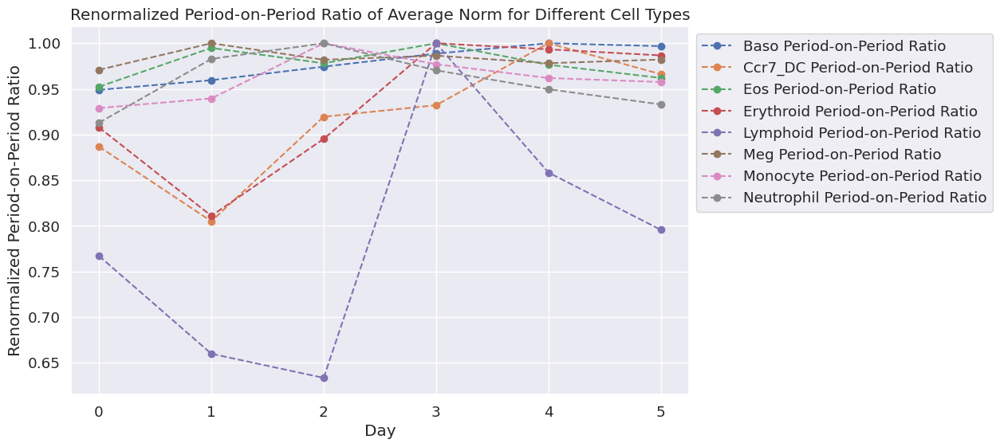

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


velocity_data = inf_adata.obsm['dl']
unique_cell_types = np.unique(inf_adata.obs['differentiation_destination'])
unique_cell_types = unique_cell_types[unique_cell_types != 'Undifferentiated']
cell_type_data_dict = {}

for cell_type in unique_cell_types:
    cell_type_mask = inf_adata.obs['differentiation_destination'] == cell_type
    cell_type_data = velocity_data[cell_type_mask]
    unique_time_points = np.unique(inf_adata.obs['Day'])
    unique_time_points = unique_time_points[unique_time_points >= 0]
    unique_time_points = unique_time_points[unique_time_points != np.max(unique_time_points)]
    time_points_list = []
    period_ratios_list = []
    sorted_time_points = np.sort(unique_time_points)

    for i in range(len(sorted_time_points)):
        current_time_point = sorted_time_points[i]

        if i == 0:
            period_ratio = 1.0
        else:
            previous_time_point = sorted_time_points[i - 1]
            current_time_mask = (inf_adata.obs['Day'] == current_time_point) & cell_type_mask
            previous_time_mask = (inf_adata.obs['Day'] == previous_time_point) & cell_type_mask

            current_time_data = velocity_data[current_time_mask]
            previous_time_data = velocity_data[previous_time_mask]
            current_norms = np.linalg.norm(current_time_data, axis=1)
            previous_norms = np.linalg.norm(previous_time_data, axis=1)
            current_average_norm = np.mean(current_norms)
            previous_average_norm = np.mean(previous_norms)
            period_ratio = current_average_norm / previous_average_norm

        time_points_list.append(int(current_time_point))
        period_ratios_list.append(period_ratio)

    max_ratio = max(period_ratios_list)
    min_ratio = 0
    normalized_ratios = [(x - min_ratio) / (max_ratio - min_ratio) for x in period_ratios_list]
    cell_type_data_dict[cell_type] = (time_points_list, normalized_ratios)

plt.figure(figsize=(10, 6), facecolor='white')

for cell_type, (time_points, normalized_ratios) in cell_type_data_dict.items():
    plt.plot(time_points, normalized_ratios, label=f'{cell_type} Period-on-Period Ratio', marker='o', linestyle='--')

plt.xlabel('Day')
plt.ylabel('Renormalized Period-on-Period Ratio')
plt.title('Renormalized Period-on-Period Ratio of Average Norm for Different Cell Types')
plt.grid(True)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(np.arange(min(sorted_time_points), max(sorted_time_points)+1, 1))
plt.show()


In [ ]:
import pandas as pd

cell_type_counts = inf_adata.obs['differentiation_destination'].value_counts()
filtered_cell_types = cell_type_counts[cell_type_counts >= 40]

print(filtered_cell_types)


Undifferentiated    2124
Neutrophil          1782
Monocyte            1404
Baso                 162
Erythroid             45
Name: differentiation_destination, dtype: int64


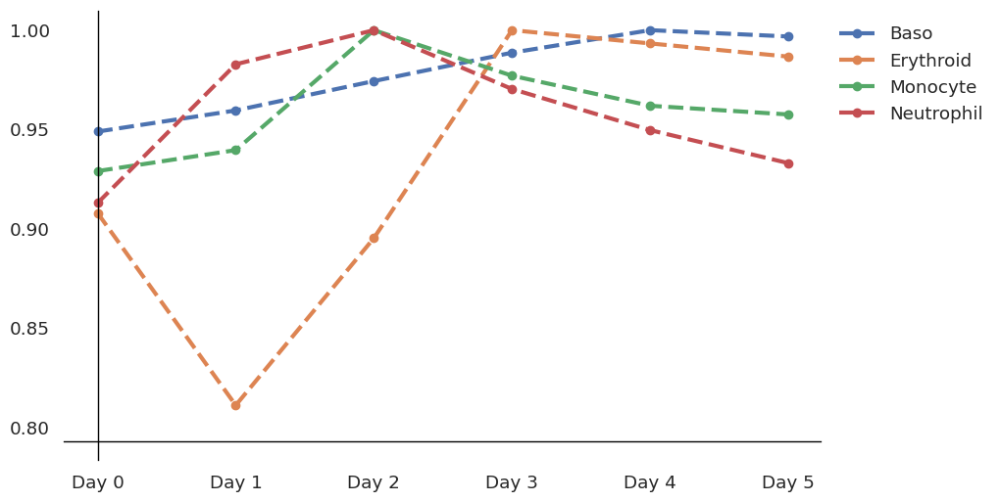

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

velocity_data = inf_adata.obsm['dl']

cell_type_counts = inf_adata.obs['differentiation_destination'].value_counts()
cell_types_to_keep = cell_type_counts[cell_type_counts >= 40].index
unique_cell_types = np.unique(inf_adata[inf_adata.obs['differentiation_destination'].isin(cell_types_to_keep)].obs['differentiation_destination'])
unique_cell_types = unique_cell_types[unique_cell_types != 'Undifferentiated']
cell_type_data_dict = {}

for cell_type in unique_cell_types:
    cell_type_mask = inf_adata.obs['differentiation_destination'] == cell_type
    cell_type_data = velocity_data[cell_type_mask]
    unique_time_points = np.unique(inf_adata.obs['Day'])
    unique_time_points = unique_time_points[unique_time_points >= 0]
    unique_time_points = unique_time_points[unique_time_points != np.max(unique_time_points)]
    time_points_list = []
    period_ratios_list = []
    sorted_time_points = np.sort(unique_time_points)


    for i in range(len(sorted_time_points)):
        current_time_point = sorted_time_points[i]

        if i == 0:
            period_ratio = 1.0
        else:
            previous_time_point = sorted_time_points[i - 1]
            current_time_mask = (inf_adata.obs['Day'] == current_time_point) & cell_type_mask
            previous_time_mask = (inf_adata.obs['Day'] == previous_time_point) & cell_type_mask

            current_time_data = velocity_data[current_time_mask]
            previous_time_data = velocity_data[previous_time_mask]
            current_norms = np.linalg.norm(current_time_data, axis=1)
            previous_norms = np.linalg.norm(previous_time_data, axis=1)
            current_average_norm = np.mean(current_norms)
            previous_average_norm = np.mean(previous_norms)
            period_ratio = current_average_norm / previous_average_norm

        time_points_list.append(int(current_time_point))
        period_ratios_list.append(period_ratio)


    max_ratio = max(period_ratios_list)
    min_ratio = 0
    normalized_ratios = [(x - min_ratio) / (max_ratio - min_ratio) for x in period_ratios_list]

    cell_type_data_dict[cell_type] = (time_points_list, normalized_ratios)


fig, ax = plt.subplots(figsize=(10, 6))
ax.set_facecolor('white')

for cell_type, (time_points, normalized_ratios) in cell_type_data_dict.items():
    if cell_type == "Baso":
        ax.plot(time_points, normalized_ratios, label=f'{cell_type}', marker='o', linestyle='--', linewidth=3)
    elif cell_type == "Monocyte":
        ax.plot(time_points, normalized_ratios, label=f'{cell_type}', marker='o', linestyle='--', linewidth=3)
    else:
        ax.plot(time_points, normalized_ratios, label=f'{cell_type}', marker='o', linestyle='--', linewidth=3)


x_axis_offset = min(sorted_time_points)
ax.set_xticks(np.arange(min(sorted_time_points), max(sorted_time_points) + 1, 1) - x_axis_offset)
ax.set_xticklabels([f'Day {int(day - x_axis_offset)}' for day in np.arange(min(sorted_time_points), max(sorted_time_points) + 1, 1)])
ax.grid(True)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False, facecolor='white')
ax.axhline(min(normalized_ratios) - 0.12, color='black', linewidth=1)
ax.axvline(min(sorted_time_points) - x_axis_offset, color='black', linewidth=1)
plt.show()

In [ ]:
import numpy as np
delta_adata = inf_adata[inf_adata.obs['reconst'] == 1][:,list(set(TGs)|set(TFs))]
delta_adata = delta_adata[delta_adata.obs['initial'] == 6]
#delta_adata = delta_adata[delta_adata.obs['reconst'] == 1]
days = np.unique(delta_adata.obs['Day'])
days = days[days >= 0]
#days = days[days != np.max(days)]
delta = np.empty((0, len(np.unique(delta_adata.var_names))))
for i in range(np.max(days)):
    delta_i = delta_adata[delta_adata.obs['Day'] == i+1].X.toarray() - delta_adata[delta_adata.obs['Day'] == i].X.toarray()
    delta = np.vstack((delta, delta_i))
mask = (delta_adata.obs['Day'] >= 0) & (delta_adata.obs['Day'] <= 5)
selected_cells = delta_adata[mask]
delta_matrix = pd.DataFrame(delta, index=selected_cells.obs_names, columns=selected_cells.var_names)
delta_matrix = delta_matrix.abs()

## Define activity and calculate the changes in the time series

In [ ]:
import pandas as pd

average_activation_matrix = pd.DataFrame(index=range(len(selected_cells.obs)), columns=TFs)

for row_index, i in enumerate(selected_cells.obs.index):
    for tf in TFs:
        TGs = regulation_matrix.loc[tf][regulation_matrix.loc[tf] == 1].index
        average_activation = delta_matrix.iloc[row_index][TGs].mean()
        average_activation_matrix.at[row_index, tf] = average_activation
average_activation_matrix.index = selected_cells.obs_names
mask = (tf_adata.obs['Day'] >= 0) & (tf_adata.obs['Day'] <= 5)
tf_adata = tf_adata[mask]

day_cell_df = tf_adata.obs[['Day', 'CellID', 'differentiation_destination']]

average_activation_matrix = pd.concat([average_activation_matrix, day_cell_df], axis=1)
tf_adata.obsm['Average_TF_activation'] = average_activation_matrix

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages



def tf_average_activation_series(tf_adata, lineages, mode, start_day=0, end_day=5):

    tfs = tf_adata.obsm['Average_TF_activation'].columns
    columns_to_remove = ['Day', 'CellID', 'differentiation_destination']
    tfs = [column for column in tfs if column not in columns_to_remove]
    pdf = PdfPages('graphs.pdf')

    if mode == 'lineage':
        lineages = np.unique(tf_adata.obs['Lineage'])
        for lineage in lineages:

            for tf in tfs:
                lineage_tf_data = tf_adata.obsm['Average_TF_activation'][(tf_adata.obs['Lineage'] == lineage)][tf]
                day_data = tf_adata.obs['Day'][(tf_adata.obs['Lineage'] == lineage)]
                mean_activations = []
                std_activations = []
                for day in range(start_day, end_day + 1):
                    day_indices = np.where(day_data == day)[0]
                    day_tf_data = lineage_tf_data[day_indices]

                    mean_activation = np.mean(day_tf_data)
                    std_activation = np.std(day_tf_data)

                    mean_activations.append(mean_activation)
                    std_activations.append(std_activation)

                x = np.arange(start_day, end_day + 1)
                width = 0.35

                fig, ax = plt.subplots()
                bars = ax.bar(x, mean_activations, width, yerr=std_activations)

                ax.set_xlabel('Day')
                ax.set_ylabel('Activation')
                ax.set_title(f"Mean Activation and Standard Deviation for Lineage {lineage}, TF: {tf}")
                ax.set_xticks(x)
                ax.legend([bars], ['Mean Activation'], loc='upper left', bbox_to_anchor=(1, 1))

                plt.show()
                pdf.savefig(fig)


    elif mode == 'destination':
        destinations = np.unique(tf_adata.obs['differentiation_destination'])
        for destination in destinations:

            for tf in tfs:
                lineage_tf_data = tf_adata.obsm['Average_TF_activation'][(tf_adata.obs['differentiation_destination'] == destination)][tf]
                lineage_tf_data = lineage_tf_data.fillna(0)
                day_data = tf_adata.obs['Day'][(tf_adata.obs['differentiation_destination'] == destination)]
                mean_activations = []
                std_activations = []
                for day in range(start_day, end_day + 1):
                    day_indices = np.where(day_data == day)[0]
                    day_tf_data = lineage_tf_data[day_indices]

                    mean_activation = np.mean(day_tf_data)
                    std_activation = np.std(day_tf_data)

                    mean_activations.append(mean_activation)
                    std_activations.append(std_activation)

                x = np.arange(start_day, end_day + 1)
                width = 0.35

                fig, ax = plt.subplots()
                bars = ax.bar(x, mean_activations, width, yerr=std_activations)

                ax.set_xlabel('Day')
                ax.set_ylabel('Activation')
                ax.set_title(f"Mean Activation and Standard Deviation for Lineage {destination}, TF: {tf}")
                ax.set_xticks(x)
                ax.legend([bars], ['Mean Activation'], loc='upper left', bbox_to_anchor=(1, 1))

                plt.show()
                pdf.savefig(fig)
    else:
        print("Invalid mode. Please choose 'lineage' or 'main'.")


    pdf.close()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


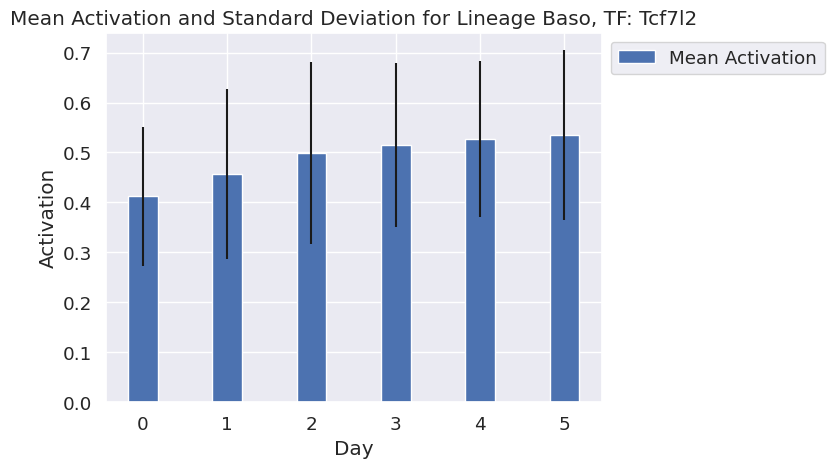

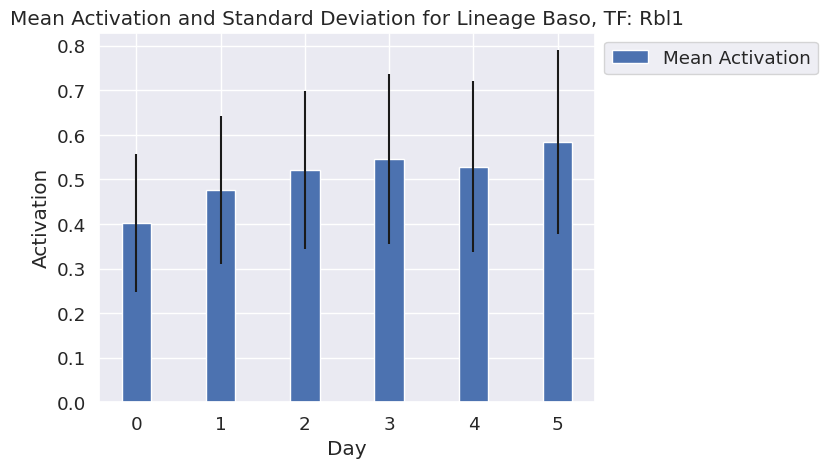

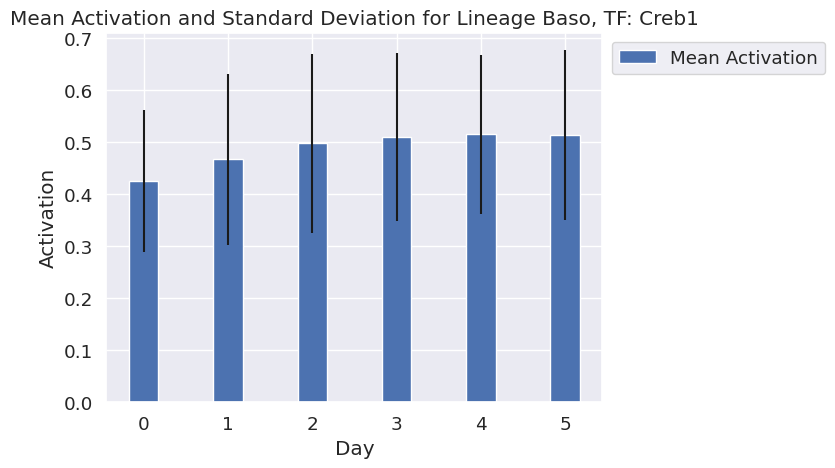

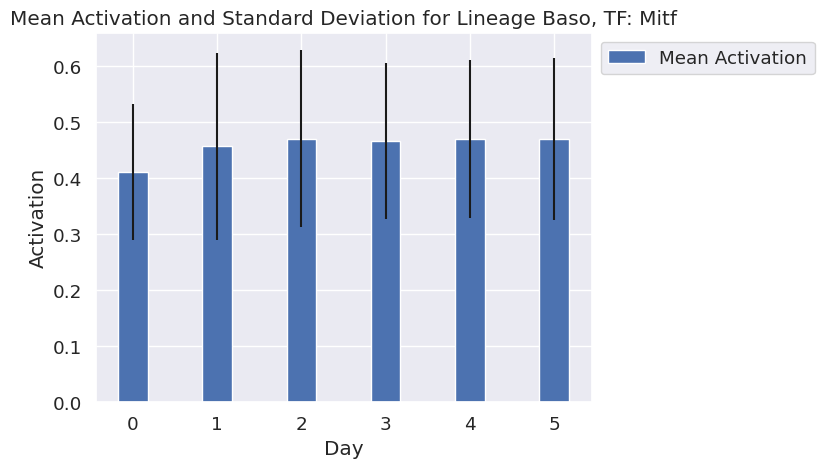

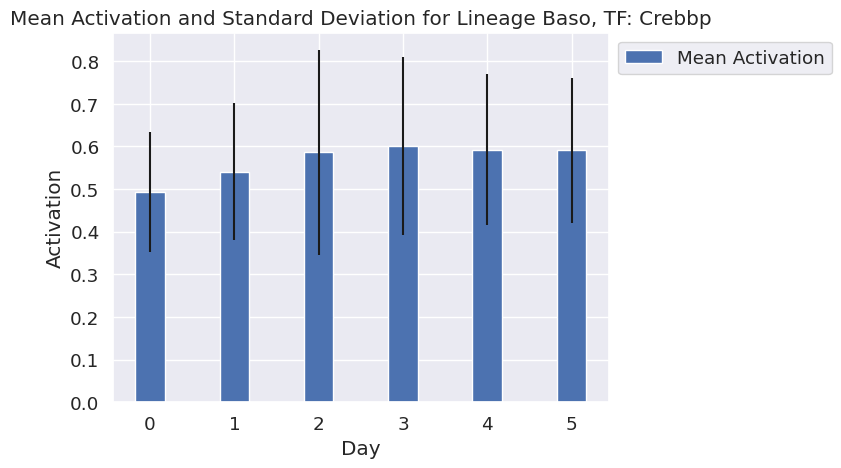

...

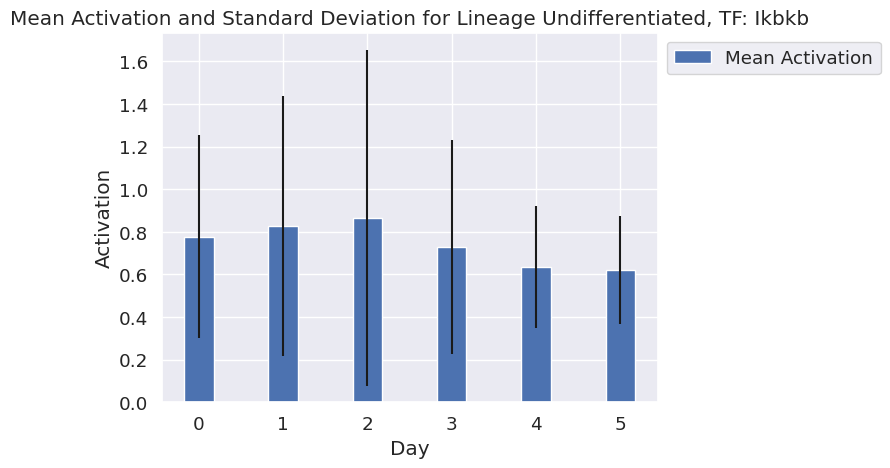

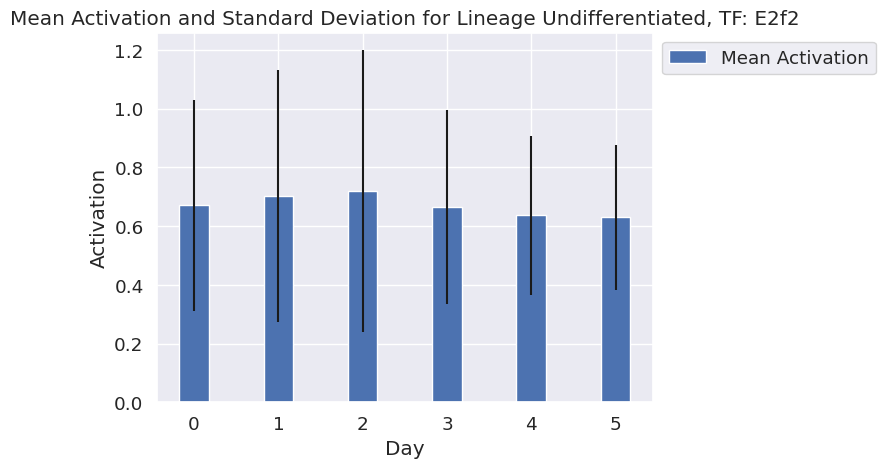

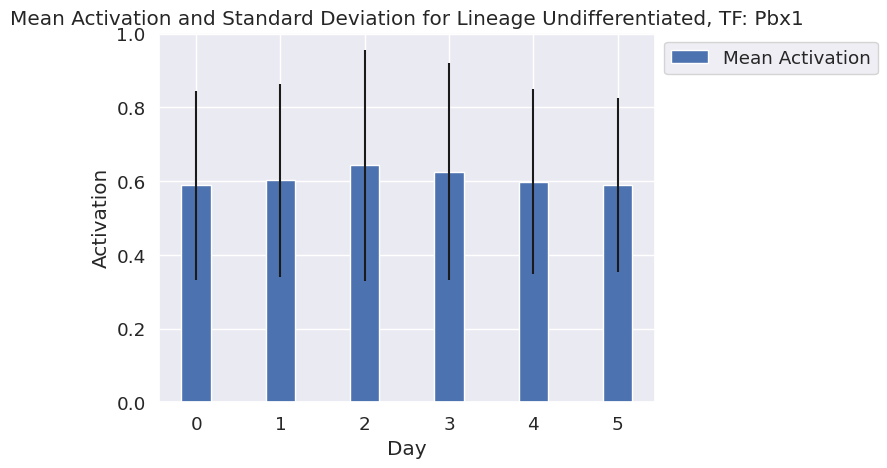

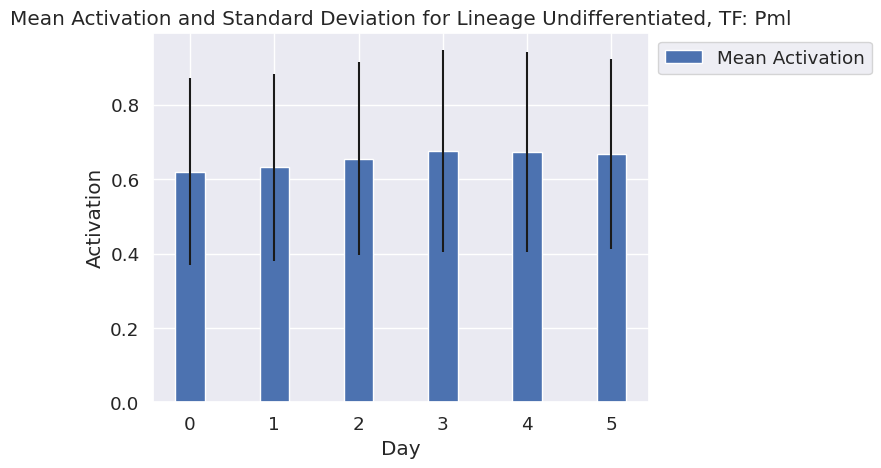

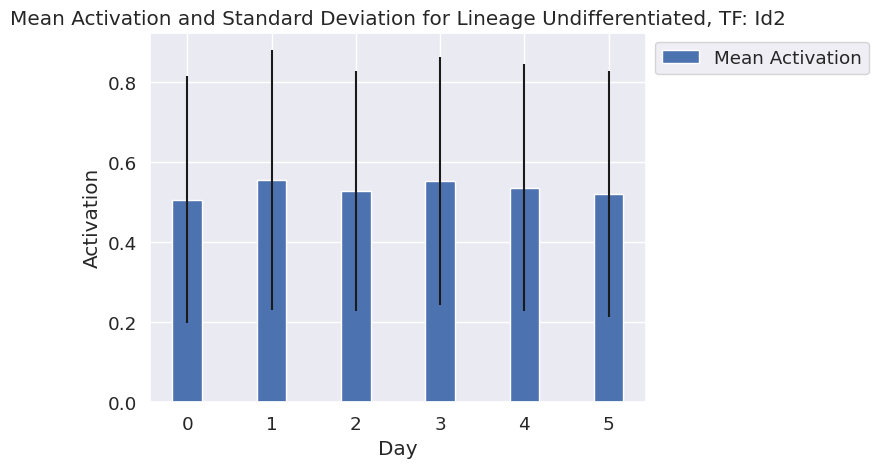

In [ ]:
lineages = np.unique(tf_adata.obs['Lineage'])
tf_average_activation_series(tf_adata, lineages, mode='destination', start_day=0, end_day=5)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


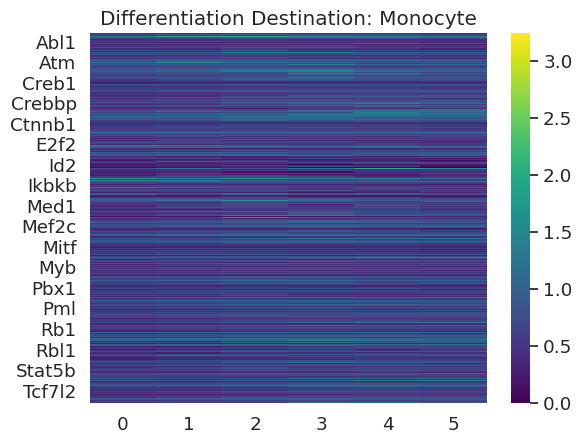

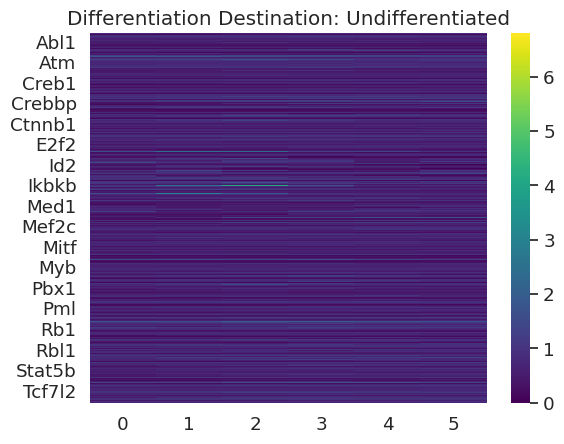

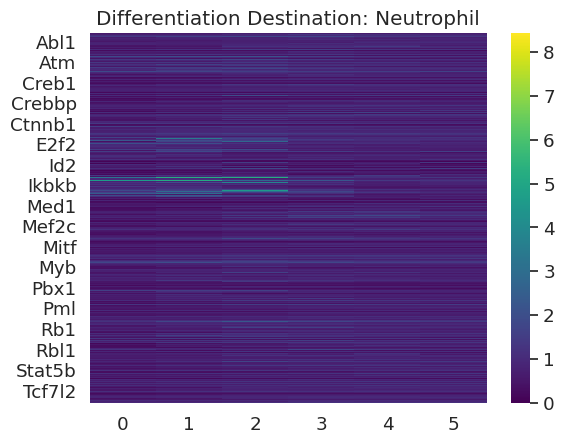

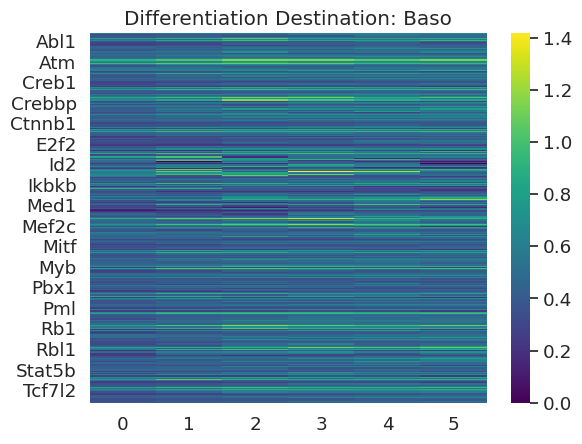

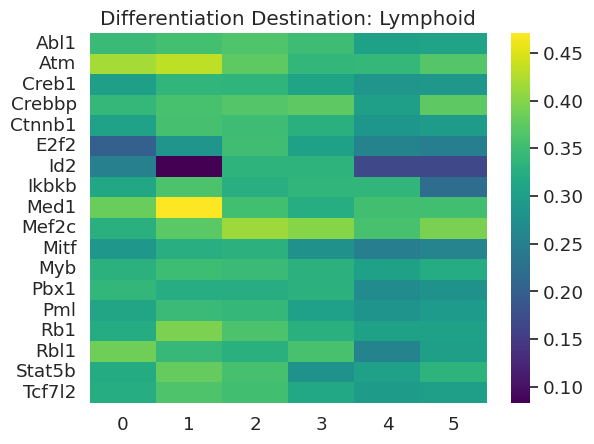

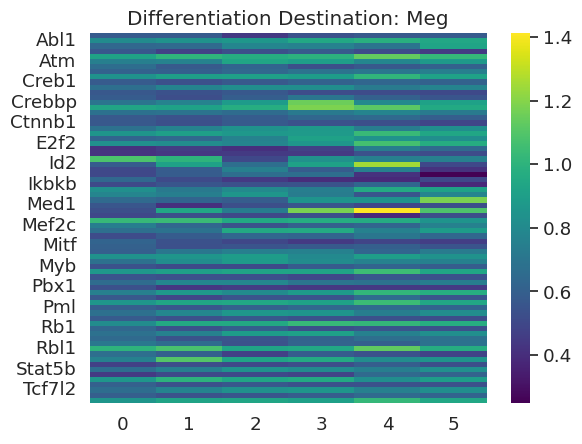

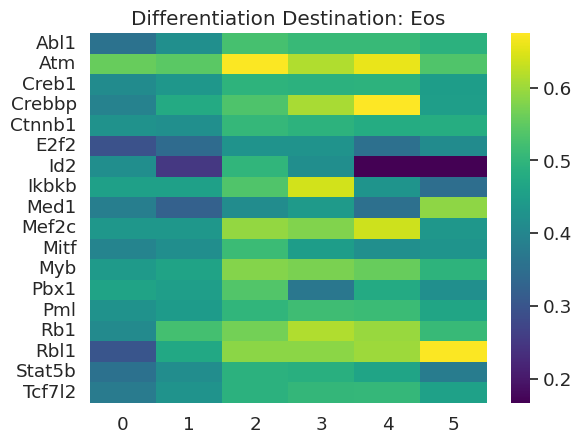

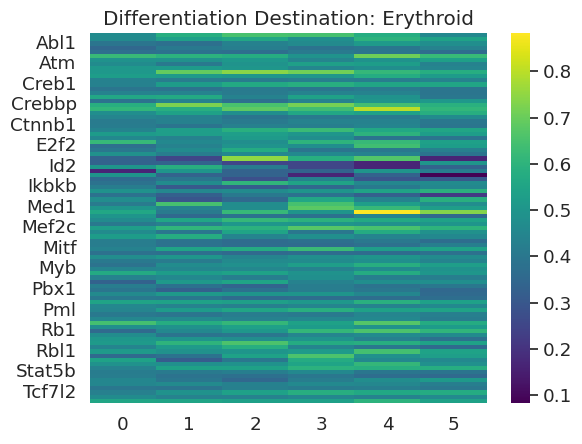

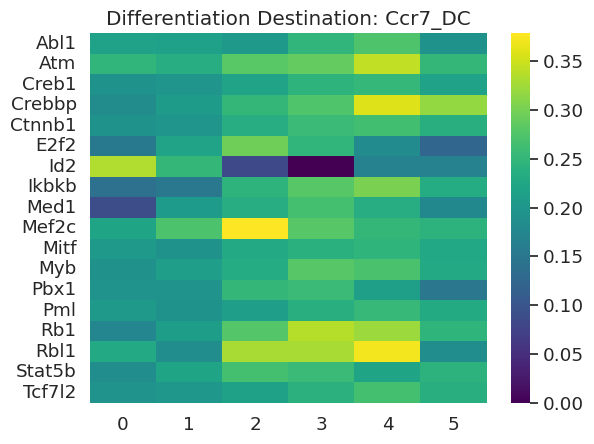

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

destinations = tf_adata.obs['differentiation_destination'].unique()

for destination in destinations:
    tf_activation_matrix = tf_adata.obsm['Average_TF_activation'][tf_adata.obs['differentiation_destination'] == destination][TFs + ['CellID'] + ['Day']]
    tf_activation_matrix.sort_values(by='Day', inplace=True)
    tf_activation_matrix = tf_activation_matrix.pivot(index='Day', columns='CellID').T

    tf_activation_matrix.to_csv('tf_activation_matrix.csv')
    file_path = 'tf_activation_matrix.csv'
    data = pd.read_csv(file_path)

    tfs = tf_adata.obsm['Average_TF_activation'].columns
    columns_to_remove = ['Day', 'CellID', 'differentiation_destination']
    tfs = [column for column in tfs if column not in columns_to_remove]

    filtered_data = data[data['Unnamed: 0'].isin(tfs)].sort_values(by='Unnamed: 0')
    filtered_data = filtered_data.dropna()
    yticklabels = [''] * len(filtered_data)
    current_tf = None
    start_idx = 0
    for idx, tf in enumerate(filtered_data['Unnamed: 0']):
        if tf != current_tf:
            if current_tf is not None:
                middle_idx = (start_idx + idx - 1) // 2
                yticklabels[middle_idx] = current_tf
            current_tf = tf
            start_idx = idx
    middle_idx = (start_idx + len(yticklabels) - 1) // 2
    yticklabels[middle_idx] = current_tf
    heatmap_data = filtered_data.drop(columns=['Unnamed: 0', 'CellID'])

    plt.figure()
    plt.title(f'Differentiation Destination: {destination}')
    sns.heatmap(heatmap_data, cmap='viridis', yticklabels=yticklabels)

    plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


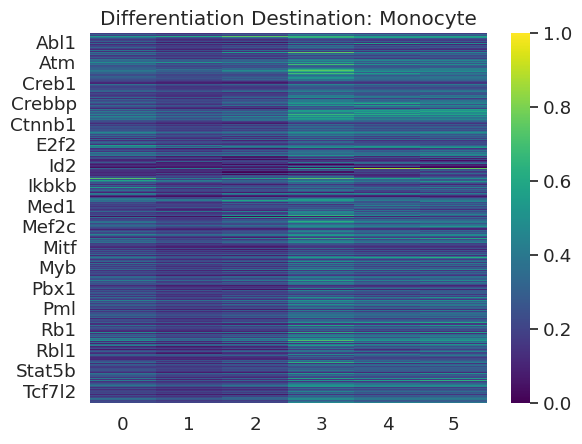

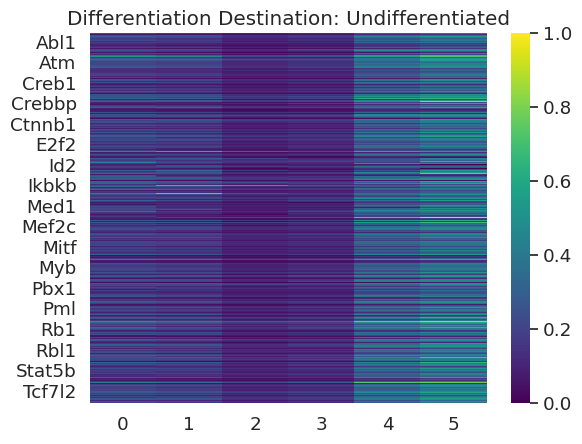

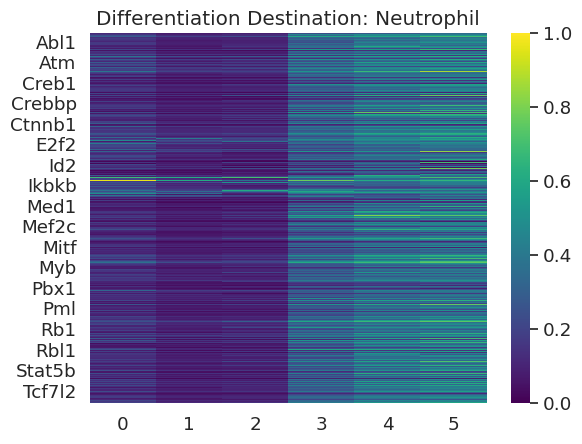

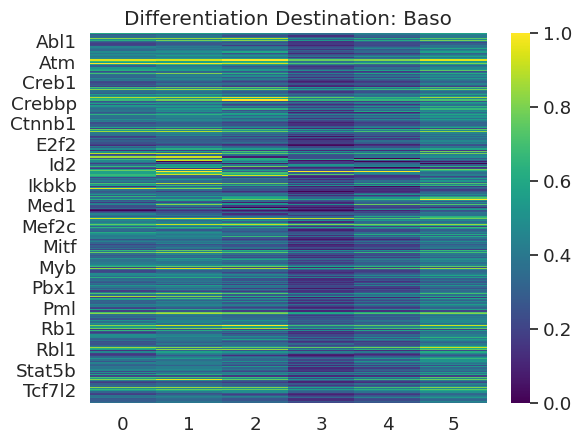

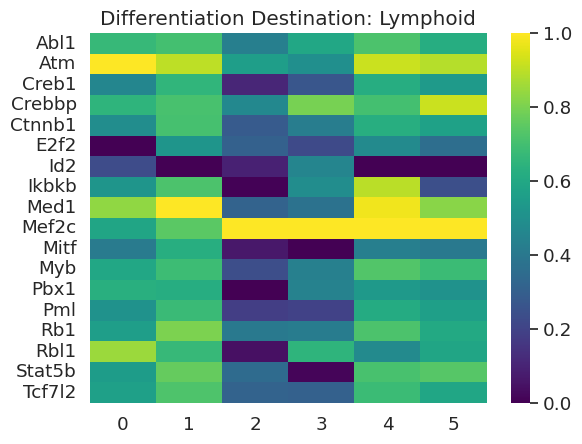

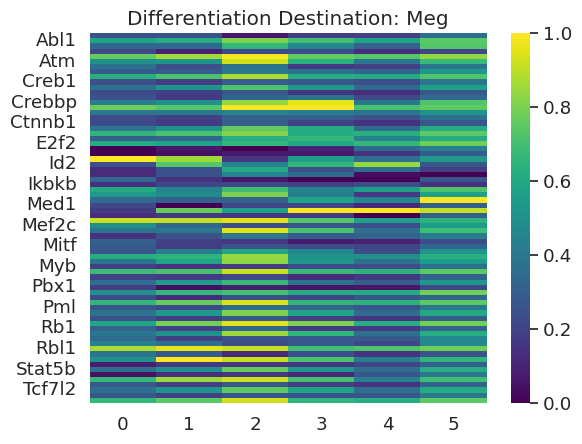

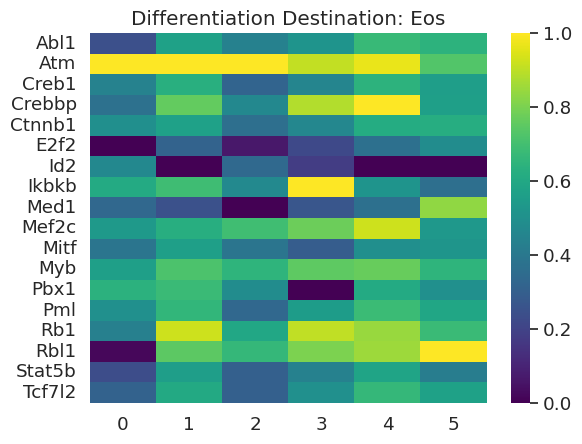

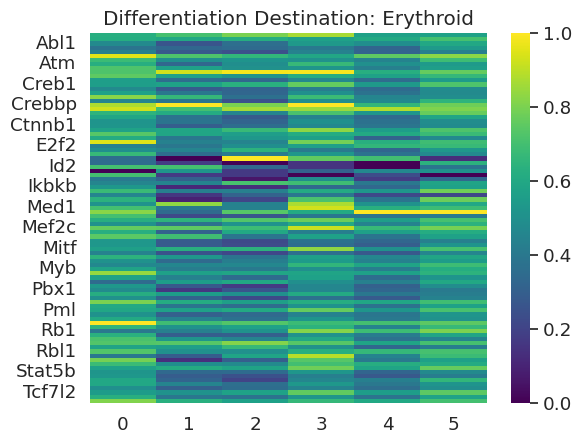

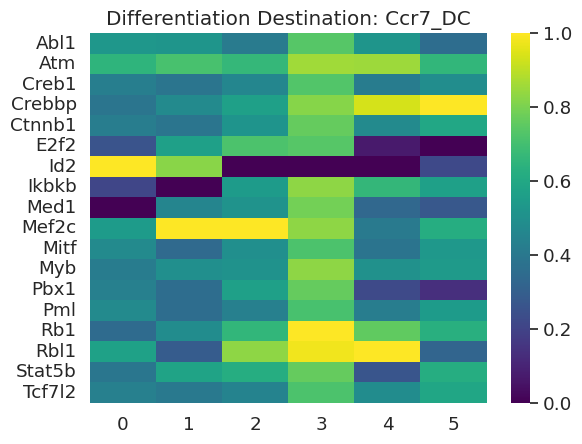

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

destinations = tf_adata.obs['differentiation_destination'].unique()
scaler = MinMaxScaler()

for destination in destinations:
    tf_activation_matrix = tf_adata.obsm['Average_TF_activation'][tf_adata.obs['differentiation_destination'] == destination][TFs + ['CellID'] + ['Day']]
    tf_activation_matrix.sort_values(by='Day', inplace=True)
    tf_activation_matrix = tf_activation_matrix.pivot(index='Day', columns='CellID').T

    # Load the data
    tf_activation_matrix.to_csv('tf_activation_matrix.csv')
    file_path = 'tf_activation_matrix.csv'
    data = pd.read_csv(file_path)

    #tfs = ['Pparg', 'Tcf7l2', 'Pml', 'Myb', 'Atm', 'Mef2c', 'Id2']
    tfs = tf_adata.obsm['Average_TF_activation'].columns
    columns_to_remove = ['Day', 'CellID', 'differentiation_destination']
    tfs = [column for column in tfs if column not in columns_to_remove]
    filtered_data = data[data['Unnamed: 0'].isin(tfs)].sort_values(by='Unnamed: 0')
    filtered_data = filtered_data.dropna()
    yticklabels = [''] * len(filtered_data)
    current_tf = None
    start_idx = 0
    for idx, tf in enumerate(filtered_data['Unnamed: 0']):
        if tf != current_tf:
            if current_tf is not None:
                middle_idx = (start_idx + idx - 1) // 2
                yticklabels[middle_idx] = current_tf
            current_tf = tf
            start_idx = idx
    middle_idx = (start_idx + len(yticklabels) - 1) // 2
    yticklabels[middle_idx] = current_tf
    heatmap_data = filtered_data.drop(columns=['Unnamed: 0', 'CellID'])
    heatmap_data.dropna()
    heatmap_data_normalized = pd.DataFrame(scaler.fit_transform(heatmap_data), columns=heatmap_data.columns, index=heatmap_data.index)


    plt.figure()
    plt.title(f'Differentiation Destination: {destination}')
    sns.heatmap(heatmap_data_normalized, cmap='viridis', yticklabels=yticklabels)
    plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


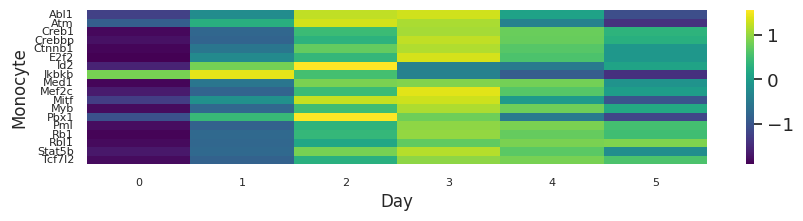

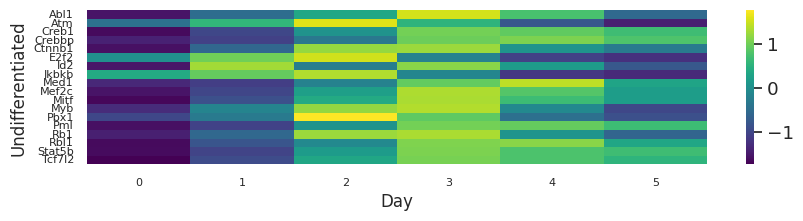

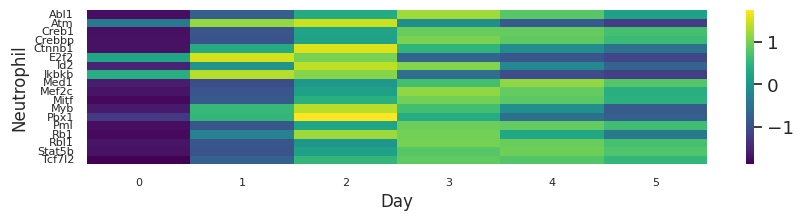

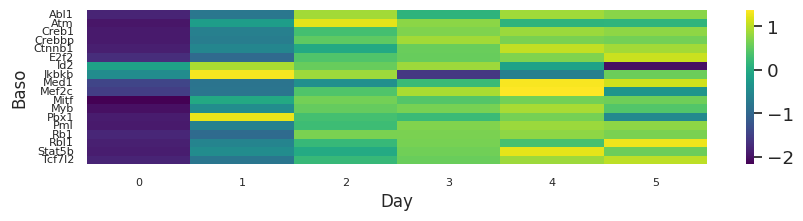

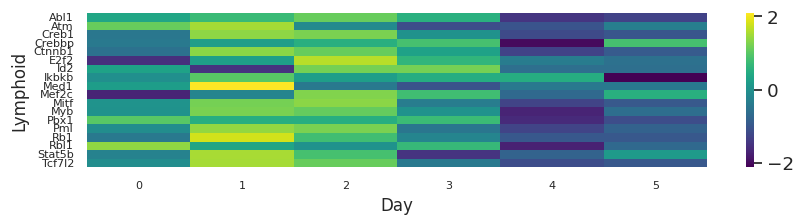

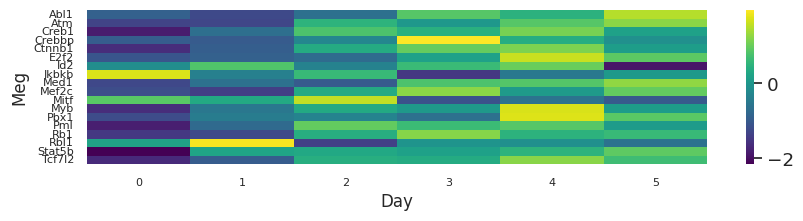

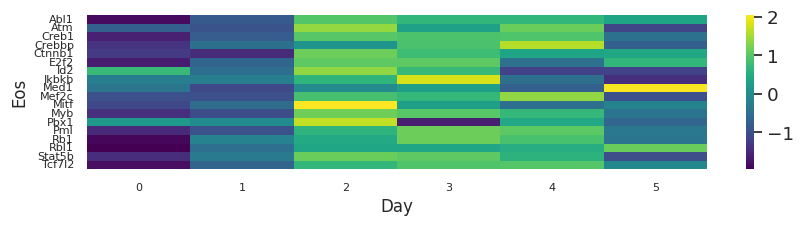

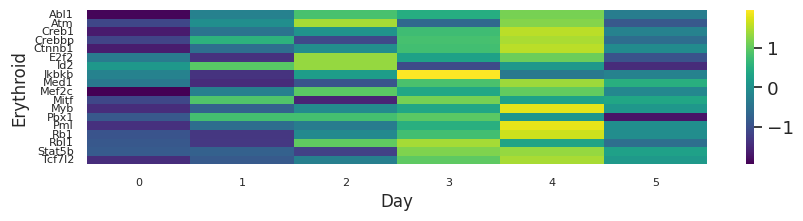

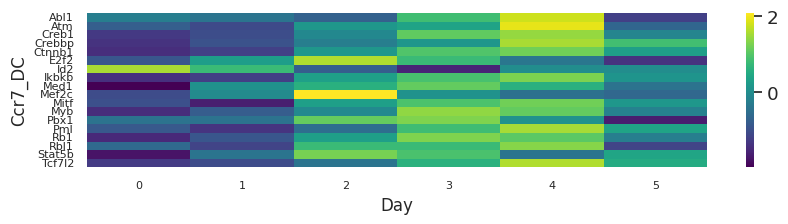

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

destinations = tf_adata.obs['differentiation_destination'].unique()

scaler = MinMaxScaler()

label_fontsize = 12
tick_fontsize = 8
title_fontsize = 12

for destination in destinations:
    tf_activation_matrix = tf_adata.obsm['Average_TF_activation'][tf_adata.obs['differentiation_destination'] == destination][TFs + ['CellID'] + ['Day']]
    tf_activation_matrix.sort_values(by='Day', inplace=True)
    tf_activation_matrix = tf_activation_matrix.pivot(index='Day', columns='CellID').T.dropna()
    tf_activation_matrix.to_csv('tf_activation_matrix.csv')
    tf_data = pd.read_csv('tf_activation_matrix.csv')

    tf_average_values = tf_data.groupby('Unnamed: 0').mean()
    tf_average_values = tf_average_values.drop(columns='CellID', errors='ignore')
    tf_average_values.reset_index(inplace=True)

    plt.figure(figsize=(10, 2))

    normalize = True

    if normalize:
        scaler = StandardScaler()
        normalized_values = tf_average_values.copy()
        normalized_values.iloc[:, 1:] = scaler.fit_transform(tf_average_values.iloc[:, 1:].T).T
        ax = sns.heatmap(normalized_values.set_index('Unnamed: 0'), cmap='viridis', xticklabels=1, yticklabels=1)
    else:
        ax = sns.heatmap(tf_average_values.set_index('Unnamed: 0'), cmap='viridis', xticklabels=1, yticklabels=1)

    plt.xlabel('Day', fontsize=label_fontsize)
    plt.ylabel(f'{destination}', fontsize=label_fontsize)
    ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
    plt.show()

## Poisson regression

$$\text{E}[\textbf{X}_\text{t+1}^\text{(TG)}] = \textbf{X}_\text{t}^\text{(TF)} \textbf{W}_\text{t} + \textbf{β},$$


$$
\text{weights } w_{tij} \text{is learnable parameter (}
w_{tij} = 0  \text{,  if  } r_{ij} = 0 \text{)}
$$




In [ ]:
from sklearn import linear_model

def tf_activity_regression(inf_adata, regulation_matrix, tf_expression_df, tg_matrix):

    num_days = num_days = inf_adata.obs['Day'].max() #-1
    n, m = regulation_matrix.shape
    W = np.zeros((n, m*num_days))
    beta = np.zeros((m, num_days))

    for t in range(num_days):
        for i in range(m):
            id = regulation_matrix.index.values[regulation_matrix[tg_matrix.columns[i]]>0.5]
            if id.size > 0:
                clf = linear_model.PoissonRegressor(alpha=0) # This regressor uses the ‘log’ link function.
                clf.fit(np.log(tf_expression_df[id].iloc[(t*len(inf_adata[inf_adata.obs['Day'] == 0])):((t+1)*len(inf_adata[inf_adata.obs['Day'] == 0])),:]+1), tg_matrix[tg_matrix.columns[i]].iloc[((t+1)*len(inf_adata[inf_adata.obs['Day'] == 0])):((t+2)*len(inf_adata[inf_adata.obs['Day'] == 0]))])
                f = regulation_matrix[tg_matrix.columns[i]]>=1
                W[f,i+t*m] = clf.coef_
                beta[i,t] = clf.intercept_

    return num_days, n, m, W, beta

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import datetime
from google.colab import files


#ave_inf_adata = inf_adata[inf_adata.obs['differentiation_destination'] == 'Monocyte']
#ave_inf_adata = ave_inf_adata[ave_inf_adata.obs['reconst'] == 1]
#ave_inf_adata = ave_inf_adata[ave_inf_adata.obs['Day']>=0]
#num_days, n, m, W, beta = tf_activity_regression(inf_adata, regulation_matrix, tf_expression_df, tg_matrix)

cell_type = 'Monocyte'
ave_inf_adata = average_inf_adata[average_inf_adata.obs['differentiation_destination'] == cell_type]
ave_inf_adata = ave_inf_adata[ave_inf_adata.obs['reconst'] == 1]
ave_inf_adata = ave_inf_adata[ave_inf_adata.obs['Day']>=0]
_, ave_tf_expression_df, ave_tg_matrix = process_tf_data(tf_target, ave_inf_adata)
num_days, n, m, W, beta = tf_activity_regression(ave_inf_adata, regulation_matrix, ave_tf_expression_df, ave_tg_matrix)

# Save weightsimport datetime
dt_now = datetime.datetime.now().strftime('%Y%m%d%H%M')
np.savetxt(dt_now + '_coef.csv', W, delimiter=',')
files.download(dt_now + '_coef.csv')
np.savetxt(dt_now + '_intercept.csv', beta, delimiter=',')
files.download(dt_now + '_intercept.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def tfactivity_glm(cell_type, average_inf_adata, tf_target, regulation_matrix):
    # Filter data for the specific cell type
    cell_type_data = average_inf_adata[average_inf_adata.obs['differentiation_destination'] == cell_type]
    cell_type_data = cell_type_data[cell_type_data.obs['reconst'] == 1]
    cell_type_data = cell_type_data[cell_type_data.obs['Day'] >= 0]

    _, ave_tf_expression_df, ave_tg_matrix = process_tf_data(tf_target, cell_type_data)
    num_days, n, m, W, beta = tf_activity_regression(cell_type_data, regulation_matrix, ave_tf_expression_df, ave_tg_matrix)
    sums_per_day = [0] * num_days
    for day in range(num_days):
        start_index = day * m
        end_index = (day + 1) * m
        day_values = W[:, start_index:end_index]
        abs_sum_per_row = np.sum(np.abs(day_values), axis=1)
        sums_per_day[day] = abs_sum_per_row


    data = np.array(sums_per_day).T
    scaled_data = data / data.max()
    tf_names = regulation_matrix.index

    filtered_data = scaled_data
    filtered_tf_names = np.array(tf_names)

    plt.figure(figsize=(num_days, len(filtered_tf_names) / 3))
    heatmap = sns.heatmap(filtered_data, annot=True, fmt='.2f', cmap='viridis', cbar=True, linewidths=0.5)
    heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=8)

    plt.title(f'Heatmap of the TF activity for {cell_type}')
    plt.xlabel('Time point')
    plt.ylabel('TFs')
    plt.xticks(np.arange(num_days) + 0.5, [f'Day {i}' for i in range(num_days)])

    plt.yticks(np.arange(len(filtered_tf_names)) + 0.5, filtered_tf_names)

    plt.show()
    plt.close()
    return(filtered_data, filtered_tf_names)



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def create_heatmap_with_annotations(scaled_data, filtered_tf_names, regulation_matrix, cell_type=None):
    num_days = scaled_data.shape[1]
    tf_names = filtered_tf_names #regulation_matrix.index

    annotation_df = scaled_data.copy()
    percentile_10 = np.percentile(scaled_data, 10)
    percentile_90 = np.percentile(scaled_data, 90)
    percentile_95 = np.percentile(scaled_data, 95)

    top_5_percent = scaled_data > percentile_95
    scaled_data[top_5_percent] = percentile_95

    plt.figure(figsize=(num_days, len(tf_names) / 3))
    heatmap = sns.heatmap(scaled_data, cmap='viridis', cbar=True, linewidths=0.5)
    heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=8)
    if cell_type:
        plt.title(f'Heatmap of the TF activity for {cell_type}')
    else:
        plt.title('Heatmap of the TF activity')
    plt.xlabel('Time point', fontsize=10)
    plt.ylabel('TFs', fontsize=10)

    plt.xticks(np.arange(num_days) + 0.5, [f'Day {i}' for i in range(num_days)], fontsize=8)
    plt.yticks(np.arange(len(tf_names)) + 0.5, tf_names, fontsize=8)

    annotation_df = pd.DataFrame(annotation_df)

    for y in range(annotation_df.shape[0]):
        for x in range(annotation_df.shape[1]):
            value = annotation_df.iloc[y, x]
            if value > percentile_90:
                text_color = 'black'
            elif value <= percentile_10:
                text_color = 'white'
            else:
                text_color = 'white'

            plt.text(x + 0.5, y + 0.5, f'{value:.2f}', color=text_color,
                     ha='center', va='center', fontsize=8)

    plt.show()
    plt.close()

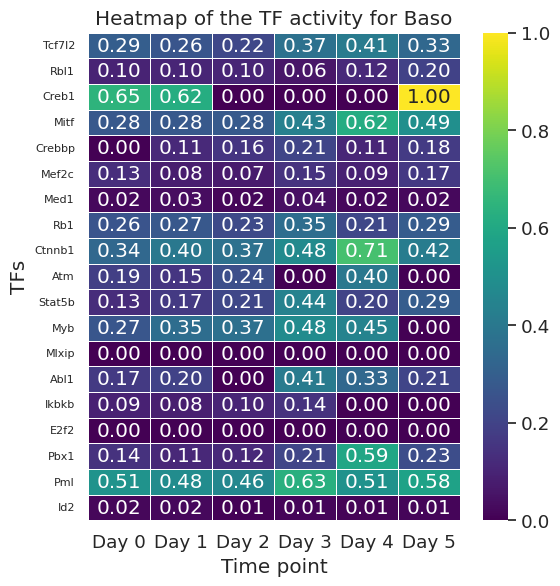

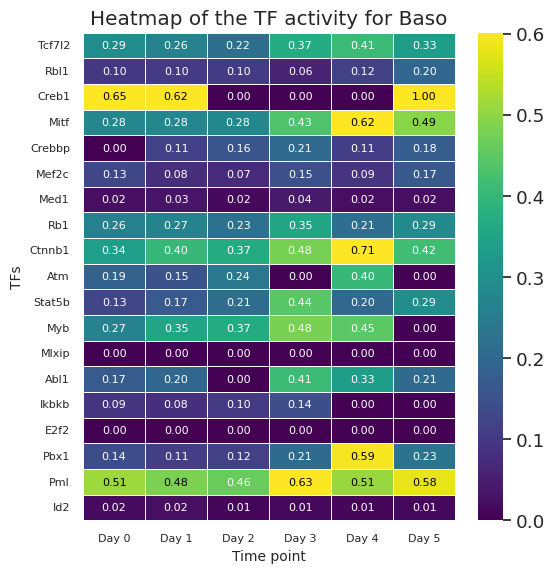

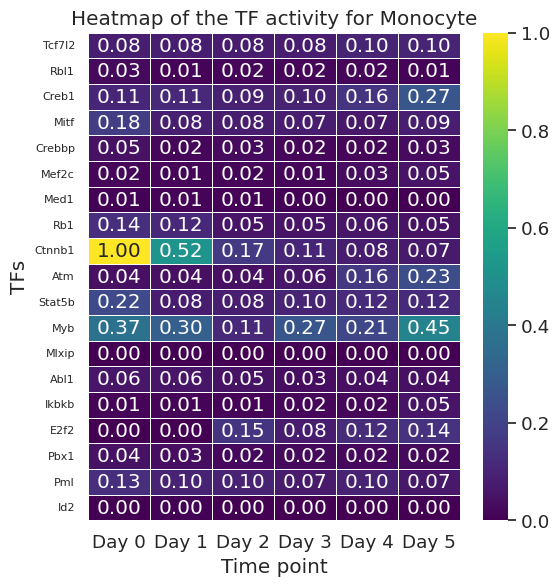

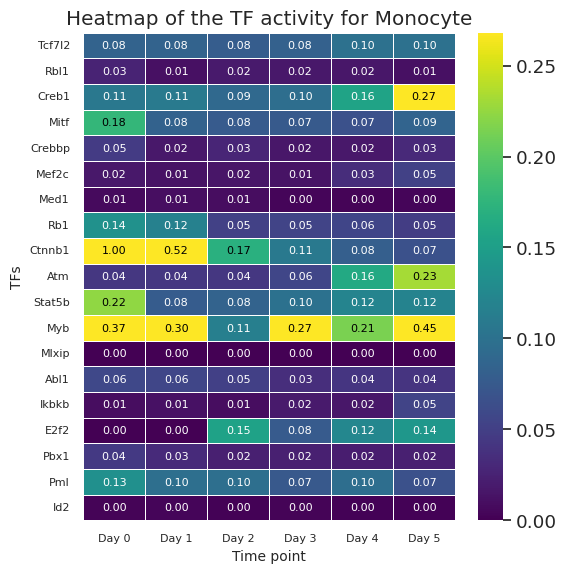

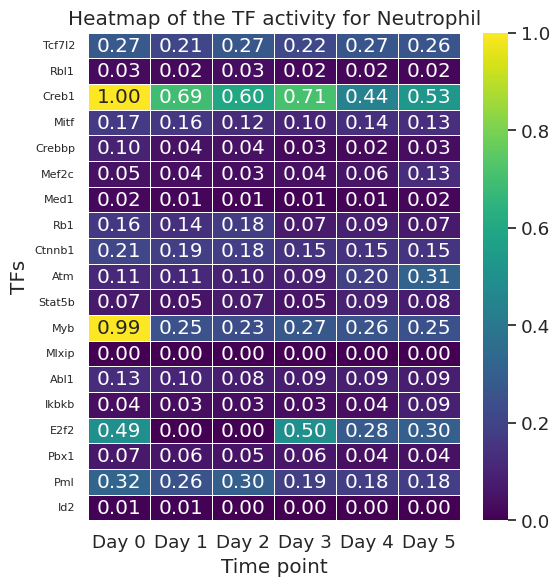

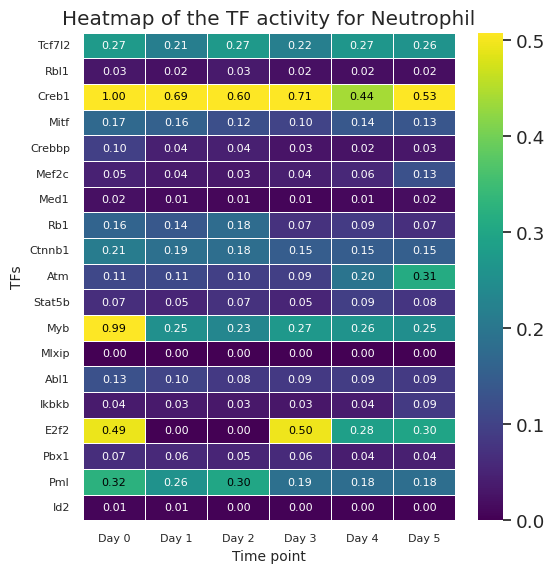

In [ ]:
cell_types_to_plot = ['Baso', 'Monocyte', 'Neutrophil']

filtered_data_list = []
for cell_type in cell_types_to_plot:
    filtered_data, filtered_tf_names = tfactivity_glm(cell_type, inf_adata, tf_target, regulation_matrix)
    create_heatmap_with_annotations(filtered_data, filtered_tf_names, regulation_matrix, cell_type)
    filtered_data_list.append(filtered_data)

In [ ]:
sum_per_day_df = pd.DataFrame(index=range(6))  # Assuming you have 6 days

for cell_type, filtered_data in zip(cell_types_to_plot, filtered_data_list):
    sum_per_day = np.sum(filtered_data, axis=0)
    sum_per_day_df[cell_type] = sum_per_day/max(sum_per_day)

sum_per_day_df.index = [f"Day {day}" for day in sum_per_day_df.index]
sum_per_day_df = sum_per_day_df.T
sum_per_day_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Day 0,Day 1,Day 2,Day 3,Day 4,Day 5
Baso,0.755926,0.796811,0.628718,0.937501,1.000000,0.859415
Monocyte,1.000000,0.788760,0.673340,0.675002,0.800382,0.976078
Neutrophil,1.000000,0.671177,0.691453,0.742737,0.724677,0.811828


In [ ]:
import pandas as pd
import numpy as np

index = regulation_matrix.index.tolist()
columns = regulation_matrix.columns.tolist()
day_values_df = pd.DataFrame()

for day in range(num_days):
    start_index = day * m
    end_index = (day + 1) * m
    day_values = W[:, start_index:end_index]
    day_values_df_day = pd.DataFrame(day_values, columns=columns)
    day_values_df = pd.concat([day_values_df, day_values_df_day], axis=1)

day_values_df.index = index



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:

values_sum = pd.DataFrame()
for tg in columns:
    values_sum_tg = day_values_df.filter(like=tg, axis=1).sum(axis=1)
    values_sum = pd.concat([values_sum, values_sum_tg], axis=1)
values_sum.columns = columns
rows_to_remove = (values_sum == 0).all(axis=1)
values_sum = values_sum.loc[~rows_to_remove]
index = [tf for tf in index if tf in values_sum.index]

top_num = 5
top5_tg = []
for tf in range(len(index)):
    top5_tg_tf = values_sum.sort_values(by=index[tf], axis=1, ascending=False).columns[:top_num].tolist()
    top5_tg.append(top5_tg_tf)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


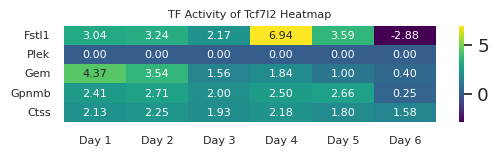

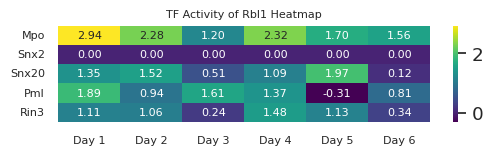

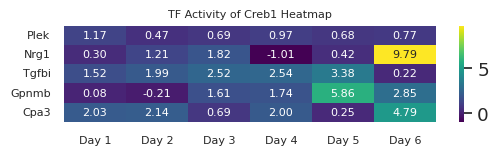

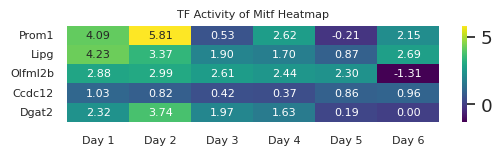

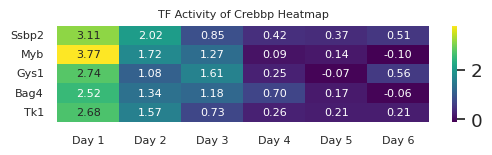

...

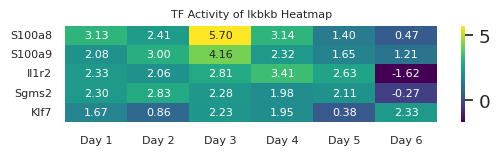

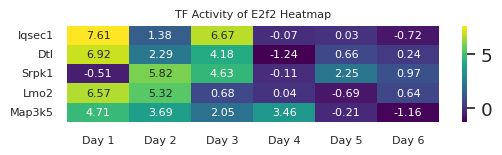

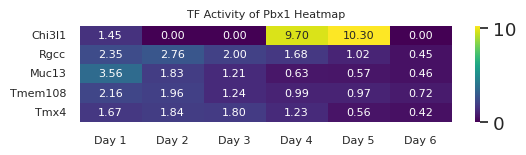

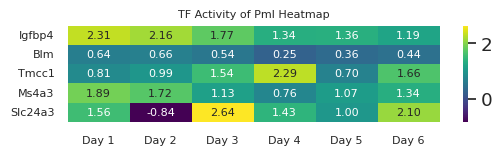

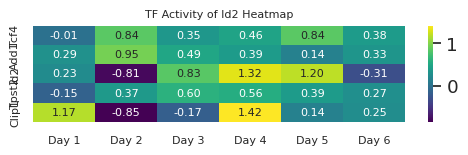

In [ ]:

tf_activity_df_list = []
for tf in range(len(index)):
    filtered_df = day_values_df.filter(like=index[tf], axis=0)[top5_tg[tf]]
    tf_activity_df = pd.DataFrame()
    for tg in top5_tg[tf]:
        tf_activity_df_tg = filtered_df[tg]
        tf_activity_df_tg.columns=[f'Day {i+1}' for i in range(num_days)]
        tf_activity_df = pd.concat([tf_activity_df, tf_activity_df_tg], axis=0)
    tf_activity_df.index = top5_tg[tf]
    tf_activity_df_list.append(tf_activity_df)

    plt.figure(figsize=(num_days, top_num/4))
    sns.heatmap(tf_activity_df, annot=True, cmap='viridis', fmt='.2f', cbar=True, annot_kws={"size": 8})
    plt.title(f'TF Activity of {index[tf]} Heatmap', fontsize=8)
    # Ensure all y-ticks are displayed
    num_rows = len(tf_activity_df)
    plt.yticks([i + 0.5 for i in range(num_rows)], tf_activity_df.index, fontsize=8)
    plt.xticks(fontsize=8)
    plt.show()